<a href="https://colab.research.google.com/github/alexcrich/Spoon-Knife/blob/main/online_summer_2024_contingency_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mounting the data and all that good stuff (need to do any time you want to edit/re-run)

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# List files in the shared folder
import os

# List files in the folder
files = os.listdir(shared_folder_path)
print("Files in the shared folder:")
for file in files:
    print(file)

Mounted at /content/drive
Files in the shared folder:
592_task.csv
593_task.csv
594_task.csv
595_task.csv
596_task.csv
597_task.csv
600_task.csv
603_task.csv
608_task.csv
610_task.csv
609_task.csv
626_task.csv
616_task.csv
617_task.csv
618_task.csv
619_task.csv
625_task.csv
627_task.csv
628_task.csv
634_task.csv
online contingency analysis.ipynb


In [ ]:
import os
import pandas as pd

participant_data = {}

for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        participant_id = file_name.split('.')[0]  # Extract participant ID from file name
        file_path = os.path.join(shared_folder_path, file_name)
        # Read the CSV file into a DataFrame
        participant_dfs = pd.read_csv(file_path)
        # Store the DataFrame in the dictionary with participant ID as the key
        participant_data[participant_id] = participant_dfs

# Now participant_data contains data for all participants

#for participant_id, df in participant_data.items():
    #print(f"Participant ID: {participant_id}")
    #print(df)  # Print the current participant's DataFrame


# Avoids scroll-in-the-scroll in the entire Notebook
from IPython.display import Javascript
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)


# Within participants

**Includes:**

1.   Accuracy by Block
2.   Number of Trials in Each Block

1.   Accuracy by Trial with Probabilistic Event and Block Changes
2.   Accuracy by Trial Type (with t-test)

1.   Accuracy by Image Rating (with chi-squared)

## For one participant at a time (specify)

<IPython.core.display.Javascript object>

Processing data for participant 593_task
          Image      Image Rating Expectation   Outcome  Response Time  \
0    cantaloupe              like    negative  negative          418.0   
1  celerysticks  strongly_dislike    positive  positive          413.0   
2         sushi     strongly_like    negative  negative          431.0   
3   bakedpotato           dislike    positive  negative          366.0   
4         sushi     strongly_like    negative  negative          756.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2701.0       504     True                   True                False   
1    2409.5       708     True                   True                False   
2    2754.5       963     True                   True                False   
3    2525.0       528    False                   True                 True   
4    2156.0       598     True                   True                False   

  Trial type  
0  unaligned  
1  unaligned  


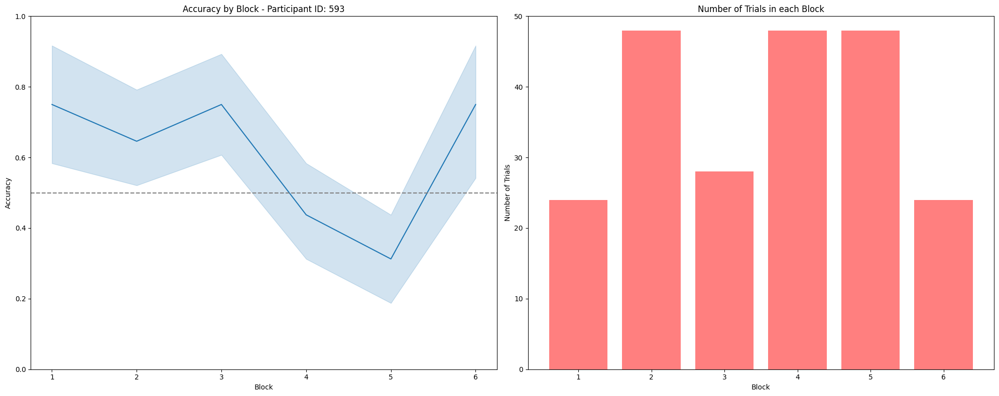

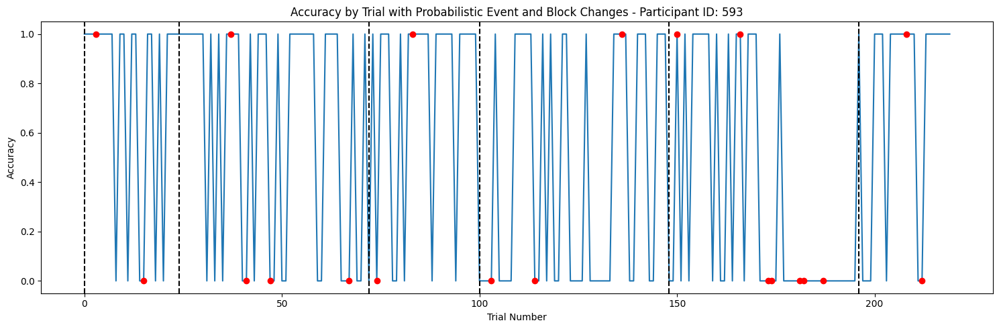

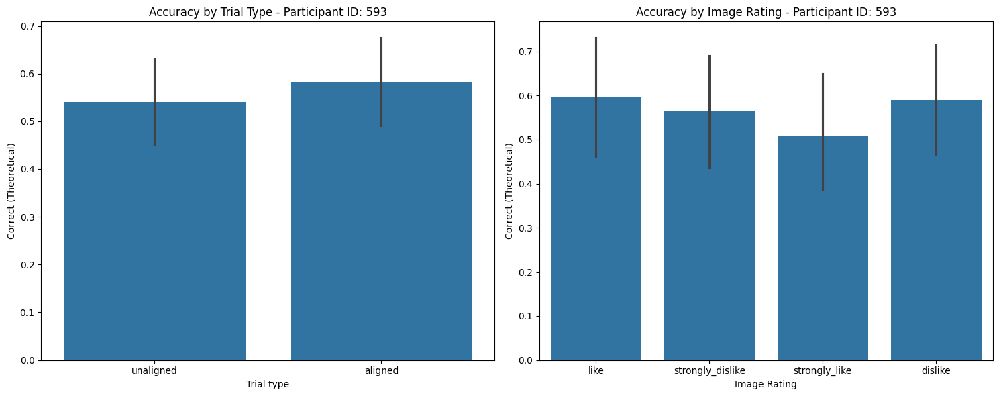

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Define the participant ID you want to process
participant_id = '593_task'  # Replace with the actual participant ID

# Construct the file name for the specified participant
file_name = f'{participant_id}.csv'
file_path = os.path.join(shared_folder_path, file_name)

if os.path.isfile(file_path):
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)

    # Process the DataFrame as needed
    print(f'Processing data for participant {participant_id}')
    print(df.head())  # Example of processing - adjust as needed
else:
    print(f'File for participant {participant_id} does not exist in the folder.')

# Define blocks based on switches in 'Trial type'
df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

# Number of trials in each 'Block'
block_counts = df['Block'].value_counts()

# Accuracy in each 'Block'
block_accuracy = df.groupby('Block')['Correct (Theoretical)'].mean()

# Accuracy per 'Trial type' (aligned and unaligned)
trial_type_accuracy = df.groupby('Trial type')['Correct (Theoretical)'].mean()
ttest_p_value_tt = ttest_ind(df[df['Trial type'] == 'aligned']['Correct (Theoretical)'],
                            df[df['Trial type'] == 'unaligned']['Correct (Theoretical)'], nan_policy='omit').pvalue

# Accuracy over the whole task
df['Block Change'] = df['Block'].ne(df['Block'].shift())
df['All Trials'] = 'All Trials'
overall_accuracy = df.groupby(['All Trials', 'Block'])['Correct (Theoretical)'].mean()

# Accuracy as a function of 'Image Rating'
# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

# Create a contingency table
contingency_table = pd.crosstab(df['Image Rating'], df['Correct (Binary)'])

# Perform chi-squared test
chi2, p, _, _ = chi2_contingency(contingency_table)

# Output results
print(f"Participant ID: {participant_id.split('_')[0]}")
print("Number of trials in each 'Block':")
print(block_counts)
print("\nAccuracy in each 'Block':")
print(block_accuracy)
print("\nAccuracy per 'Trial type' (aligned and unaligned):")
print(trial_type_accuracy)
print(f"t-test p-value for 'Trial type': {ttest_p_value_tt}")
print("\nAccuracy over the whole task:")
print(overall_accuracy)
print("\nAccuracy as a function of 'Image Rating':")
print(df.groupby('Image Rating')['Correct (Binary)'].mean())
print(f"Chi-squared p-value for 'Image Rating': {p:.15f}")
print("Data for Chi-squared test:")
print(contingency_table)


# Visualization

# Create a 1x2 figure for Accuracy by Block and Number of trials in each Block
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Accuracy by Block
sns.lineplot(x='Block', y='Correct (Theoretical)', data=df, ax=axs[0])
axs[0].set_ylabel('Accuracy')
axs[0].axhline(y=0.5, color='gray', linestyle='--')  # Add a dotted line at y=0.5
axs[0].set_ylim(0, 1)  # Set y-axis limits to 0-1
axs[0].set_title(f"Accuracy by Block - Participant ID: {participant_id.split('_')[0]}")

# Number of trials in each Block
sorted_block_counts = block_counts.reindex(sorted(block_counts.index))
axs[1].bar(sorted_block_counts.index, sorted_block_counts, color='r', alpha=0.5)
axs[1].set_ylabel('Number of Trials')
axs[1].set_xlabel('Block')
axs[1].set_ylim(0, 50)  # Set y-axis limits to 0-50
axs[1].set_title('Number of Trials in each Block')

plt.tight_layout()
plt.show()

# Accuracy by Trial with Probabilistic Event and Block Changes
plt.figure(figsize=(15, 5))
sns.lineplot(x=df.index, y='Correct (Theoretical)', data=df)
for i, event in enumerate(df['Probabilistic event']):
    if event:
        plt.plot(i, df.loc[i, 'Correct (Theoretical)'], 'ro')
for i, change in enumerate(df['Block Change']):
    if change:
        plt.axvline(x=i, linestyle='--', color='k')
plt.title(f"Accuracy by Trial with Probabilistic Event and Block Changes - Participant ID: {participant_id.split('_')[0]}")
plt.ylabel('Accuracy')
plt.xlabel('Trial Number')
plt.tight_layout()
plt.show()

# Accuracy by Trial Type and Image Rating
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Accuracy by Trial Type
sns.barplot(x='Trial type', y='Correct (Theoretical)', data=df, ax=axs[0])
axs[0].set_title(f"Accuracy by Trial Type - Participant ID: {participant_id.split('_')[0]}")
if ttest_p_value_tt < 0.05:
    height = max(df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
    axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
    axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt:.3f}', ha='center', va='bottom')

# Accuracy by Image Rating
sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=df, ax=axs[1])
axs[1].set_title(f"Accuracy by Image Rating - Participant ID: {participant_id.split('_')[0]}")
if p < 0.05:
    height = max(df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
    axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
    axs[1].text(1.5, height + 0.01, f'p={p:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


##Changing learning criterion

### last 10 trials 75% correct = switch (keeping minumum 20 trials)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

75% correct trials found in the last 10 trials at index: [171, 172, 173, 174, 175, 176, 177, 178, 179, 180]
75% correct trials found in the last 10 trials at index: [202, 203, 204, 205, 206, 207, 208, 209, 210, 211]
75% correct trials found in the last 10 trials at index: [222, 223, 224, 225, 226, 227, 228, 229, 230, 231]


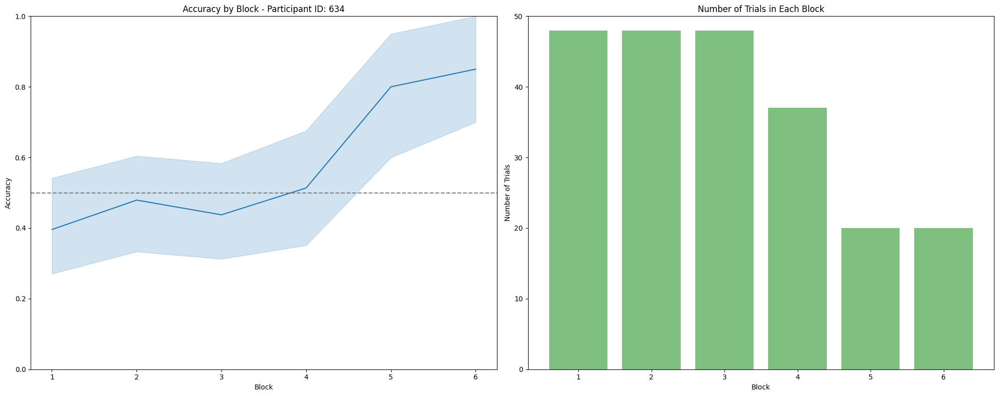

Aligned length of event_indices: 18
Aligned length of correct_values: 18


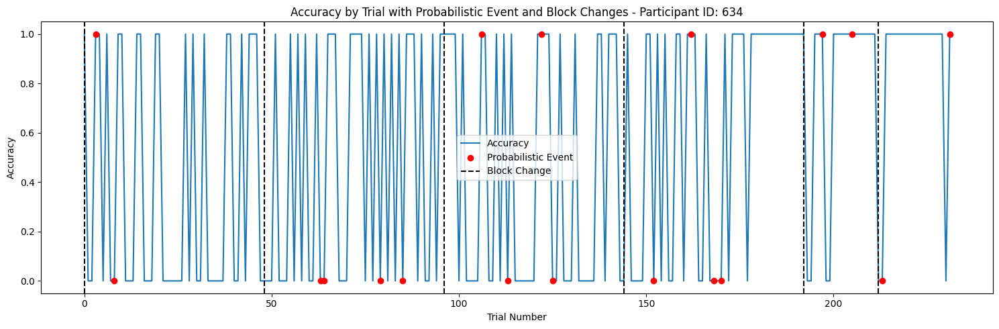

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Define the participant ID you want to process
participant_id = '634_task'  # Replace with the actual participant ID

# Construct the file name for the specified participant
file_name = f'{participant_id}.csv'
file_path = os.path.join(shared_folder_path, file_name)

if os.path.isfile(file_path):
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)
else:
    print(f'File for participant {participant_id} does not exist in the folder.')

# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

# Identify blocks based on trial type changes (aligned/unaligned)
df['Block'] = (df['Trial type'] != df['Trial type'].shift()).cumsum()

# Initialize a list to store the indices of trials to keep
trials_to_keep = []

# Loop through each block to find when 75% of the last 10 trials are correct after at least 20 trials
for block_num in df['Block'].unique():
    block_data = df[df['Block'] == block_num]

    # Ensure the first 20 trials are kept
    trials_to_keep.extend(block_data.index[:20])

    # Start filtering after the 20th trial
    for i in range(10, len(block_data) - 9):  # Start checking from the 11th trial to allow a full window of 10 trials
        last_10_trials = block_data.iloc[i:i+10]['Correct (Binary)']
        if last_10_trials.mean() >= 0.75:
            print(f"75% correct trials found in the last 10 trials at index: {block_data.index[i:i+10].tolist()}")
            # Keep all trials up to and including the 10th trial in the sequence
            trials_to_keep.extend(block_data.index[:i+10])
            break
    else:
        # If no 75% correct trials are found, keep the entire block
        trials_to_keep.extend(block_data.index[20:])

# Filter the dataframe to only include the selected trials
df_filtered = df.loc[sorted(set(trials_to_keep))]  # Use sorted(set()) to avoid duplicates and ensure proper indexing

# Re-assign blocks to ensure they are correctly identified
df_filtered['Block'] = (df_filtered['Trial type'] != df_filtered['Trial type'].shift()).cumsum()

# Check if you have a 'Probabilistic event' column or generate a dummy one
# If 'Probabilistic event' column is not in your data, create one for demonstration purposes
if 'Probabilistic event' not in df_filtered.columns:
    # Example: Simulate probabilistic events at random intervals
    df_filtered['Probabilistic event'] = df_filtered.index % 20 == 0  # Replace this with your actual logic

# Mark block changes
df_filtered['Block Change'] = df_filtered['Block'] != df_filtered['Block'].shift(1)

# Create a 1x2 figure for Accuracy by Block and Number of Trials in Each Block
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Accuracy by Block
sns.lineplot(x='Block', y='Correct (Theoretical)', data=df_filtered, ax=axs[0])
axs[0].set_ylabel('Accuracy')
axs[0].axhline(y=0.5, color='gray', linestyle='--')  # Add a dotted line at y=0.5
axs[0].set_ylim(0, 1)  # Set y-axis limits to 0-1
axs[0].set_title(f"Accuracy by Block - Participant ID: {participant_id.split('_')[0]}")

# Number of Trials in Each Block
df_filtered['Trial number'] = df_filtered.groupby('Block').cumcount() + 1
block_sizes = df_filtered.groupby('Block')['Trial number'].max()

axs[1].bar(block_sizes.index, block_sizes, color='g', alpha=0.5)
axs[1].set_ylabel('Number of Trials')
axs[1].set_xlabel('Block')
axs[1].set_ylim(0, 50)  # Adjust y-axis limit to reflect max number of trials
axs[1].set_title('Number of Trials in Each Block')

plt.tight_layout()
plt.show()

# Accuracy by Trial with Probabilistic Events and Block Changes
plt.figure(figsize=(15, 5))
sns.lineplot(x=df_filtered.index, y='Correct (Theoretical)', data=df_filtered, label='Accuracy')

# Get indices where 'Probabilistic event' is True
event_indices = df_filtered.index[df_filtered['Probabilistic event']]
correct_values = df_filtered.loc[event_indices, 'Correct (Theoretical)']

# Debug: Print lengths for verification
print(f"Aligned length of event_indices: {len(event_indices)}")
print(f"Aligned length of correct_values: {len(correct_values)}")

# Check and plot only if lengths match
if len(event_indices) == len(correct_values):
    plt.scatter(event_indices, correct_values, color='red', label='Probabilistic Event', zorder=5)
else:
    print("Error: Mismatch between event_indices and correct_values lengths")

# Plot block changes
block_change_indices = df_filtered.index[df_filtered['Block Change']]
for x in block_change_indices:
    plt.axvline(x=x, linestyle='--', color='k', label='Block Change' if x == block_change_indices[0] else "")

plt.title(f"Accuracy by Trial with Probabilistic Event and Block Changes - Participant ID: {participant_id.split('_')[0]}")
plt.ylabel('Accuracy')
plt.xlabel('Trial Number')
plt.legend()
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

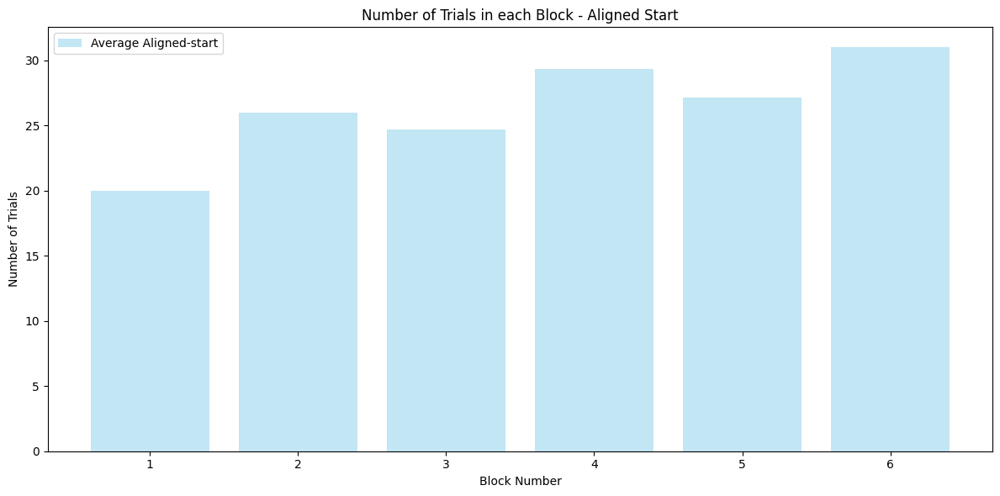

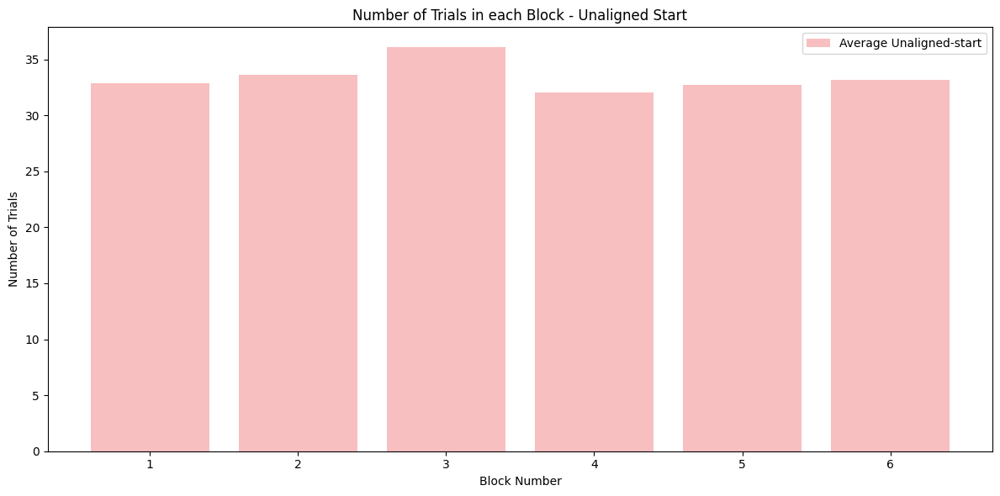


Accuracy per 'Trial type' (aligned and unaligned) for filtered data (average across participants):
Trial type
aligned      0.587328
unaligned    0.554353
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type' (filtered data, average across participants): 0.04136209085870956

Accuracy as a function of 'Image Rating' for filtered data (average across participants):
Image Rating
dislike             0.561845
like                0.565635
strongly_dislike    0.588491
strongly_like       0.565678
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating' (filtered data, average across participants): 0.639732049300542
Data for Chi-squared test (filtered data, average across participants):
Correct (Binary)    0    1
Image Rating              
dislike           418  536
like              407  530
strongly_dislike  379  542
strongly_like     410  534


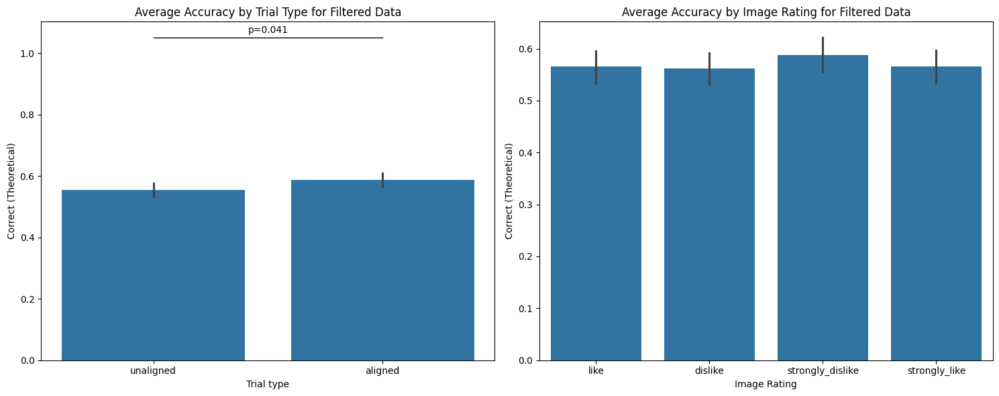

<Figure size 1200x800 with 0 Axes>

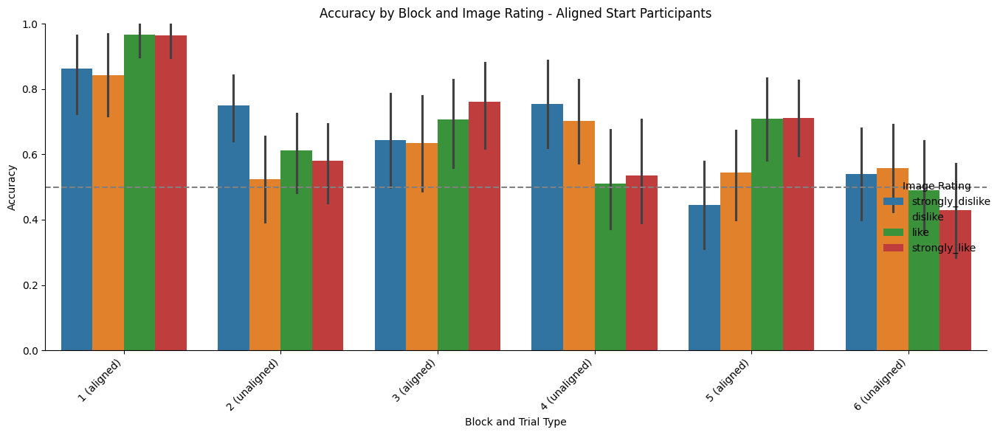

<Figure size 1200x800 with 0 Axes>

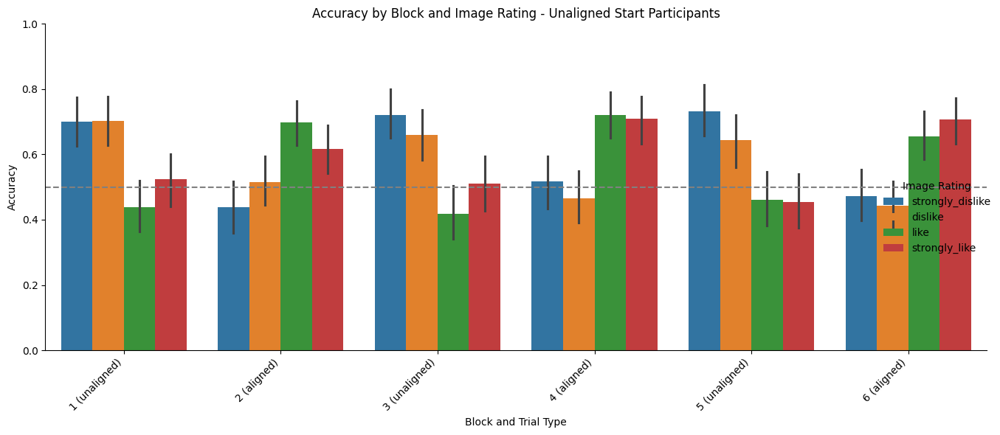

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize lists to store data from each participant and block counts
all_data_filtered = []
aligned_block_counts = []
unaligned_block_counts = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Identify blocks based on trial type changes (aligned/unaligned)
        df['Block'] = (df['Trial type'] != df['Trial type'].shift()).cumsum()

        # Initialize a list to store the indices of trials to keep
        trials_to_keep = []

        # Loop through each block to find when 75% of the last 10 trials are correct after at least 20 trials
        for block_num in df['Block'].unique():
            block_data = df[df['Block'] == block_num]

            # Ensure the first 20 trials are kept
            trials_to_keep.extend(block_data.index[:20])

            # Start filtering after the 20th trial
            for i in range(10, len(block_data) - 9):  # Start checking from the 11th trial to allow a full window of 10 trials
                last_10_trials = block_data.iloc[i:i+10]['Correct (Binary)']
                if last_10_trials.mean() >= 0.75:
                    trials_to_keep.extend(block_data.index[:i+10])
                    break
            else:
                # If no 75% correct trials are found, keep the entire block
                trials_to_keep.extend(block_data.index[20:])

        # Remove duplicates and sort indices
        trials_to_keep = sorted(set(trials_to_keep))

        # Filter the dataframe to only include the selected trials
        df_filtered = df.loc[trials_to_keep]

        # Re-assign blocks to ensure they are correctly identified
        df_filtered['Block'] = (df_filtered['Trial type'] != df_filtered['Trial type'].shift()).cumsum()

        # Append the filtered DataFrame to the list
        all_data_filtered.append(df_filtered)

        # Number of trials in each Block
        block_counts = df_filtered['Block'].value_counts().sort_index()

        # Separate out aligned and unaligned starts
        if df['Trial type'].iloc[0] == 'aligned':
            aligned_block_counts.append(block_counts)
        else:
            unaligned_block_counts.append(block_counts)

# Concatenate all filtered DataFrames into a single DataFrame
all_data_filtered_df = pd.concat(all_data_filtered, ignore_index=True)

# Calculate the average number of trials in each block across participants for aligned starts
aligned_block_counts_df = pd.concat(aligned_block_counts, axis=1)
avg_aligned_block_counts = aligned_block_counts_df.mean(axis=1)

# Calculate the average number of trials in each block across participants for unaligned starts
unaligned_block_counts_df = pd.concat(unaligned_block_counts, axis=1)
avg_unaligned_block_counts = unaligned_block_counts_df.mean(axis=1)

# Plotting the number of trials in each Block, separated by Unaligned and Aligned starts

# Plot for aligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_aligned_block_counts) + 1), avg_aligned_block_counts, color='skyblue', alpha=0.5, label='Average Aligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_aligned_block_counts) + 1), range(1, len(avg_aligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Aligned Start')
plt.legend()
plt.tight_layout()
plt.show()

# Plot for unaligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_unaligned_block_counts) + 1), avg_unaligned_block_counts, color='lightcoral', alpha=0.5, label='Average Unaligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_unaligned_block_counts) + 1), range(1, len(avg_unaligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Unaligned Start')
plt.legend()
plt.tight_layout()
plt.show()

# -------------------
# Additional Analysis and Plotting for Filtered Data
# -------------------

# Accuracy per 'Trial type' (aligned and unaligned) for filtered data
trial_type_accuracy_filtered = all_data_filtered_df.groupby('Trial type')['Correct (Theoretical)'].mean()
ttest_p_value_tt_filtered = ttest_ind(
    all_data_filtered_df[all_data_filtered_df['Trial type'] == 'aligned']['Correct (Theoretical)'],
    all_data_filtered_df[all_data_filtered_df['Trial type'] == 'unaligned']['Correct (Theoretical)'],
    nan_policy='omit'
).pvalue

# Accuracy as a function of 'Image Rating' for filtered data
# Create a contingency table
contingency_table_filtered = pd.crosstab(all_data_filtered_df['Image Rating'], all_data_filtered_df['Correct (Binary)'])

# Perform chi-squared test
chi2_filtered, p_filtered, _, _ = chi2_contingency(contingency_table_filtered)

# Output results for filtered data
print("\nAccuracy per 'Trial type' (aligned and unaligned) for filtered data (average across participants):")
print(trial_type_accuracy_filtered)
print(f"t-test p-value for 'Trial type' (filtered data, average across participants): {ttest_p_value_tt_filtered}")

print("\nAccuracy as a function of 'Image Rating' for filtered data (average across participants):")
print(all_data_filtered_df.groupby('Image Rating')['Correct (Binary)'].mean())
print(f"Chi-squared p-value for 'Image Rating' (filtered data, average across participants): {p_filtered:.15f}")
print("Data for Chi-squared test (filtered data, average across participants):")
print(contingency_table_filtered)

# Visualization for Filtered Data

# Accuracy by Trial Type and Image Rating
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Accuracy by Trial Type for Filtered Data
sns.barplot(x='Trial type', y='Correct (Theoretical)', data=all_data_filtered_df, ax=axs[0])
axs[0].set_title('Average Accuracy by Trial Type for Filtered Data')
if ttest_p_value_tt_filtered < 0.05:
    height = max(all_data_filtered_df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
    axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
    axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt_filtered:.3f}', ha='center', va='bottom')

# Accuracy by Image Rating for Filtered Data
sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=all_data_filtered_df, ax=axs[1])
axs[1].set_title('Average Accuracy by Image Rating for Filtered Data')
if p_filtered < 0.05:
    height = max(all_data_filtered_df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
    axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
    axs[1].text(1.5, height + 0.01, f'p={p_filtered:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Define a function to plot accuracy by block and image rating for each group
def plot_accuracy_by_block_image_rating(all_data_filtered_df, title_suffix):
    # Ensure 'Image Rating' is in the specified order
    rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']
    all_data_filtered_df['Image Rating'] = pd.Categorical(all_data_filtered_df['Image Rating'], categories=rating_order, ordered=True)

    # Plot Accuracy by Block and Image Rating
    plt.figure(figsize=(12, 8))
    sns.catplot(
        data=all_data_filtered_df,
        x='Block_Type',
        y='Correct (Binary)',
        hue='Image Rating',
        hue_order=rating_order,  # Specify the order of the hue categories
        kind='bar',
        height=6,
        aspect=2,
        legend_out=True
    )

    plt.title(f'Accuracy by Block and Image Rating - {title_suffix} Participants')
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')  # Add a dotted line at y=0.5
    plt.ylim(0, 1)  # Set y-axis limits to 0-1
    plt.xlabel('Block and Trial Type')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()

# Plot for aligned-start participants
plot_accuracy_by_block_image_rating(aligned_start_df, 'Aligned Start')

# Plot for unaligned-start participants
plot_accuracy_by_block_image_rating(unaligned_start_df, 'Unaligned Start')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

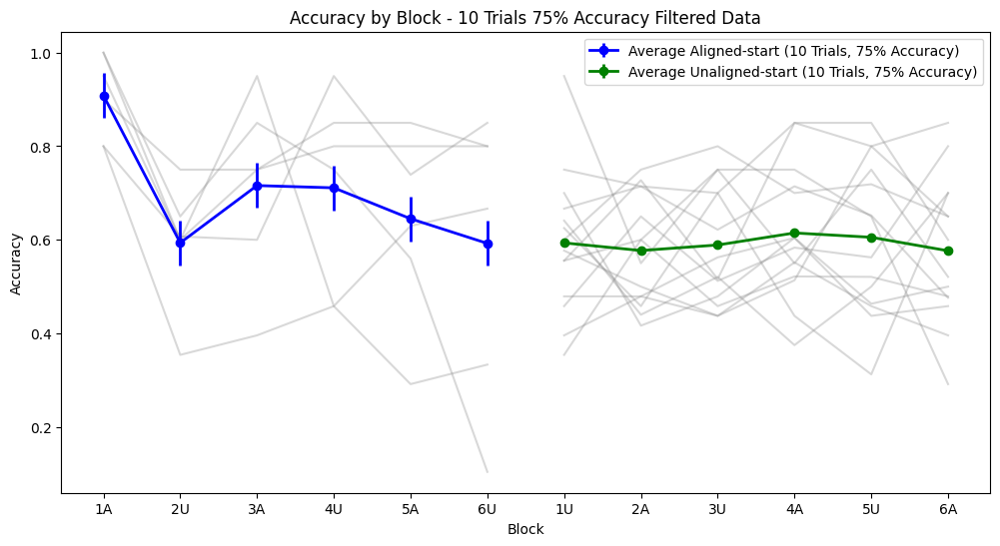

In [ ]:
*

### last 5 trials all correct = switch (keeping minumum 20 trials)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

100% correct trials found in the last 5 trials at index: [178, 179, 180, 181, 182]


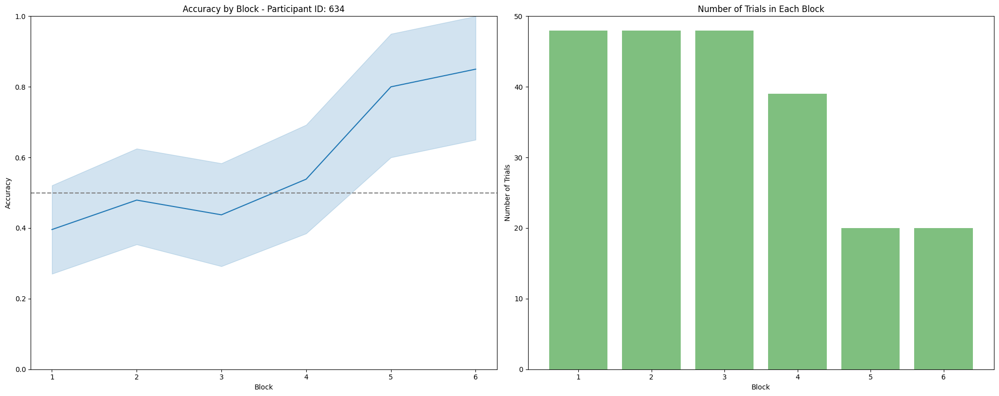

Aligned length of event_indices: 18
Aligned length of correct_values: 18


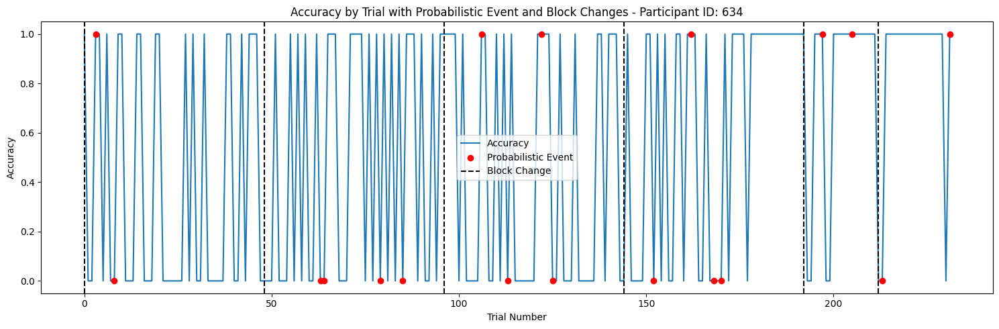

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Access the shared folder--
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Define the participant ID you want to process
participant_id = '634_task'  # Replace with the actual participant ID

# Construct the file name for the specified participant
file_name = f'{participant_id}.csv'
file_path = os.path.join(shared_folder_path, file_name)

if os.path.isfile(file_path):
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)
else:
    print(f'File for participant {participant_id} does not exist in the folder.')

# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

# Identify blocks based on trial type changes (aligned/unaligned)
df['Block'] = (df['Trial type'] != df['Trial type'].shift()).cumsum()

# Initialize a list to store the indices of trials to keep
trials_to_keep = []

# Loop through each block to find when the last 5 trials are 100% correct after at least 20 trials
for block_num in df['Block'].unique():
    block_data = df[df['Block'] == block_num]

    # Ensure the first 20 trials are kept
    trials_to_keep.extend(block_data.index[:20])

    # Start filtering after the 20th trial
    for i in range(20, len(block_data) - 4):  # Start checking from the 21st trial to allow a full window of 5 trials
        last_5_trials = block_data.iloc[i:i+5]['Correct (Binary)']
        if last_5_trials.sum() == 5:  # Check if the last 5 trials are 100% correct
            print(f"100% correct trials found in the last 5 trials at index: {block_data.index[i:i+5].tolist()}")
            # Keep all trials up to and including the 5th trial in the sequence
            trials_to_keep.extend(block_data.index[:i+5])
            break
    else:
        # If no 100% correct trials are found, keep the entire block
        trials_to_keep.extend(block_data.index[20:])

# Remove duplicates and sort indices
trials_to_keep = sorted(set(trials_to_keep))

# Filter the dataframe to only include the selected trials
df_filtered = df.loc[trials_to_keep]

# Re-assign blocks to ensure they are correctly identified
df_filtered['Block'] = (df_filtered['Trial type'] != df_filtered['Trial type'].shift()).cumsum()

# Check if you have a 'Probabilistic event' column or generate a dummy one
# If 'Probabilistic event' column is not in your data, create one for demonstration purposes
if 'Probabilistic event' not in df_filtered.columns:
    # Example: Simulate probabilistic events at random intervals
    df_filtered['Probabilistic event'] = df_filtered.index % 20 == 0  # Replace this with your actual logic

# Mark block changes
df_filtered['Block Change'] = df_filtered['Block'] != df_filtered['Block'].shift(1)

# Create a 1x2 figure for Accuracy by Block and Number of Trials in Each Block
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Accuracy by Block
sns.lineplot(x='Block', y='Correct (Theoretical)', data=df_filtered, ax=axs[0])
axs[0].set_ylabel('Accuracy')
axs[0].axhline(y=0.5, color='gray', linestyle='--')  # Add a dotted line at y=0.5
axs[0].set_ylim(0, 1)  # Set y-axis limits to 0-1
axs[0].set_title(f"Accuracy by Block - Participant ID: {participant_id.split('_')[0]}")

# Number of Trials in Each Block
df_filtered['Trial number'] = df_filtered.groupby('Block').cumcount() + 1
block_sizes = df_filtered.groupby('Block')['Trial number'].max()

axs[1].bar(block_sizes.index, block_sizes, color='g', alpha=0.5)
axs[1].set_ylabel('Number of Trials')
axs[1].set_xlabel('Block')
axs[1].set_ylim(0, 50)  # Adjust y-axis limit to reflect max number of trials
axs[1].set_title('Number of Trials in Each Block')

plt.tight_layout()
plt.show()

# Accuracy by Trial with Probabilistic Events and Block Changes
plt.figure(figsize=(15, 5))
sns.lineplot(x=df_filtered.index, y='Correct (Theoretical)', data=df_filtered, label='Accuracy')

# Get indices where 'Probabilistic event' is True
event_indices = df_filtered.index[df_filtered['Probabilistic event']]
correct_values = df_filtered.loc[event_indices, 'Correct (Theoretical)']

# Debug: Print lengths for verification
print(f"Aligned length of event_indices: {len(event_indices)}")
print(f"Aligned length of correct_values: {len(correct_values)}")

# Check and plot only if lengths match
if len(event_indices) == len(correct_values):
    plt.scatter(event_indices, correct_values, color='red', label='Probabilistic Event', zorder=5)
else:
    print("Error: Mismatch between event_indices and correct_values lengths")

# Plot block changes
block_change_indices = df_filtered.index[df_filtered['Block Change']]
for x in block_change_indices:
    plt.axvline(x=x, linestyle='--', color='k', label='Block Change' if x == block_change_indices[0] else "")

plt.title(f"Accuracy by Trial with Probabilistic Event and Block Changes - Participant ID: {participant_id.split('_')[0]}")
plt.ylabel('Accuracy')
plt.xlabel('Trial Number')
plt.legend()
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


Accuracy per 'Trial type' (aligned and unaligned) for filtered data (average across participants):
Trial type
aligned      0.589593
unaligned    0.560256
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type' (filtered data, average across participants): 0.05838445376013893

Accuracy as a function of 'Image Rating' for filtered data (average across participants):
Image Rating
dislike             0.564797
like                0.571570
strongly_dislike    0.583000
strongly_like       0.580645
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating' (filtered data, average across participants): 0.829175568148331
Data for Chi-squared test (filtered data, average across participants):
Correct (Binary)    0    1
Image Rating              
dislike           450  584
like              434  579
strongly_dislike  417  583
strongly_like     429  594


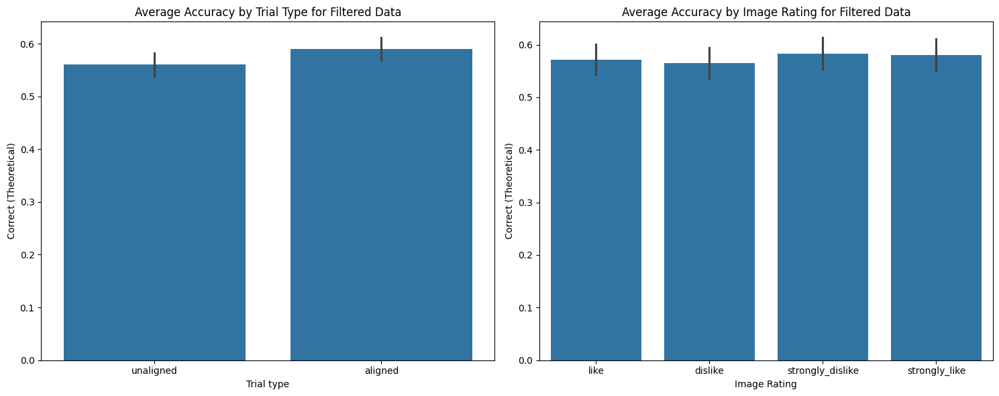

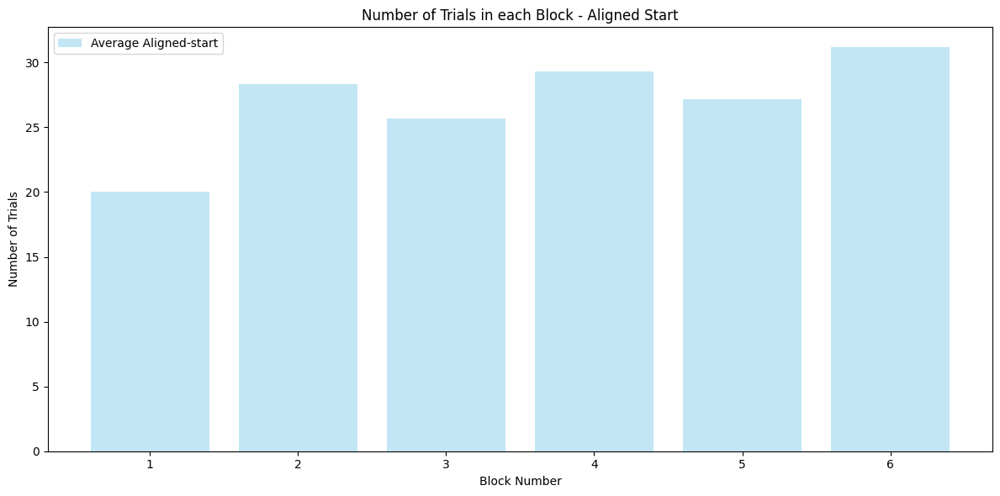

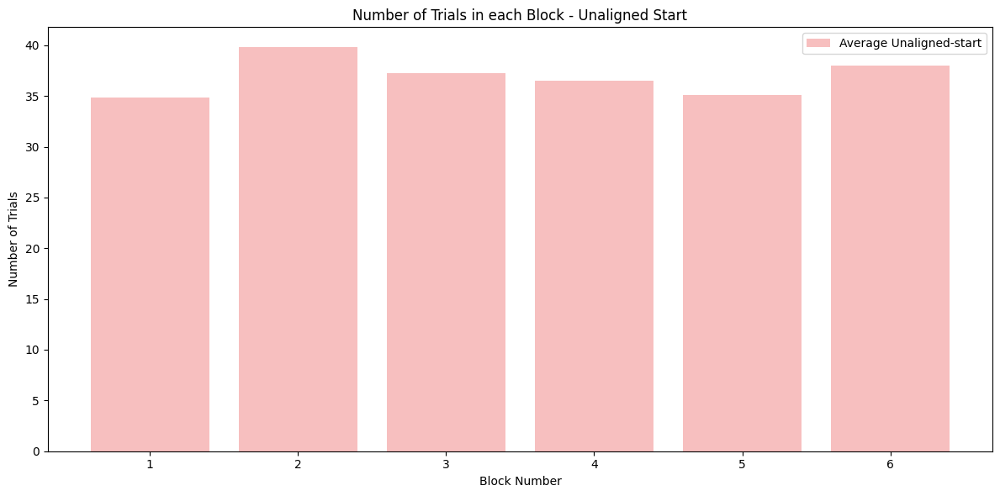

<Figure size 1200x800 with 0 Axes>

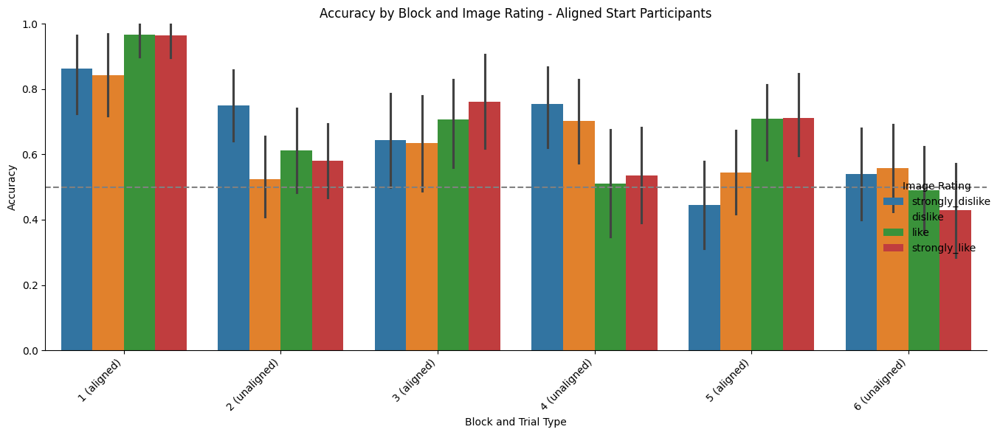

<Figure size 1200x800 with 0 Axes>

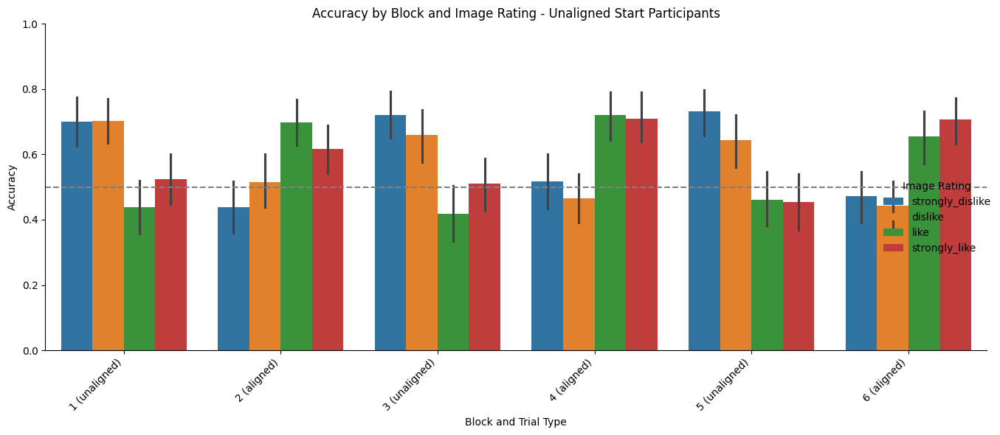

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize empty lists to store aggregated data
aligned_block_counts = []
unaligned_block_counts = []
all_data_filtered = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Identify blocks based on trial type changes (aligned/unaligned)
        df['Block'] = (df['Trial type'] != df['Trial type'].shift()).cumsum()

        # Initialize a list to store the indices of trials to keep
        trials_to_keep = []

        # Loop through each block to find when the last 5 trials are 100% correct after at least 20 trials
        for block_num in df['Block'].unique():
            block_data = df[df['Block'] == block_num]

            # Ensure the first 20 trials are kept
            trials_to_keep.extend(block_data.index[:20])

            # Start filtering after the 20th trial
            for i in range(20, len(block_data) - 4):  # Start checking from the 21st trial to allow a full window of 5 trials
                last_5_trials = block_data.iloc[i:i+5]['Correct (Binary)']
                if last_5_trials.sum() == 5:  # Check if the last 5 trials are 100% correct
                    trials_to_keep.extend(block_data.index[:i+5])
                    break
            else:
                # If no 100% correct trials are found, keep the entire block
                trials_to_keep.extend(block_data.index[20:])

        # Remove duplicates and sort indices
        trials_to_keep = sorted(set(trials_to_keep))

        # Filter the dataframe to only include the selected trials
        df_filtered = df.loc[trials_to_keep]

        # Re-assign blocks to ensure they are correctly identified
        df_filtered['Block'] = (df_filtered['Trial type'] != df_filtered['Trial type'].shift()).cumsum()

        # Number of trials in each Block
        block_counts = df_filtered['Block'].value_counts().sort_index()

        # Separate out aligned and unaligned starts
        if df['Trial type'].iloc[0] == 'aligned':
            aligned_block_counts.append(block_counts)
        else:
            unaligned_block_counts.append(block_counts)

        # Append filtered data to the overall list
        all_data_filtered.append(df_filtered)

# Combine all filtered data for additional analysis
all_data_filtered_df = pd.concat(all_data_filtered, ignore_index=True)

# -------------------
# Additional Analysis and Plotting for Filtered Data
# -------------------

# Accuracy per 'Trial type' (aligned and unaligned) for filtered data
trial_type_accuracy_filtered = all_data_filtered_df.groupby('Trial type')['Correct (Theoretical)'].mean()
ttest_p_value_tt_filtered = ttest_ind(
    all_data_filtered_df[all_data_filtered_df['Trial type'] == 'aligned']['Correct (Theoretical)'],
    all_data_filtered_df[all_data_filtered_df['Trial type'] == 'unaligned']['Correct (Theoretical)'],
    nan_policy='omit'
).pvalue

# Accuracy as a function of 'Image Rating' for filtered data
# Create a contingency table
contingency_table_filtered = pd.crosstab(all_data_filtered_df['Image Rating'], all_data_filtered_df['Correct (Binary)'])

# Perform chi-squared test
chi2_filtered, p_filtered, _, _ = chi2_contingency(contingency_table_filtered)

# Output results for filtered data
print("\nAccuracy per 'Trial type' (aligned and unaligned) for filtered data (average across participants):")
print(trial_type_accuracy_filtered)
print(f"t-test p-value for 'Trial type' (filtered data, average across participants): {ttest_p_value_tt_filtered}")

print("\nAccuracy as a function of 'Image Rating' for filtered data (average across participants):")
print(all_data_filtered_df.groupby('Image Rating')['Correct (Binary)'].mean())
print(f"Chi-squared p-value for 'Image Rating' (filtered data, average across participants): {p_filtered:.15f}")
print("Data for Chi-squared test (filtered data, average across participants):")
print(contingency_table_filtered)

# Visualization for Filtered Data

# Accuracy by Trial Type and Image Rating
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Accuracy by Trial Type for Filtered Data
sns.barplot(x='Trial type', y='Correct (Theoretical)', data=all_data_filtered_df, ax=axs[0])
axs[0].set_title('Average Accuracy by Trial Type for Filtered Data')
if ttest_p_value_tt_filtered < 0.05:
    height = max(all_data_filtered_df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
    axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
    axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt_filtered:.3f}', ha='center', va='bottom')

# Accuracy by Image Rating for Filtered Data
sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=all_data_filtered_df, ax=axs[1])
axs[1].set_title('Average Accuracy by Image Rating for Filtered Data')
if p_filtered < 0.05:
    height = max(all_data_filtered_df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
    axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
    axs[1].text(1.5, height + 0.01, f'p={p_filtered:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# -------------------
# Original Block Count Analysis and Plotting
# -------------------

# Calculate the average number of trials in each block across participants for aligned starts
aligned_block_counts_df = pd.concat(aligned_block_counts, axis=1)
avg_aligned_block_counts = aligned_block_counts_df.mean(axis=1)

# Calculate the average number of trials in each block across participants for unaligned starts
unaligned_block_counts_df = pd.concat(unaligned_block_counts, axis=1)
avg_unaligned_block_counts = unaligned_block_counts_df.mean(axis=1)

# Plotting the number of trials in each Block, separated by Unaligned and Aligned starts

# Plot for aligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_aligned_block_counts) + 1), avg_aligned_block_counts, color='skyblue', alpha=0.5, label='Average Aligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_aligned_block_counts) + 1), range(1, len(avg_aligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Aligned Start')
plt.legend()
plt.tight_layout()
plt.show()

# Plot for unaligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_unaligned_block_counts) + 1), avg_unaligned_block_counts, color='lightcoral', alpha=0.5, label='Average Unaligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_unaligned_block_counts) + 1), range(1, len(avg_unaligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Unaligned Start')
plt.legend()
plt.tight_layout()
plt.show()

# Define a function to plot accuracy by block and image rating for each group
def plot_accuracy_by_block_image_rating(all_data_filtered_df, title_suffix):
    # Ensure 'Image Rating' is in the specified order
    rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']
    all_data_filtered_df['Image Rating'] = pd.Categorical(all_data_filtered_df['Image Rating'], categories=rating_order, ordered=True)

    # Plot Accuracy by Block and Image Rating
    plt.figure(figsize=(12, 8))
    sns.catplot(
        data=all_data_filtered_df,
        x='Block_Type',
        y='Correct (Binary)',
        hue='Image Rating',
        hue_order=rating_order,  # Specify the order of the hue categories
        kind='bar',
        height=6,
        aspect=2,
        legend_out=True
    )

    plt.title(f'Accuracy by Block and Image Rating - {title_suffix} Participants')
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')  # Add a dotted line at y=0.5
    plt.ylim(0, 1)  # Set y-axis limits to 0-1
    plt.xlabel('Block and Trial Type')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()

# Plot for aligned-start participants
plot_accuracy_by_block_image_rating(aligned_start_df, 'Aligned Start')

# Plot for unaligned-start participants
plot_accuracy_by_block_image_rating(unaligned_start_df, 'Unaligned Start')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

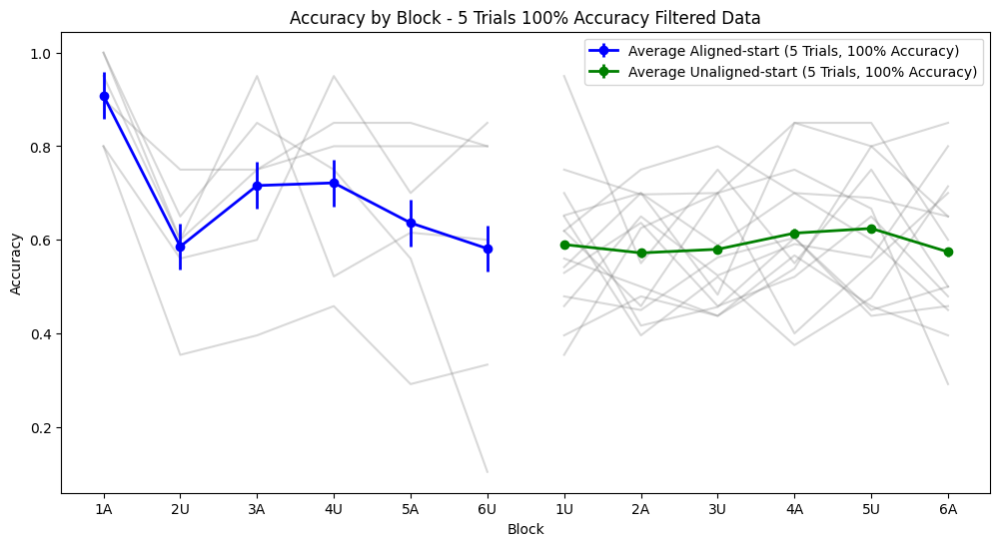

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize list to store aggregated data
filtered_5_trial_100_accuracy_block_accuracy = []

# Function to filter data based on the 100% accuracy criterion for the last 5 trials
def filter_data_5_trials_100_accuracy(df):
    df['Block Number'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()
    df['Block'] = df['Block Number'].astype(str) + df['Trial type'].apply(lambda x: 'A' if x == 'aligned' else 'U')

    # Initialize a list to store indices of trials to keep
    trials_to_keep = []

    # Loop through each block to apply the 100% accuracy filter
    for block_num in df['Block'].unique():
        block_data = df[df['Block'] == block_num]
        trials_to_keep.extend(block_data.index[:20])  # Keep the first 20 trials

        for i in range(5, len(block_data) - 4):
            last_5_trials = block_data.iloc[i:i+5]['Correct (Binary)']
            if last_5_trials.sum() == 5:  # Check if the last 5 trials are 100% correct
                trials_to_keep.extend(block_data.index[:i+5])
                break
        else:
            trials_to_keep.extend(block_data.index[20:])

    trials_to_keep = sorted(set(trials_to_keep))
    filtered_df = df.loc[trials_to_keep]
    return filtered_df

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Filter data based on 100% accuracy in the last 5 trials criterion
        filtered_5_trial_100_accuracy_df = filter_data_5_trials_100_accuracy(df)
        block_accuracy_5_trial_100_accuracy = filtered_5_trial_100_accuracy_df.groupby('Block')['Correct (Theoretical)'].mean()
        filtered_5_trial_100_accuracy_block_accuracy.append(block_accuracy_5_trial_100_accuracy)

# Plotting across participants for 5 trial 100% accuracy filtered data

plt.figure(figsize=(12, 6))

# Separate data for 'Aligned' and 'Unaligned' starts
aligned_data_5_trials = [block_accuracy for block_accuracy in filtered_5_trial_100_accuracy_block_accuracy if 'A' in block_accuracy.index[0]]
unaligned_data_5_trials = [block_accuracy for block_accuracy in filtered_5_trial_100_accuracy_block_accuracy if 'U' in block_accuracy.index[0]]

# Plot individual accuracies (faint grey lines) and average lines with error 'cloud'
for block_accuracy in aligned_data_5_trials:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_aligned_accuracy_5_trials = pd.concat(aligned_data_5_trials, axis=1).mean(axis=1)
plt.errorbar(avg_aligned_accuracy_5_trials.index, avg_aligned_accuracy_5_trials, yerr=avg_aligned_accuracy_5_trials.sem(), fmt='-o', color='blue', lw=2, label='Average Aligned-start (5 Trials, 100% Accuracy)')

for block_accuracy in unaligned_data_5_trials:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_unaligned_accuracy_5_trials = pd.concat(unaligned_data_5_trials, axis=1).mean(axis=1)
plt.errorbar(avg_unaligned_accuracy_5_trials.index, avg_unaligned_accuracy_5_trials, yerr=avg_unaligned_accuracy_5_trials.sem(), fmt='-o', color='green', lw=2, label='Average Unaligned-start (5 Trials, 100% Accuracy)')

plt.xlabel('Block')
plt.ylabel('Accuracy')
plt.title('Accuracy by Block - 5 Trials 100% Accuracy Filtered Data')
plt.legend()
plt.show()


## For all participants one by one

<IPython.core.display.Javascript object>

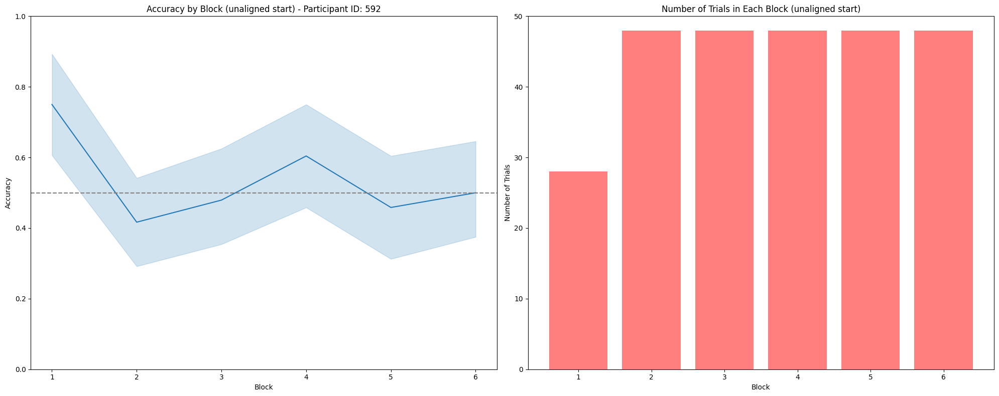

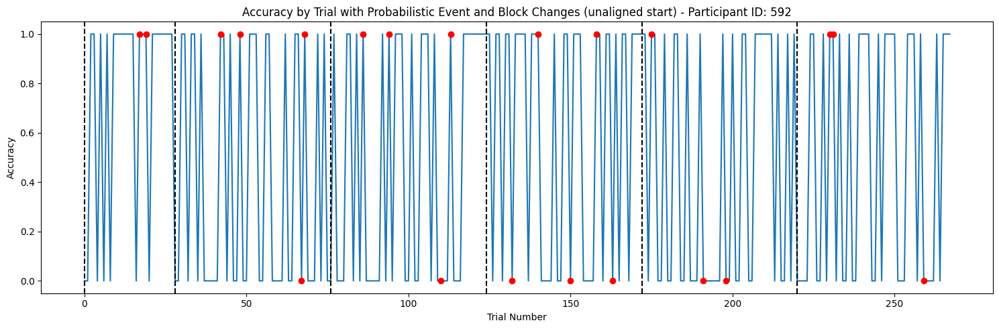

<Figure size 1200x800 with 0 Axes>

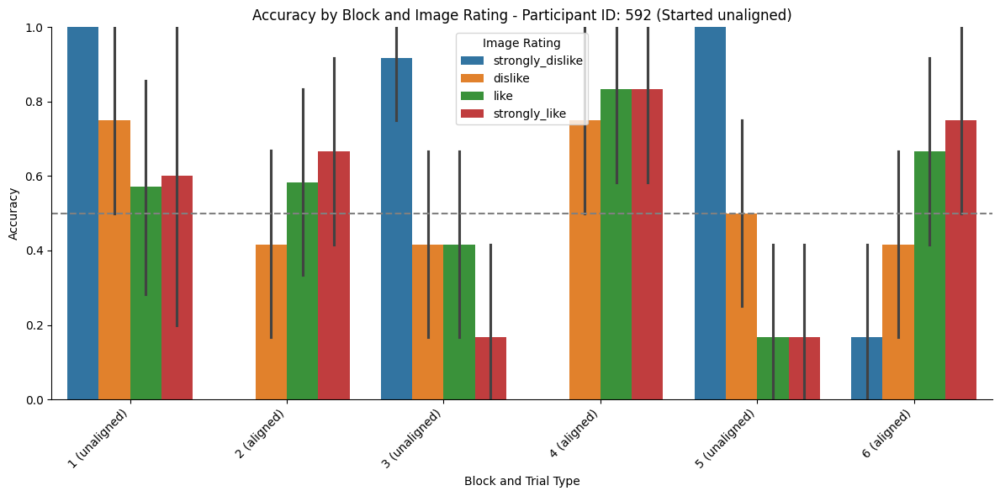

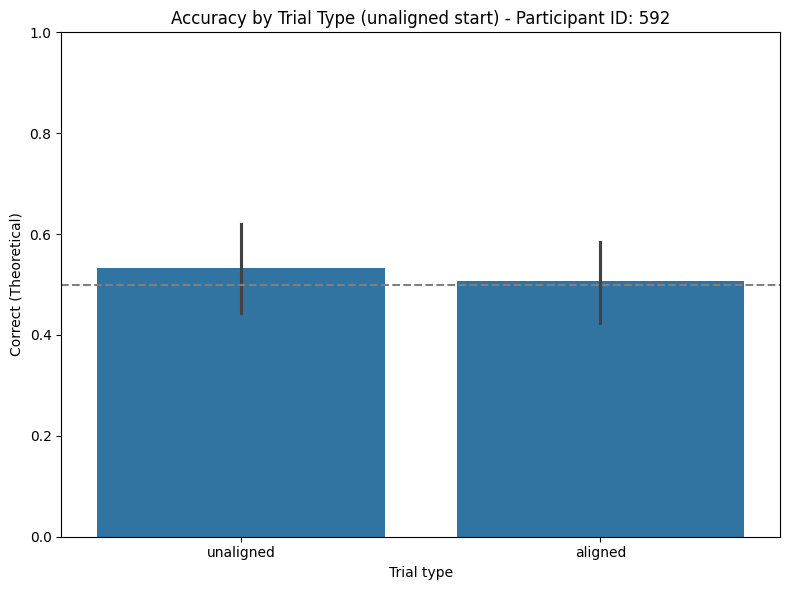

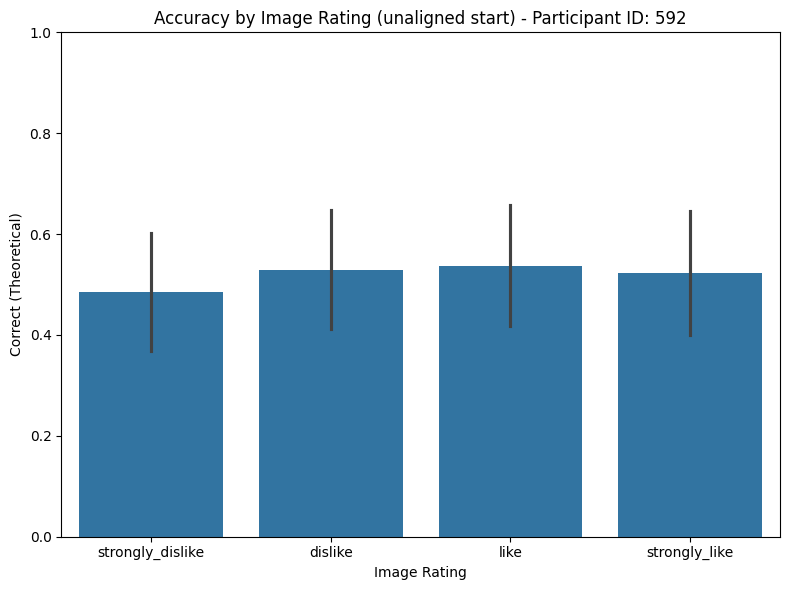

Participant ID: 592
Started with: unaligned
Number of trials in each 'Block':
Block
1    28
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.750000
2    0.416667
3    0.479167
4    0.604167
5    0.458333
6    0.500000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.506944
unaligned    0.532258
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.6805835123257358

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.750000
            2        0.416667
            3        0.479167
            4        0.604167
            5        0.458333
            6        0.500000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.485294
dislike             0.529412
like                0.537313
strongly_like       0.523077
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


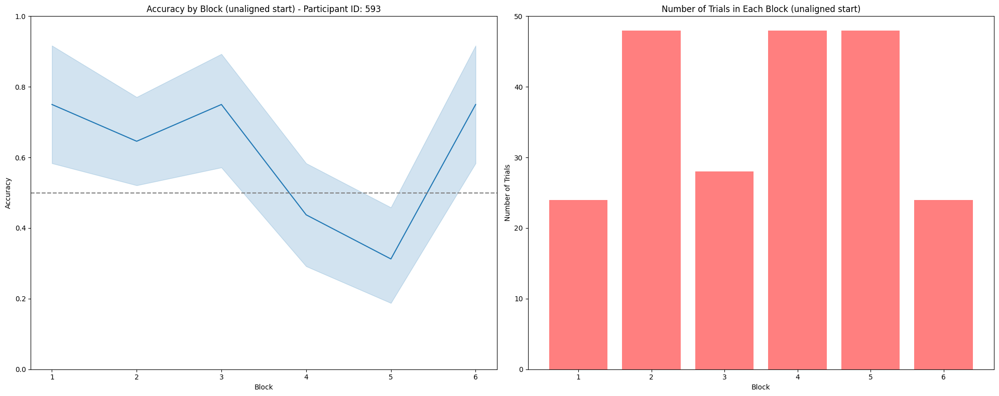

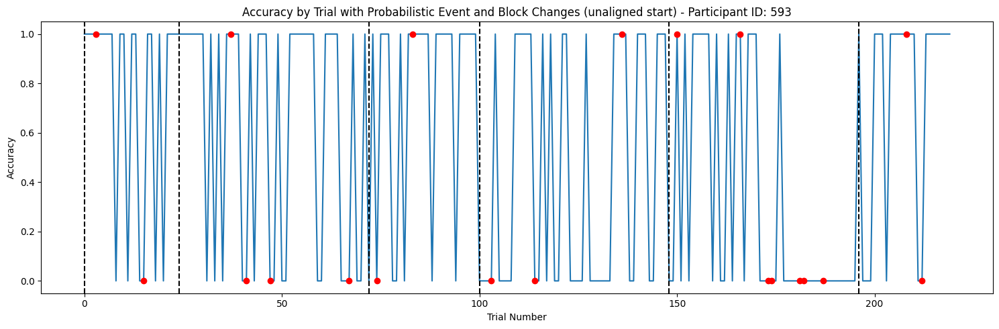

<Figure size 1200x800 with 0 Axes>

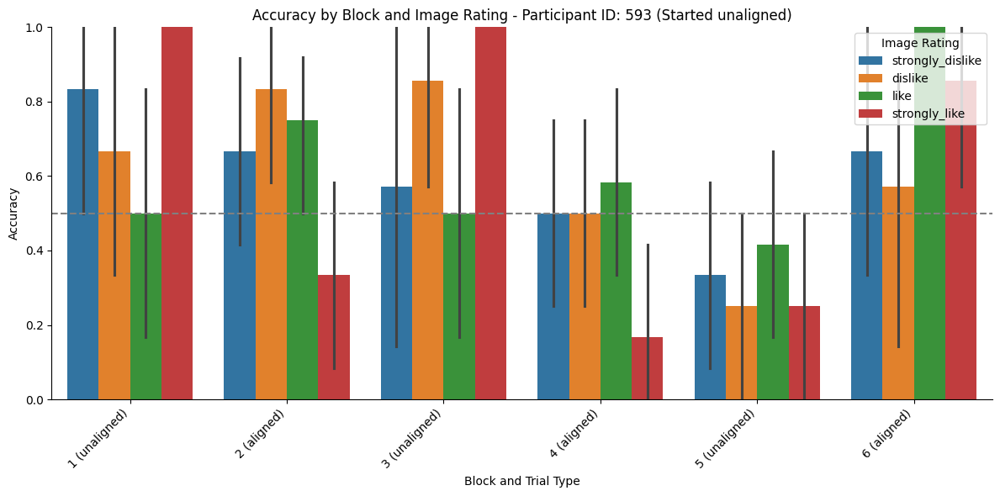

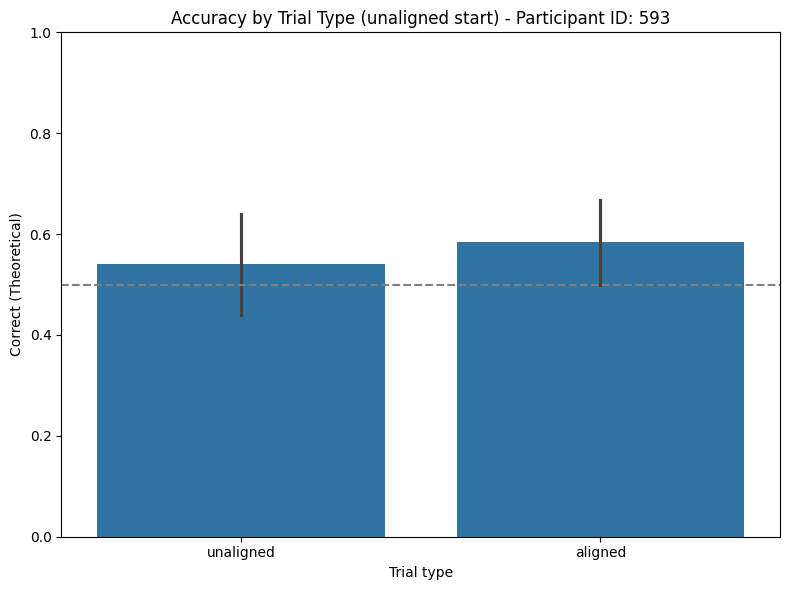

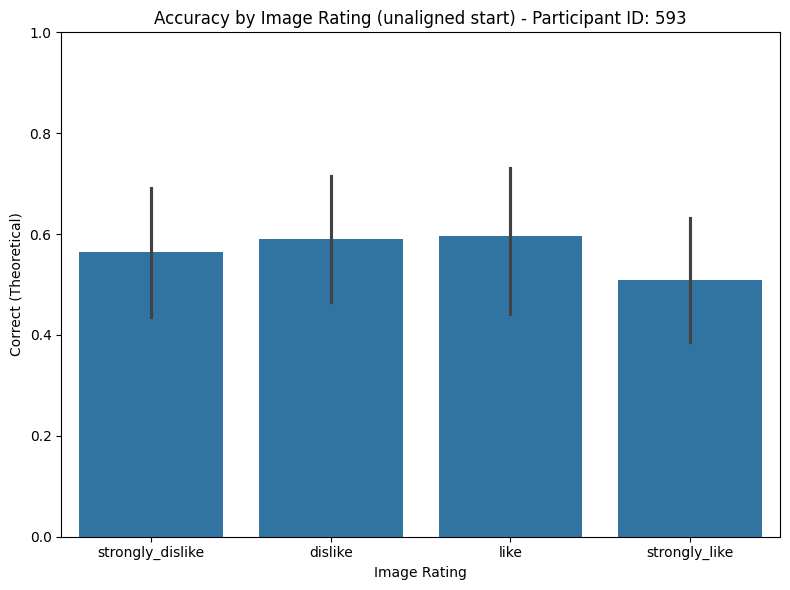

Participant ID: 593
Started with: unaligned
Number of trials in each 'Block':
Block
1    24
2    48
3    28
4    48
5    48
6    24
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.750000
2    0.645833
3    0.750000
4    0.437500
5    0.312500
6    0.750000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.583333
unaligned    0.540000
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.5209046641971543

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.750000
            2        0.645833
            3        0.750000
            4        0.437500
            5        0.312500
            6        0.750000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.563636
dislike             0.589286
like                0.596154
strongly_like       0.508772
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


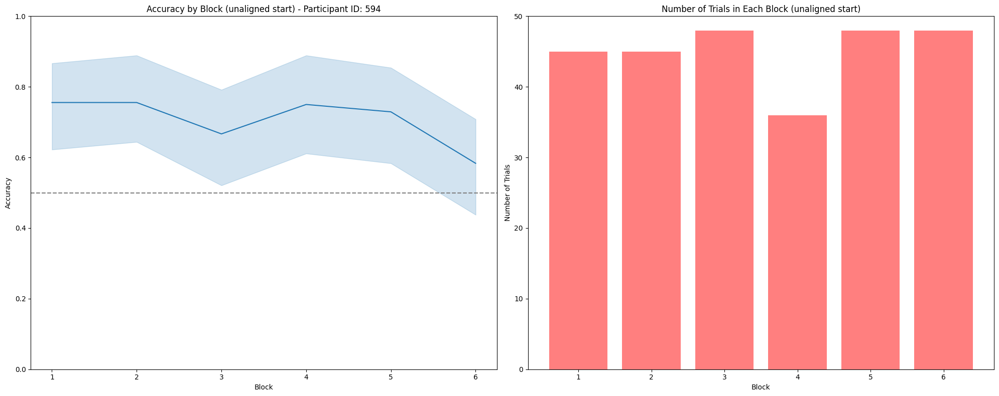

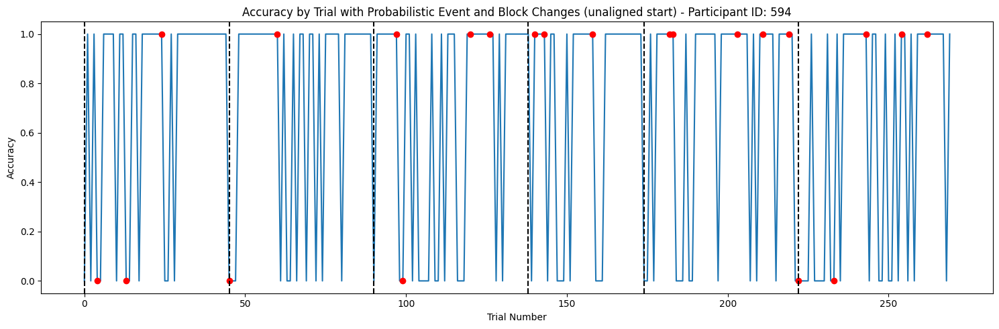

<Figure size 1200x800 with 0 Axes>

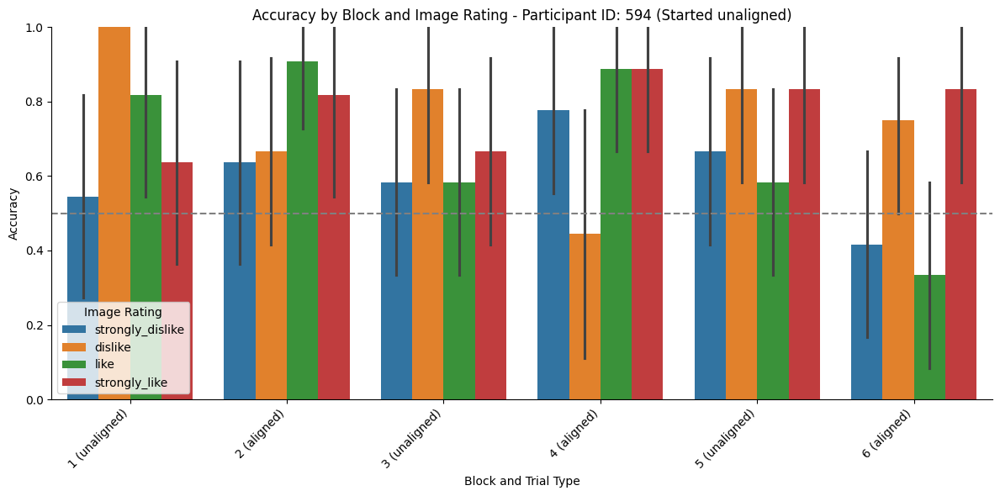

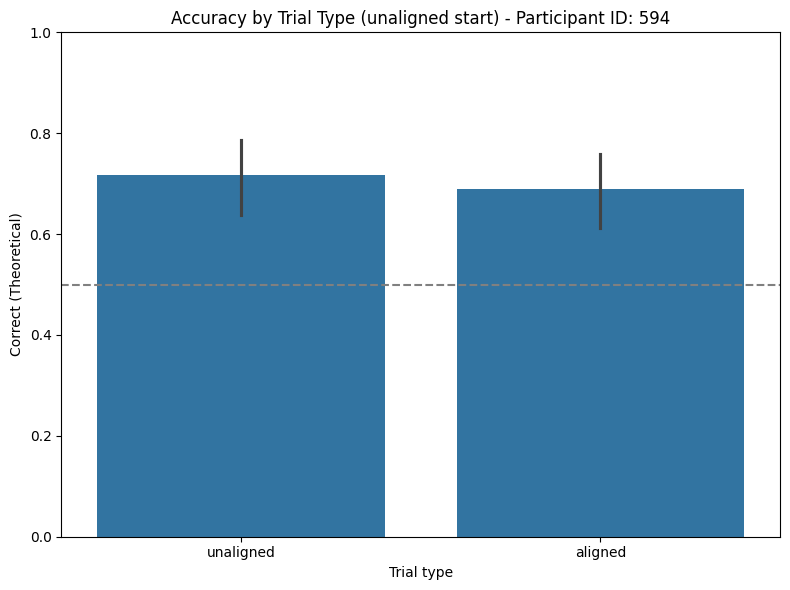

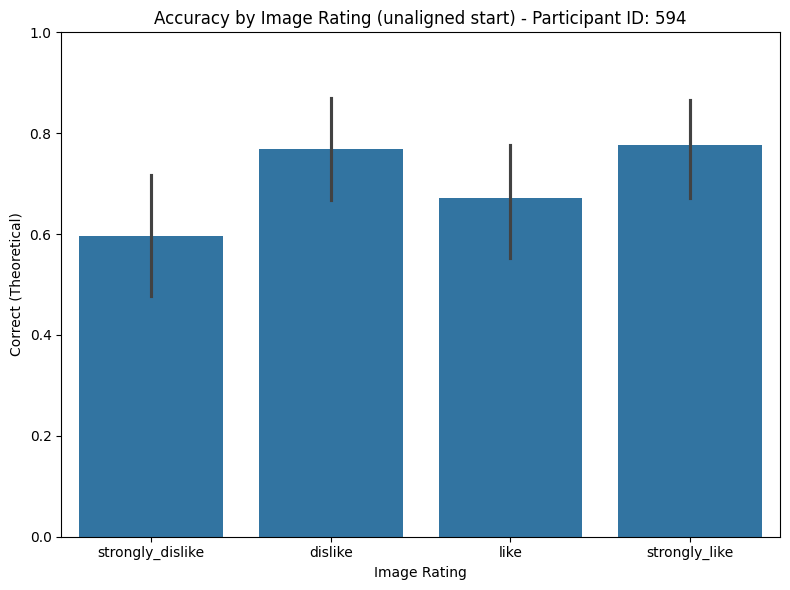

Participant ID: 594
Started with: unaligned
Number of trials in each 'Block':
Block
1    45
2    45
3    48
4    36
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.755556
2    0.755556
3    0.666667
4    0.750000
5    0.729167
6    0.583333
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.689922
unaligned    0.716312
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.6367515536914806

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.755556
            2        0.755556
            3        0.666667
            4        0.750000
            5        0.729167
            6        0.583333
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.597015
dislike             0.768116
like                0.671642
strongly_like       0.776119
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


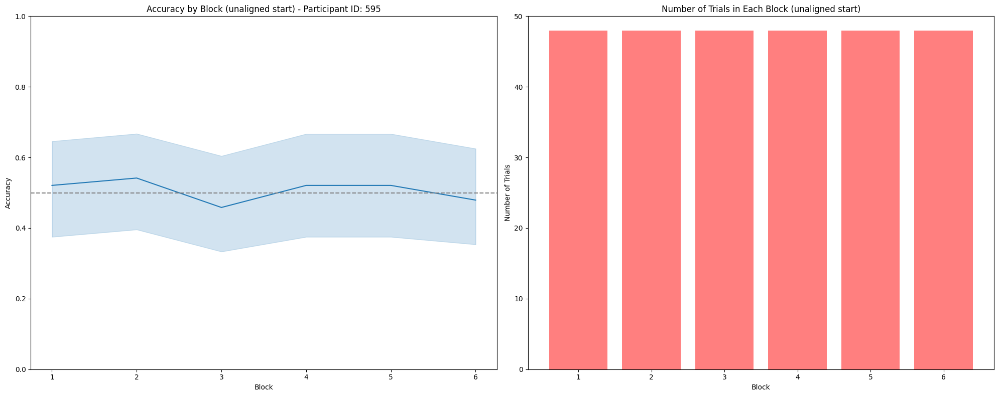

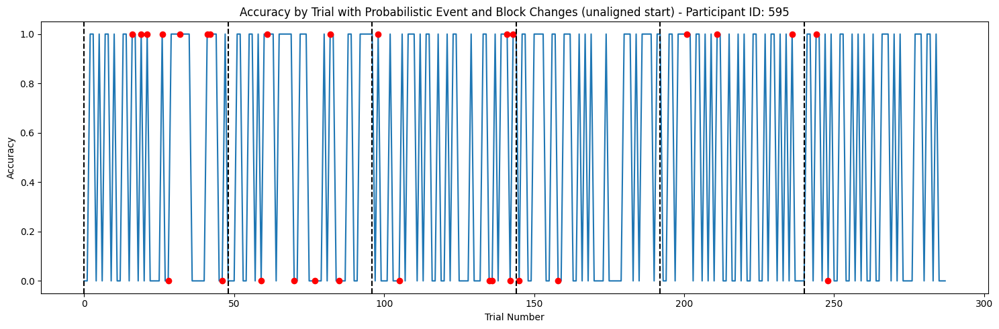

<Figure size 1200x800 with 0 Axes>

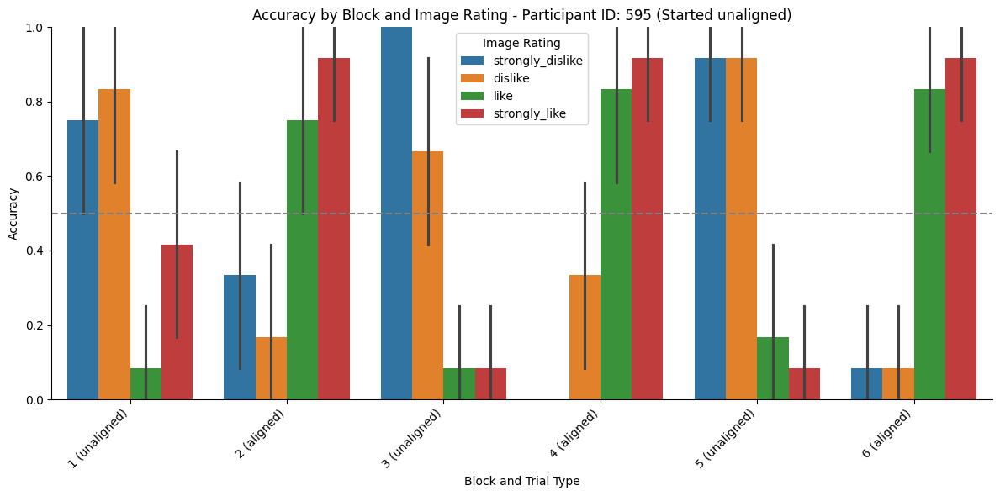

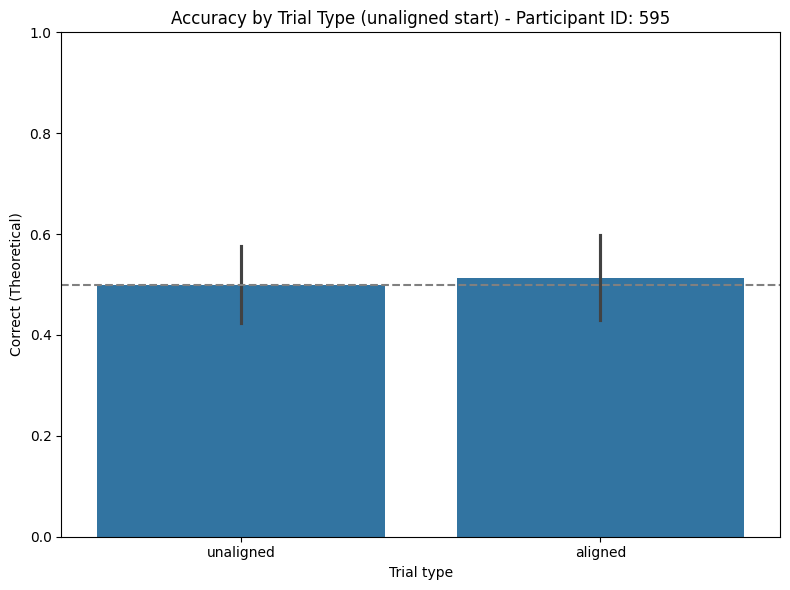

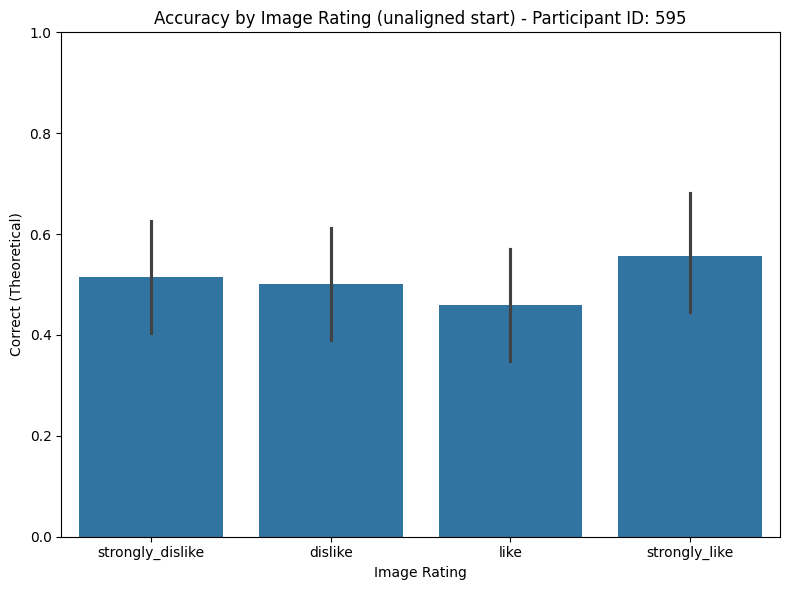

Participant ID: 595
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.520833
2    0.541667
3    0.458333
4    0.520833
5    0.520833
6    0.479167
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.513889
unaligned    0.500000
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.8144329248918667

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.520833
            2        0.541667
            3        0.458333
            4        0.520833
            5        0.520833
            6        0.479167
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.513889
dislike             0.500000
like                0.458333
strongly_like       0.555556
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


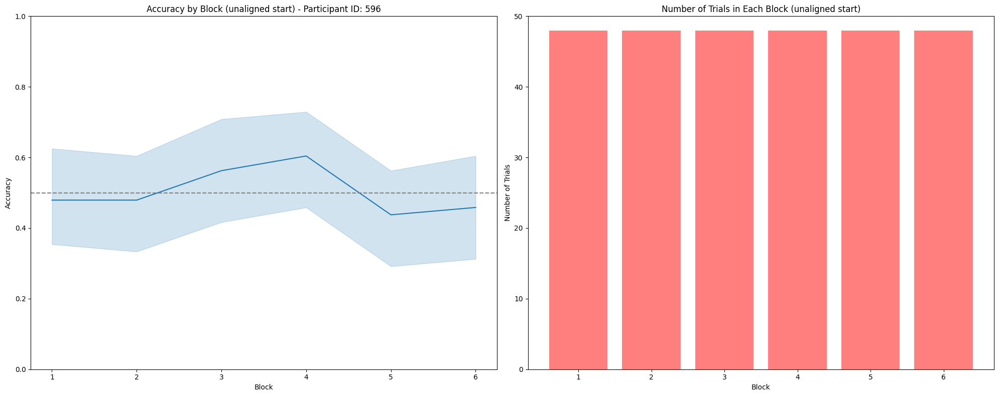

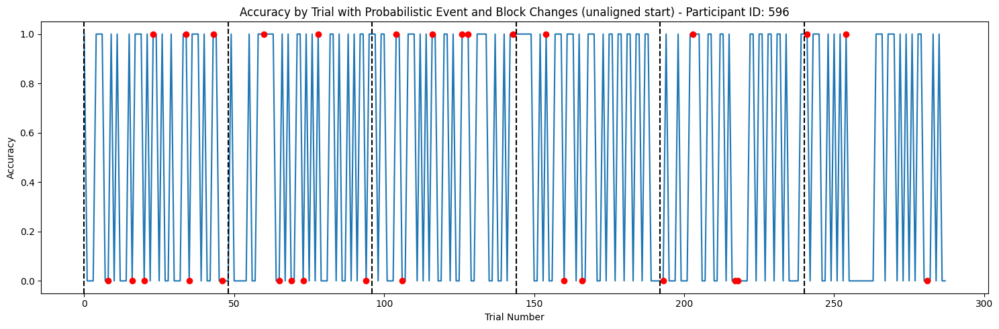

<Figure size 1200x800 with 0 Axes>

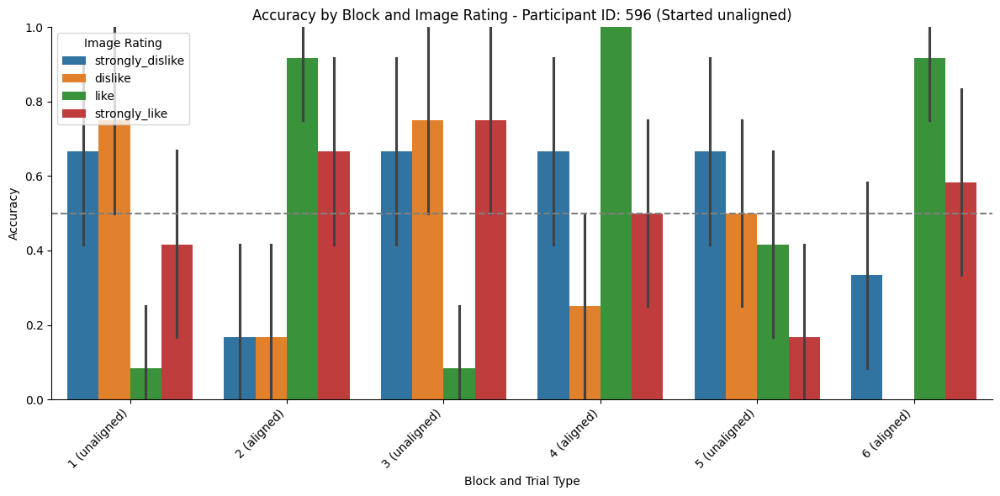

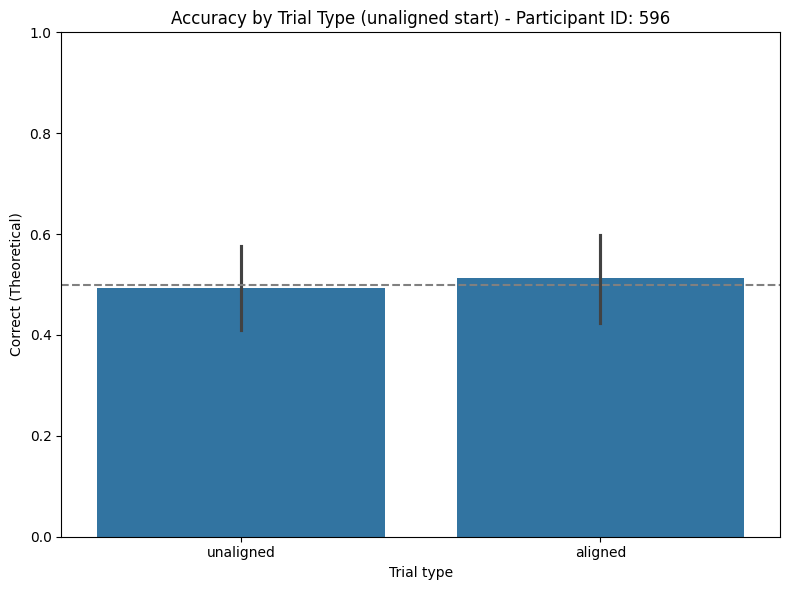

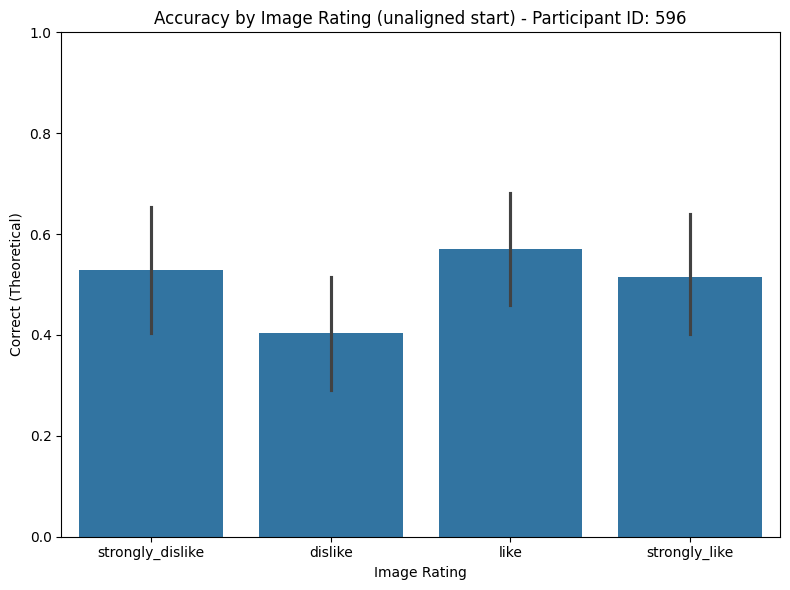

Participant ID: 596
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.479167
2    0.479167
3    0.562500
4    0.604167
5    0.437500
6    0.458333
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.513889
unaligned    0.493056
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.7247913883657259

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.479167
            2        0.479167
            3        0.562500
            4        0.604167
            5        0.437500
            6        0.458333
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.527778
dislike             0.402778
like                0.569444
strongly_like       0.513889
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


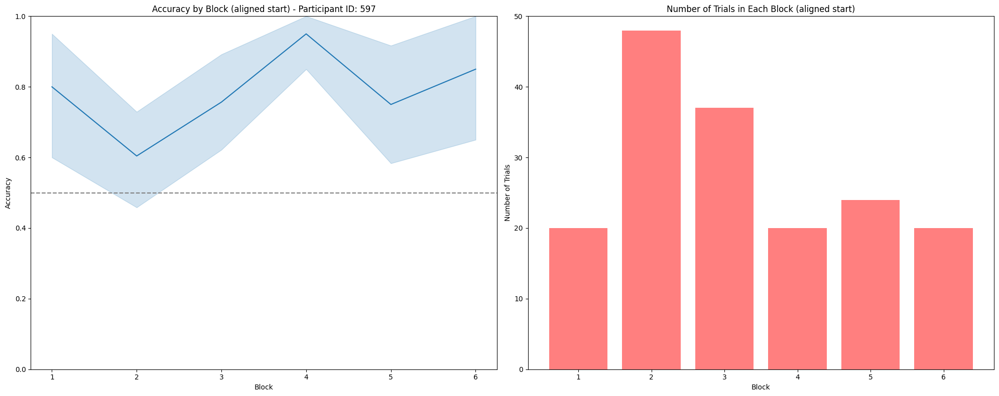

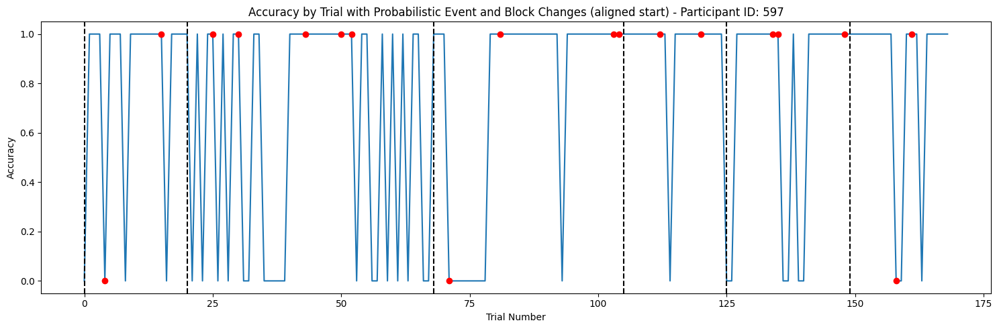

<Figure size 1200x800 with 0 Axes>

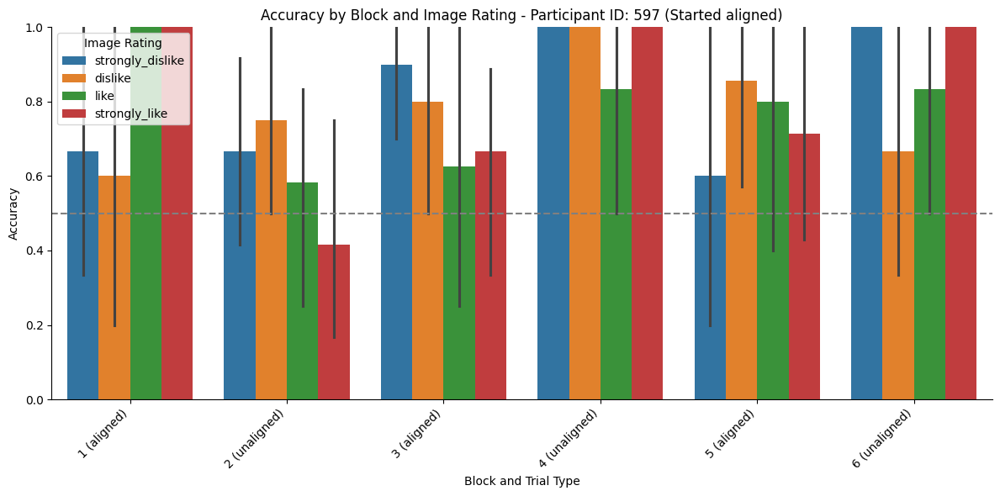

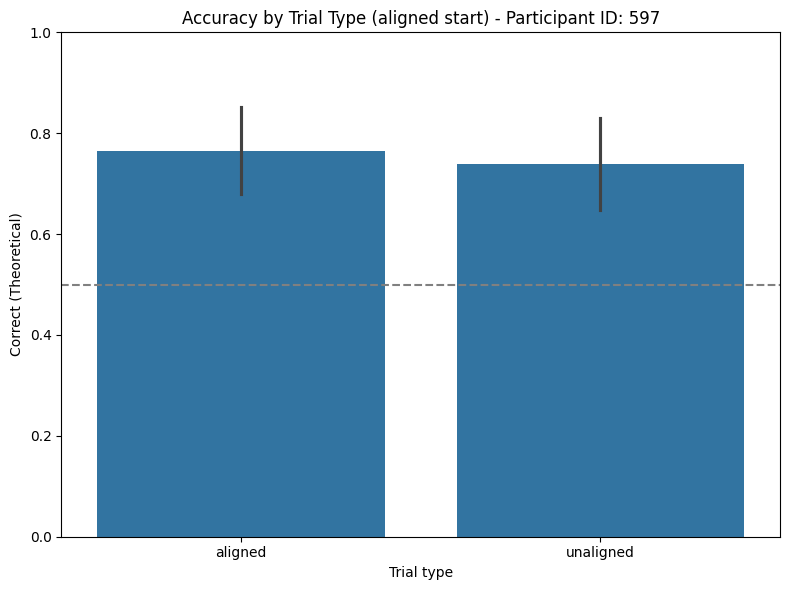

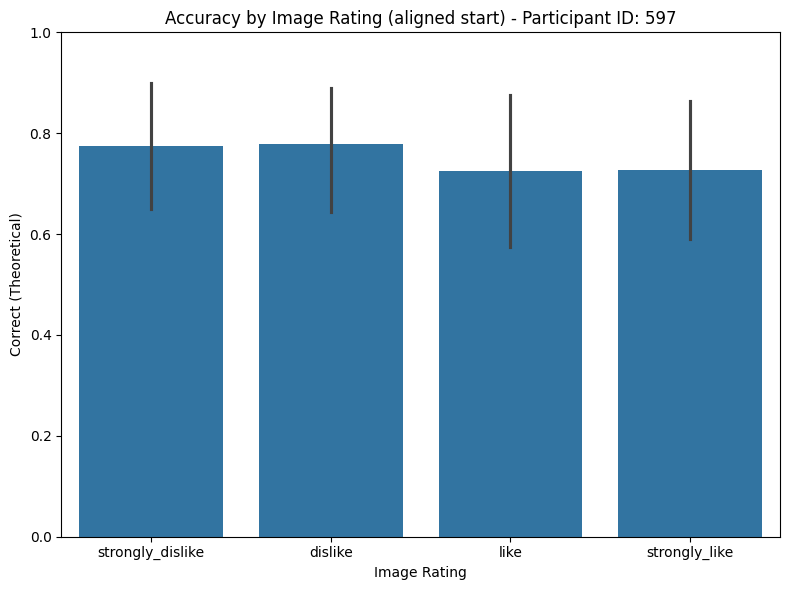

Participant ID: 597
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    48
3    37
4    20
5    24
6    20
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.800000
2    0.604167
3    0.756757
4    0.950000
5    0.750000
6    0.850000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.765432
unaligned    0.738636
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.6893088521294443

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.800000
            2        0.604167
            3        0.756757
            4        0.950000
            5        0.750000
            6        0.850000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.775000
dislike             0.777778
like                0.725000
strongly_like       0.727273
Name: Correct (Binary), dtype: floa

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


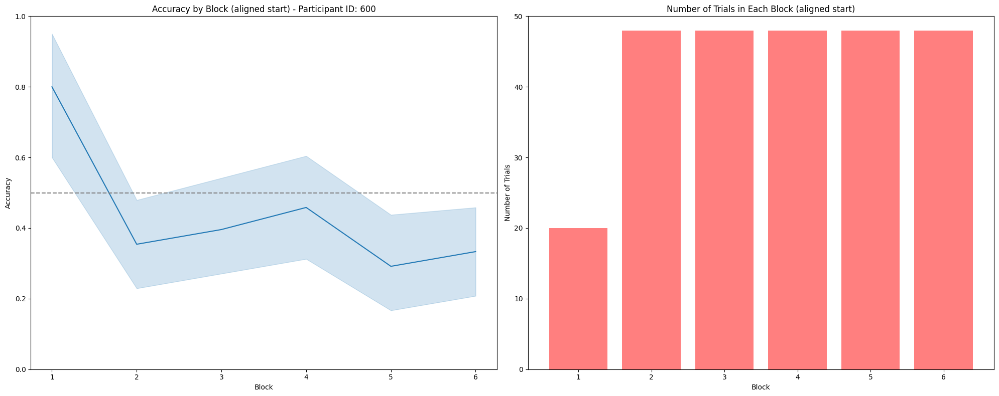

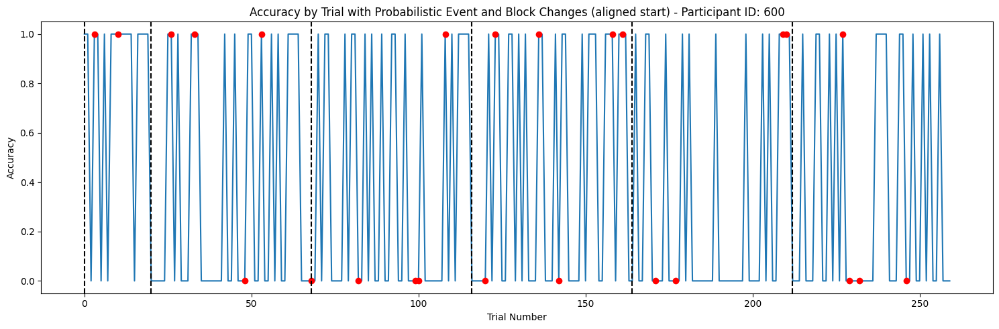

<Figure size 1200x800 with 0 Axes>

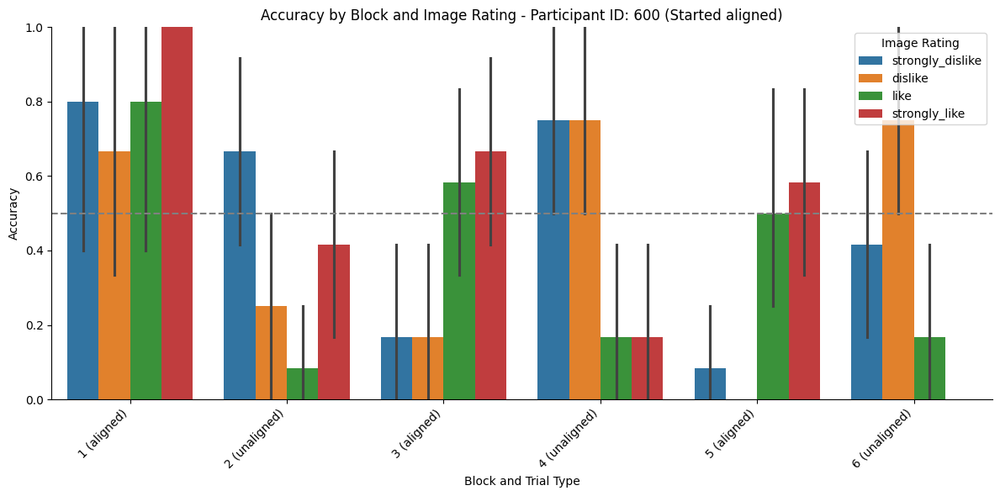

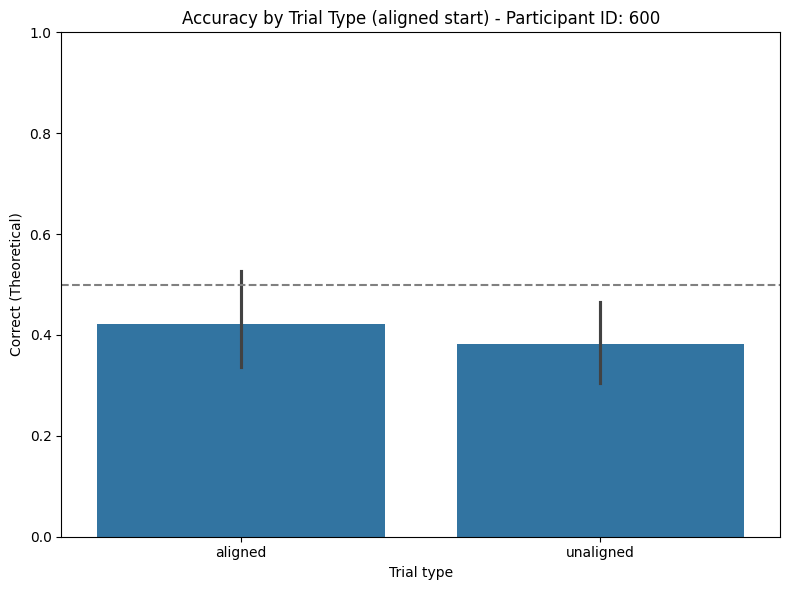

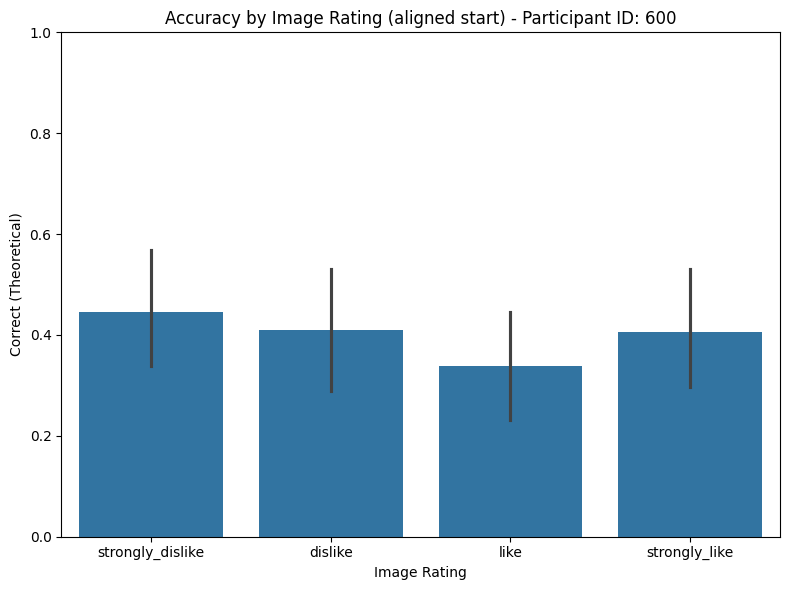

Participant ID: 600
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.800000
2    0.354167
3    0.395833
4    0.458333
5    0.291667
6    0.333333
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.422414
unaligned    0.381944
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.5097550855835948

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.800000
            2        0.354167
            3        0.395833
            4        0.458333
            5        0.291667
            6        0.333333
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.446154
dislike             0.409091
like                0.338462
strongly_like       0.406250
Name: Correct (Binary), dtype: floa

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


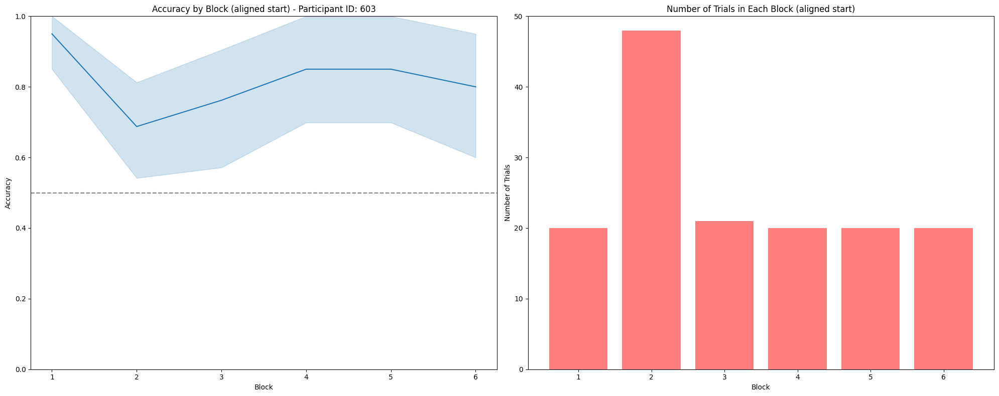

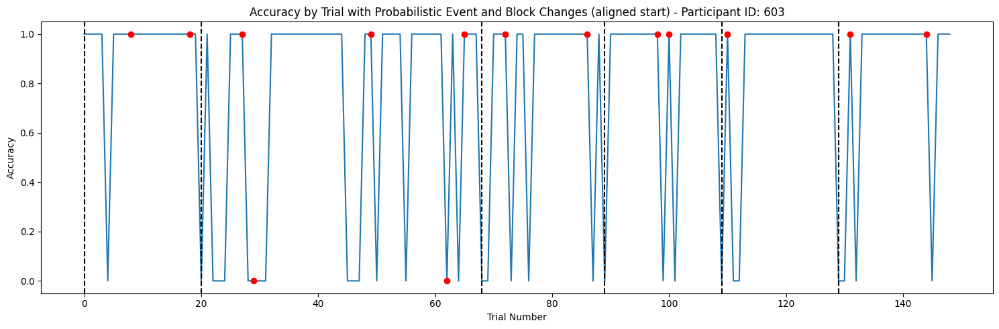

<Figure size 1200x800 with 0 Axes>

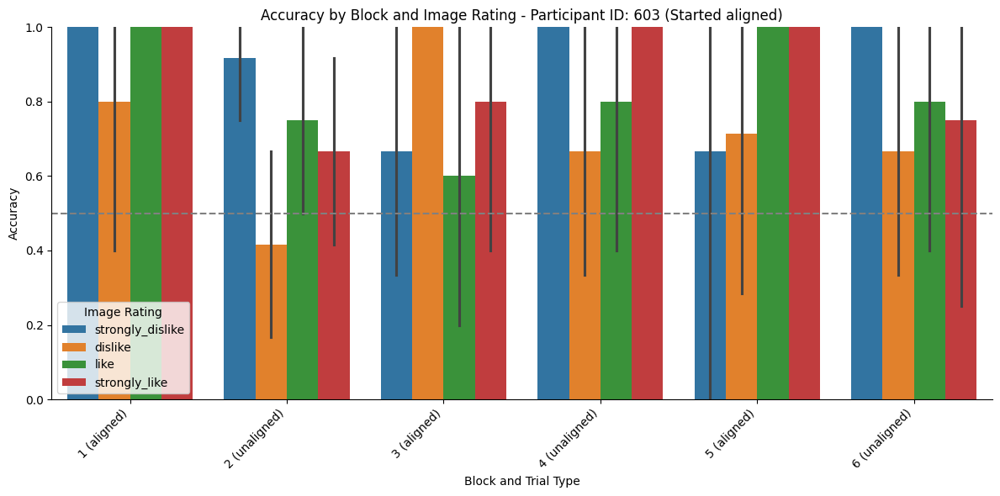

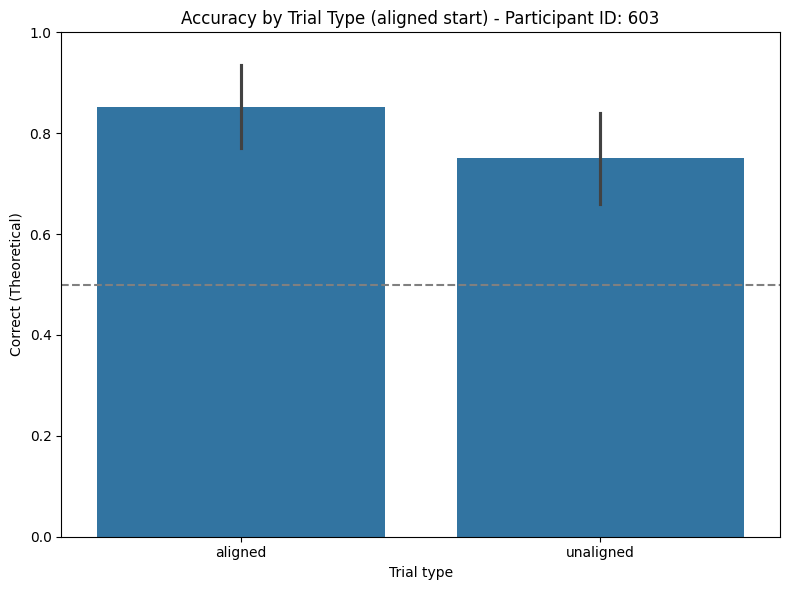

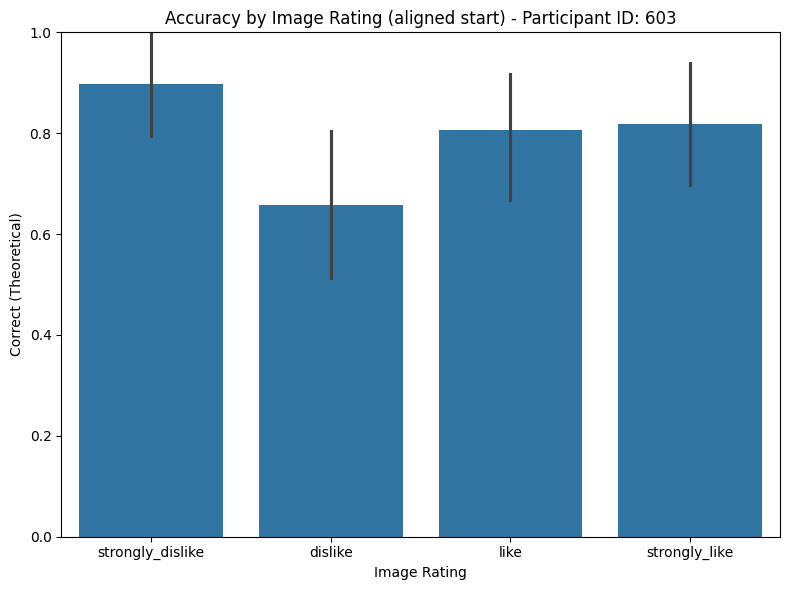

Participant ID: 603
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    48
3    21
4    20
5    20
6    20
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.950000
2    0.687500
3    0.761905
4    0.850000
5    0.850000
6    0.800000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.852459
unaligned    0.750000
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.13152100611229714

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.950000
            2        0.687500
            3        0.761905
            4        0.850000
            5        0.850000
            6        0.800000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.897436
dislike             0.658537
like                0.805556
strongly_like       0.818182
Name: Correct (Binary), dtype: flo

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


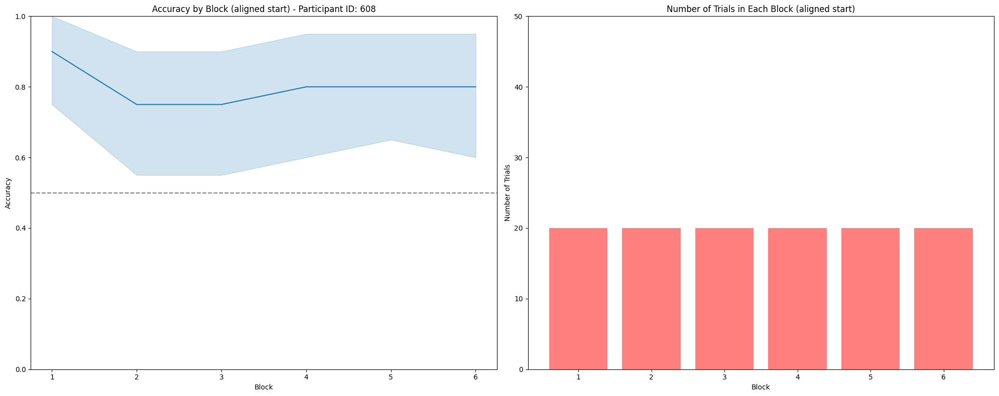

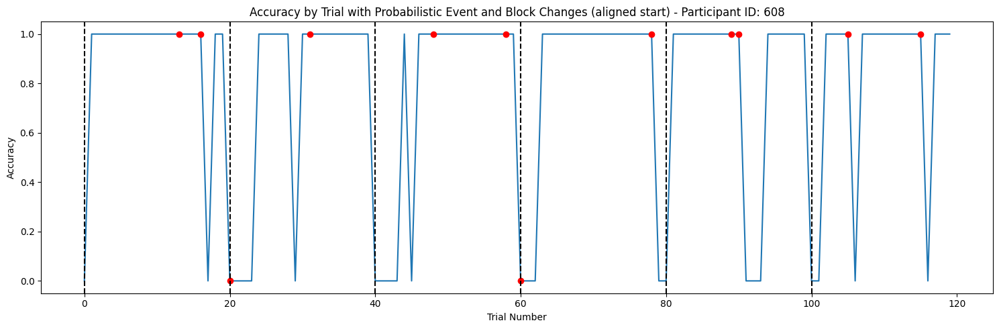

<Figure size 1200x800 with 0 Axes>

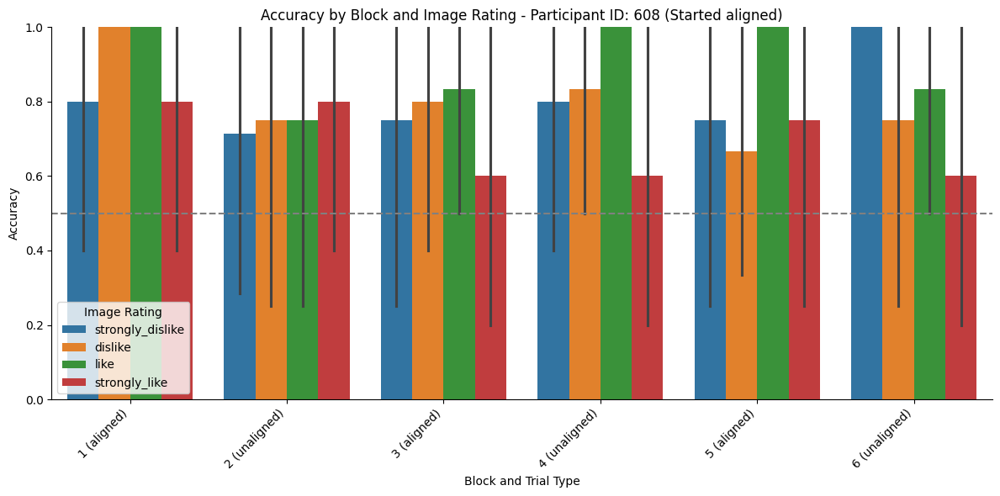

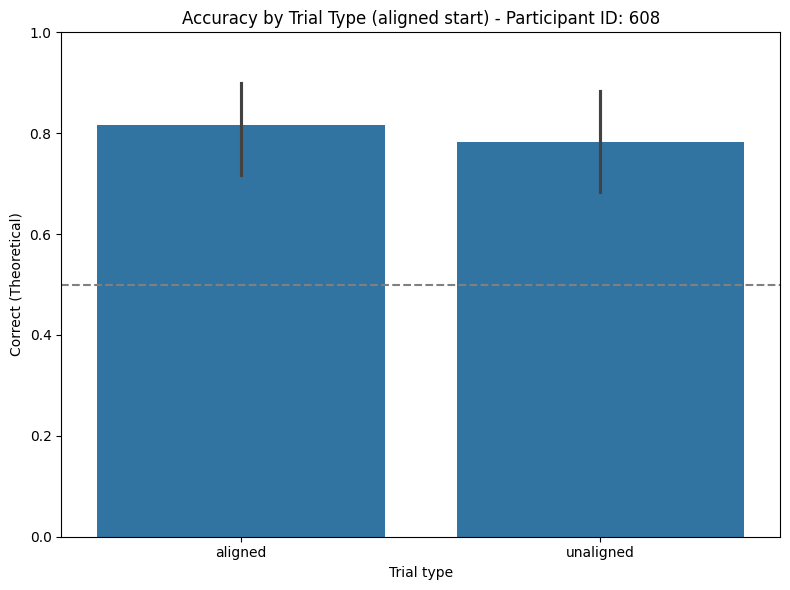

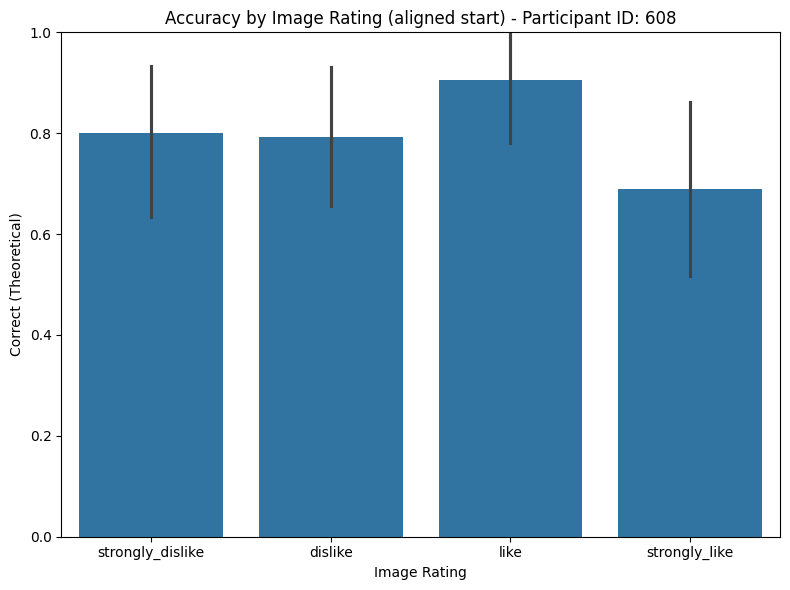

Participant ID: 608
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    20
3    20
4    20
5    20
6    20
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.90
2    0.75
3    0.75
4    0.80
5    0.80
6    0.80
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.816667
unaligned    0.783333
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.651373945619064

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.90
            2        0.75
            3        0.75
            4        0.80
            5        0.80
            6        0.80
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.800000
dislike             0.793103
like                0.906250
strongly_like       0.689655
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating': 0.214

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


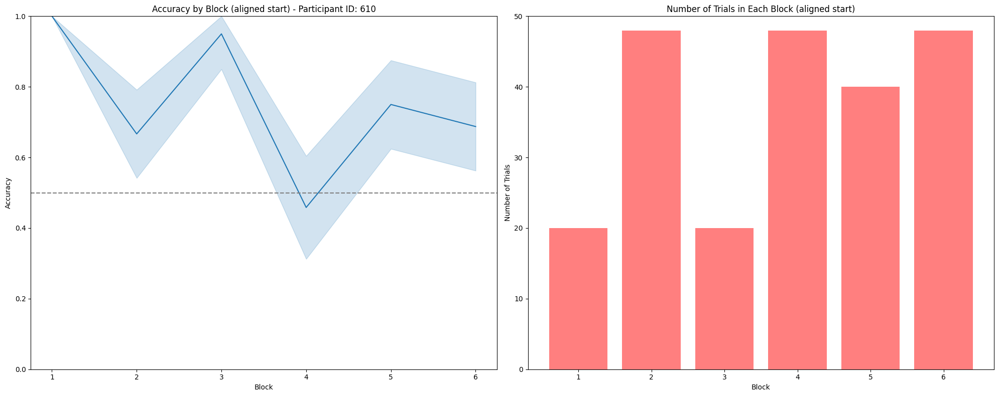

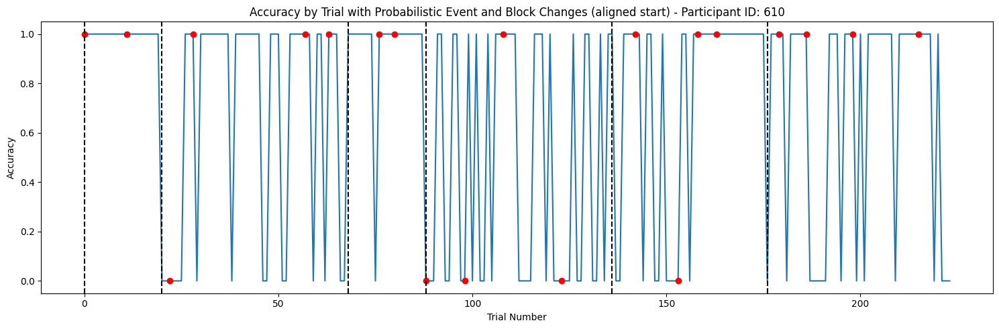

<Figure size 1200x800 with 0 Axes>

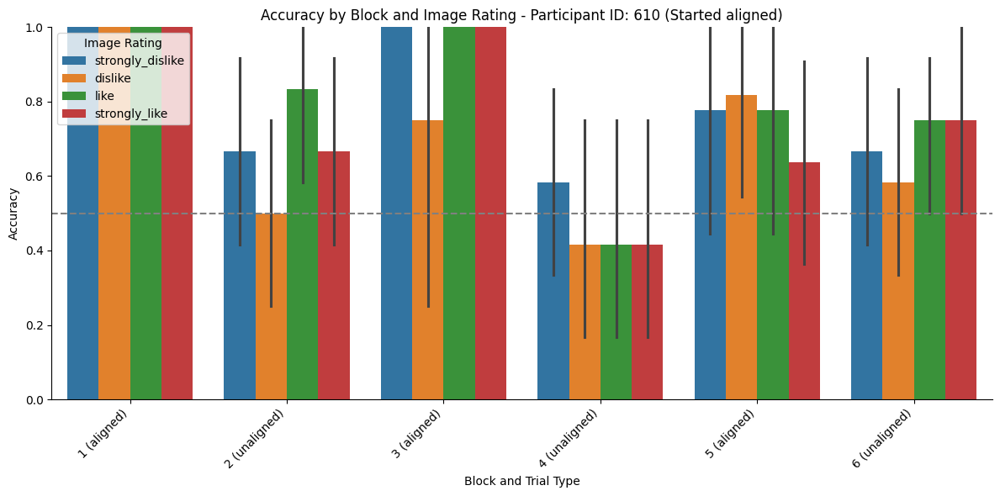

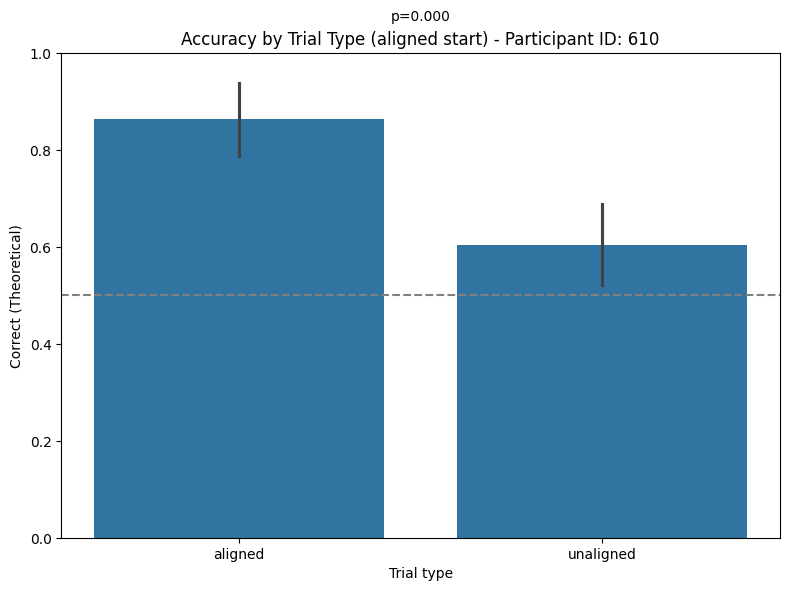

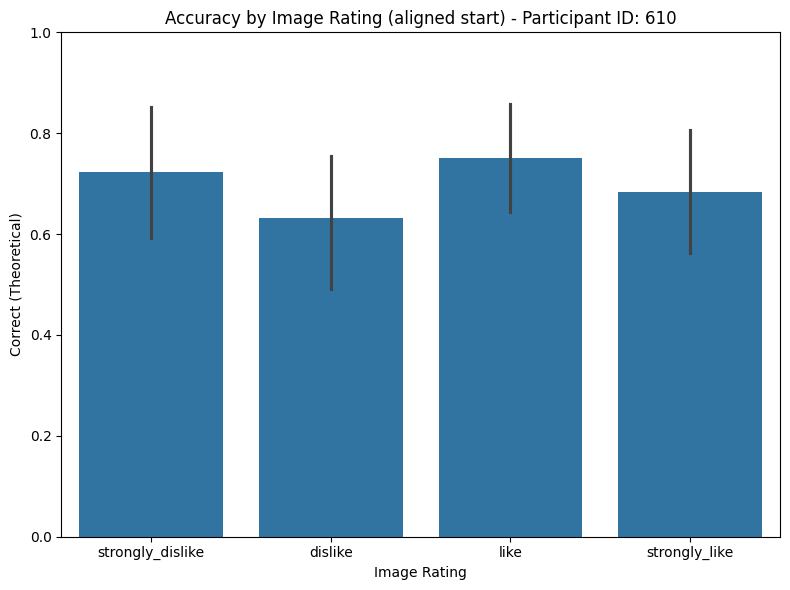

Participant ID: 610
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    48
3    20
4    48
5    40
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    1.000000
2    0.666667
3    0.950000
4    0.458333
5    0.750000
6    0.687500
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.862500
unaligned    0.604167
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 4.460530498951324e-05

Accuracy over the whole task:
All Trials  Block
All Trials  1        1.000000
            2        0.666667
            3        0.950000
            4        0.458333
            5        0.750000
            6        0.687500
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.722222
dislike             0.631579
like                0.750000
strongly_like       0.684211
Name: Correct (Binary), dtype: f

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


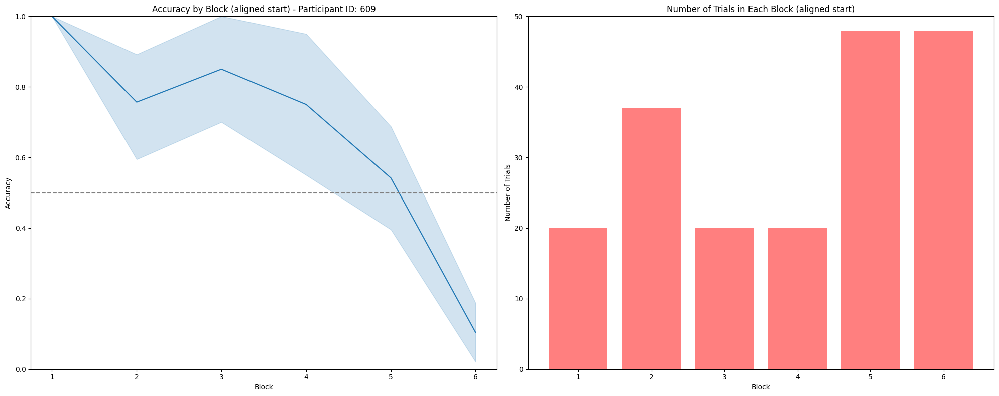

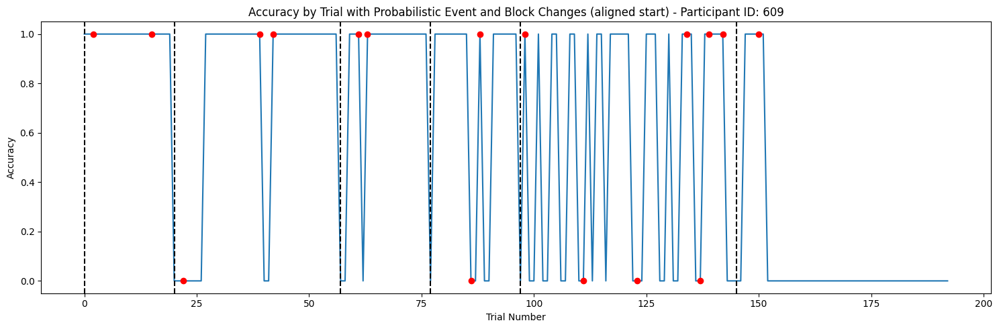

<Figure size 1200x800 with 0 Axes>

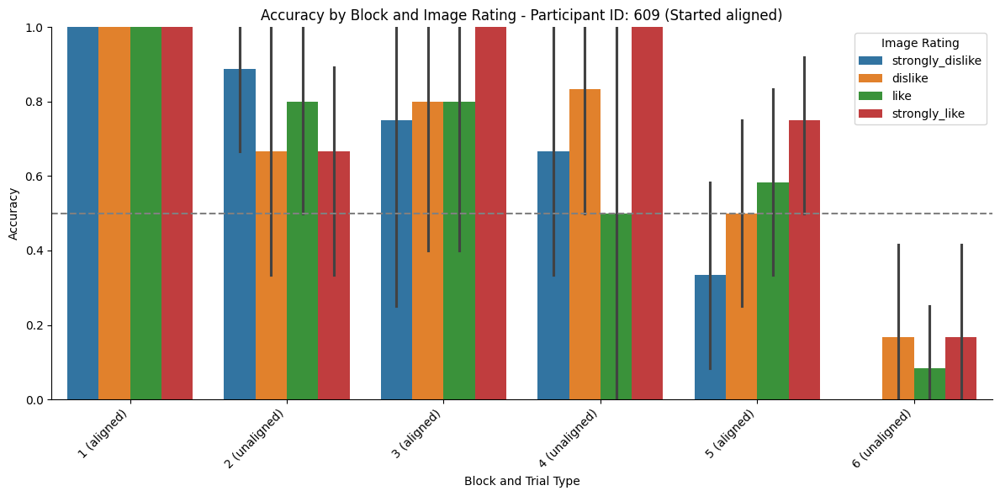

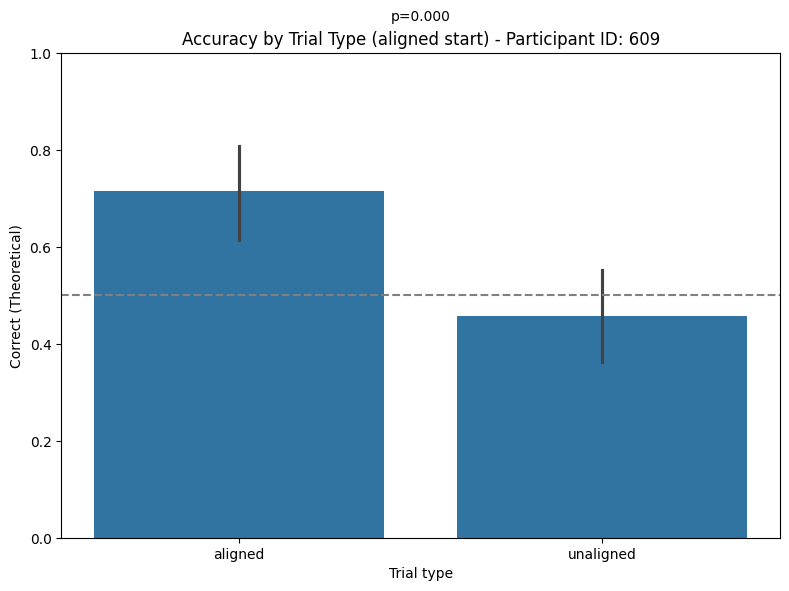

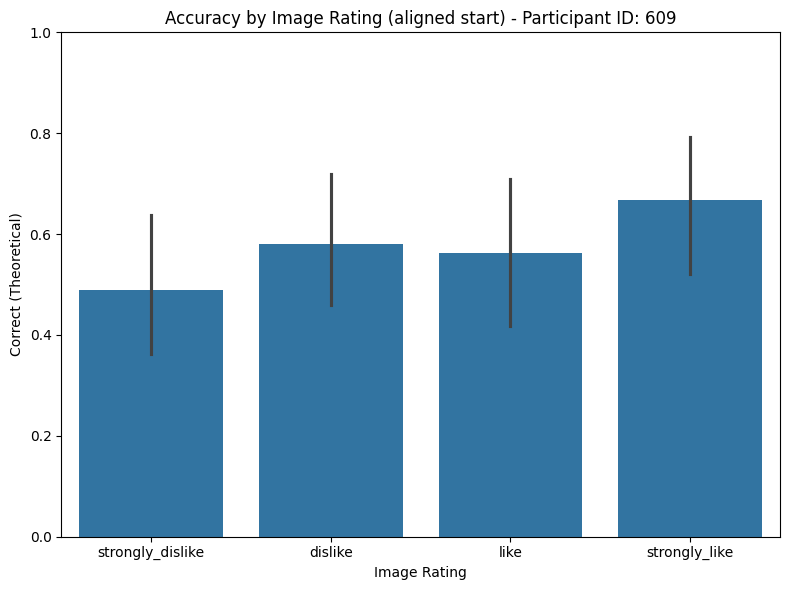

Participant ID: 609
Started with: aligned
Number of trials in each 'Block':
Block
1    20
2    37
3    20
4    20
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    1.000000
2    0.756757
3    0.850000
4    0.750000
5    0.541667
6    0.104167
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.715909
unaligned    0.457143
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.0002501985719018388

Accuracy over the whole task:
All Trials  Block
All Trials  1        1.000000
            2        0.756757
            3        0.850000
            4        0.750000
            5        0.541667
            6        0.104167
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.489362
dislike             0.580000
like                0.562500
strongly_like       0.666667
Name: Correct (Binary), dtype: f

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


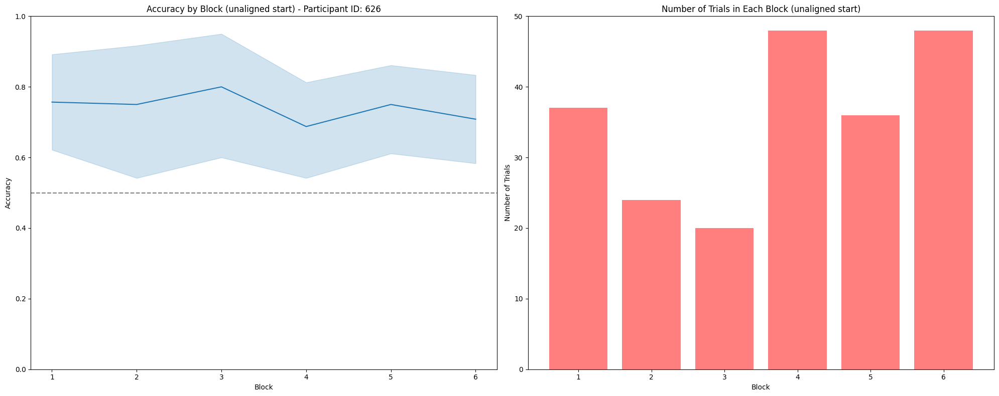

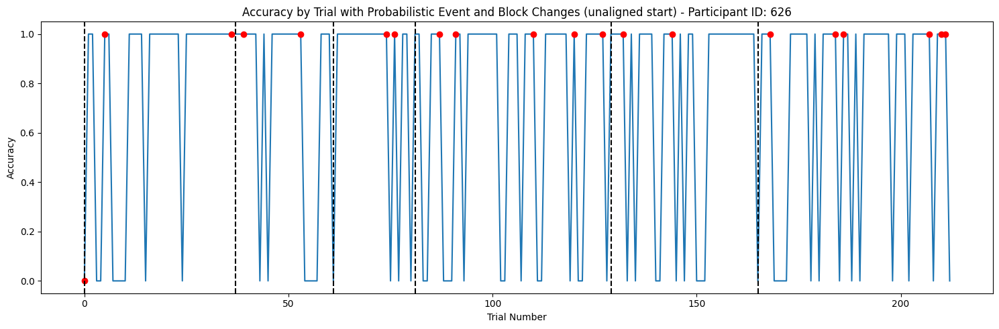

<Figure size 1200x800 with 0 Axes>

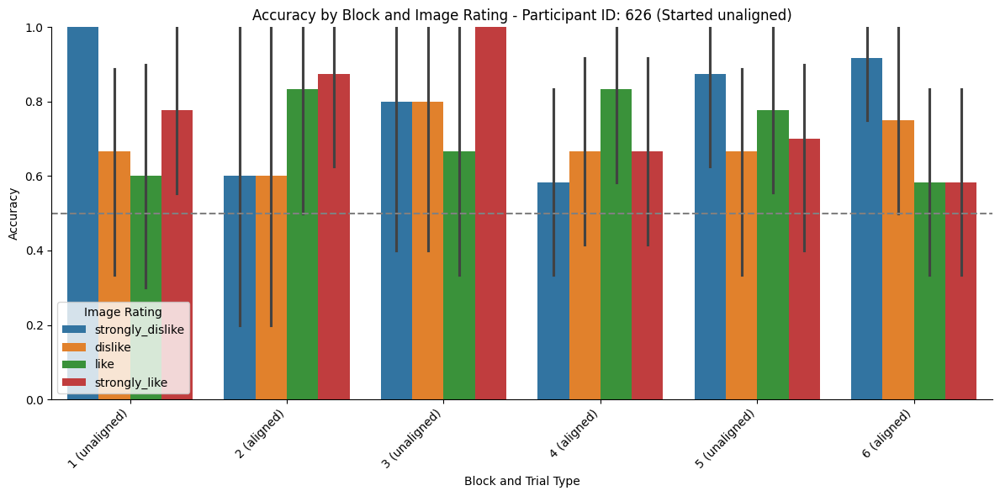

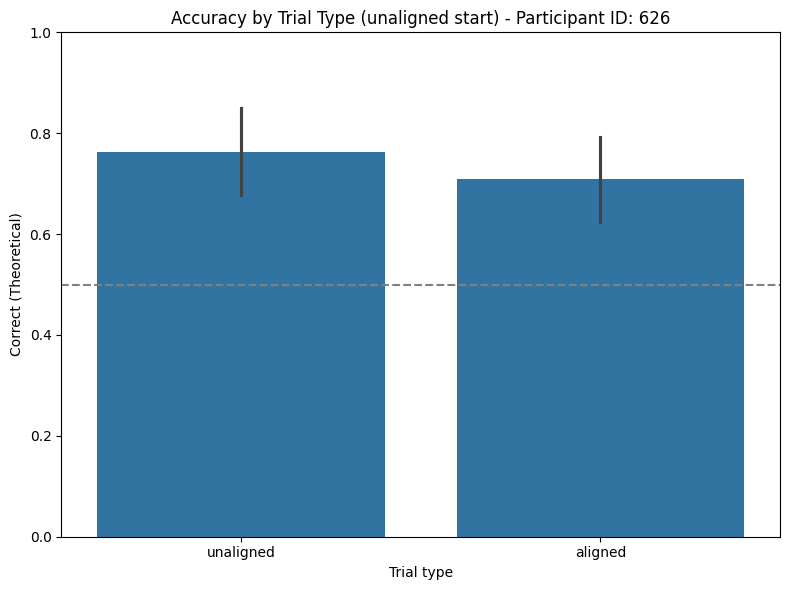

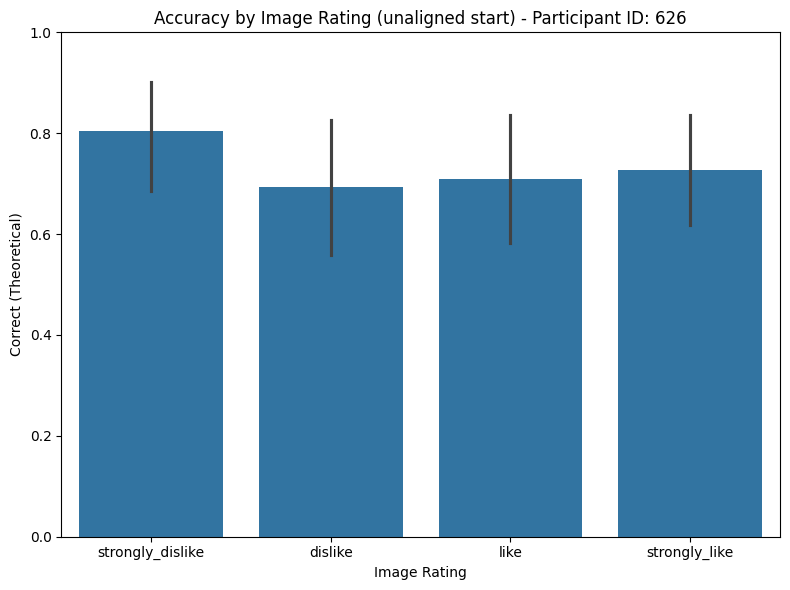

Participant ID: 626
Started with: unaligned
Number of trials in each 'Block':
Block
1    37
2    24
3    20
4    48
5    36
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.756757
2    0.750000
3    0.800000
4    0.687500
5    0.750000
6    0.708333
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.708333
unaligned    0.763441
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.3699479786137888

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.756757
            2        0.750000
            3        0.800000
            4        0.687500
            5        0.750000
            6        0.708333
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.803922
dislike             0.692308
like                0.709091
strongly_like       0.727273
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


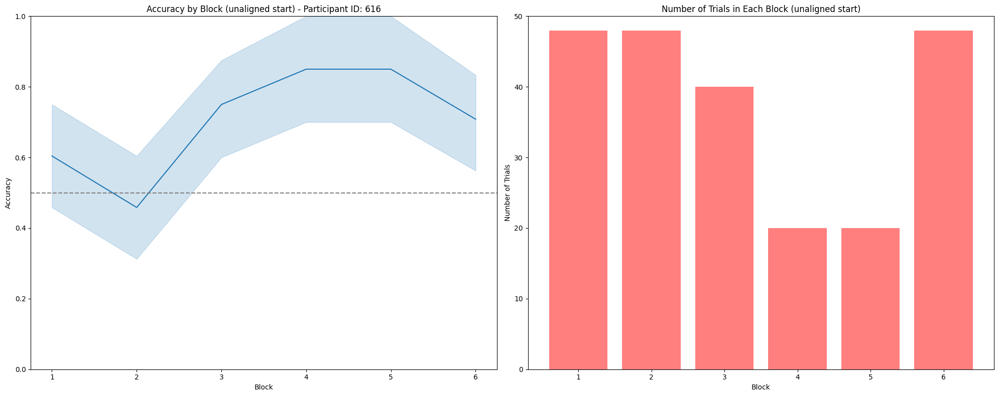

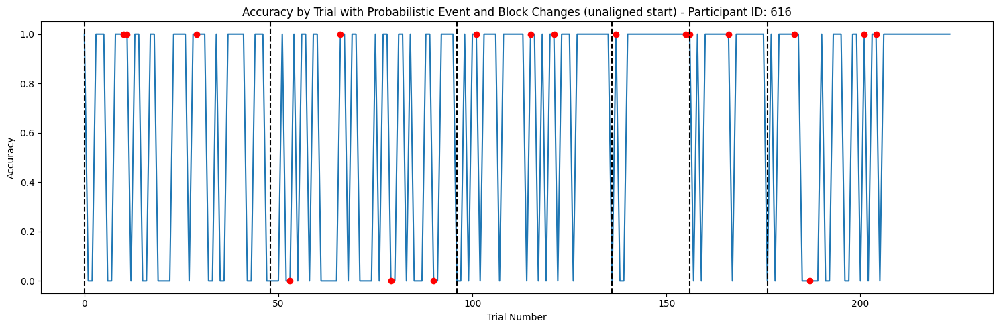

<Figure size 1200x800 with 0 Axes>

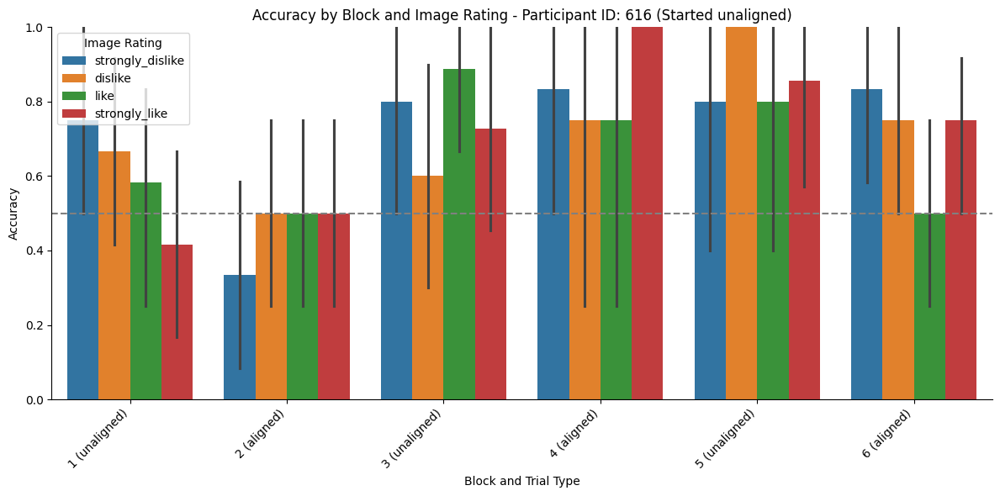

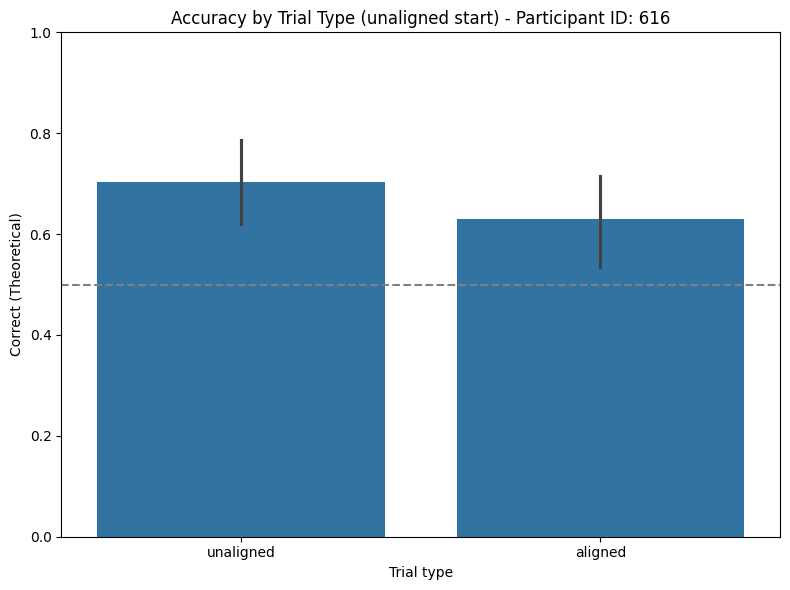

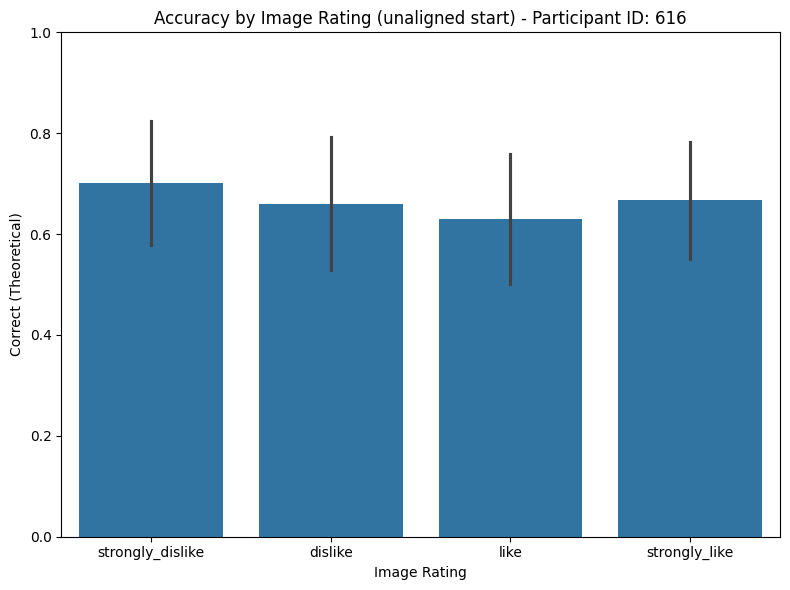

Participant ID: 616
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    40
4    20
5    20
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.604167
2    0.458333
3    0.750000
4    0.850000
5    0.850000
6    0.708333
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.629310
unaligned    0.703704
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.2403449634240836

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.604167
            2        0.458333
            3        0.750000
            4        0.850000
            5        0.850000
            6        0.708333
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.701754
dislike             0.660377
like                0.629630
strongly_like       0.666667
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


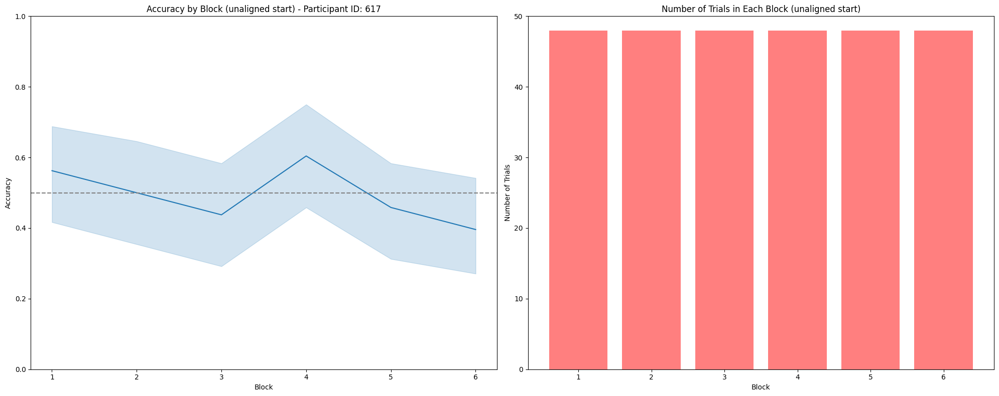

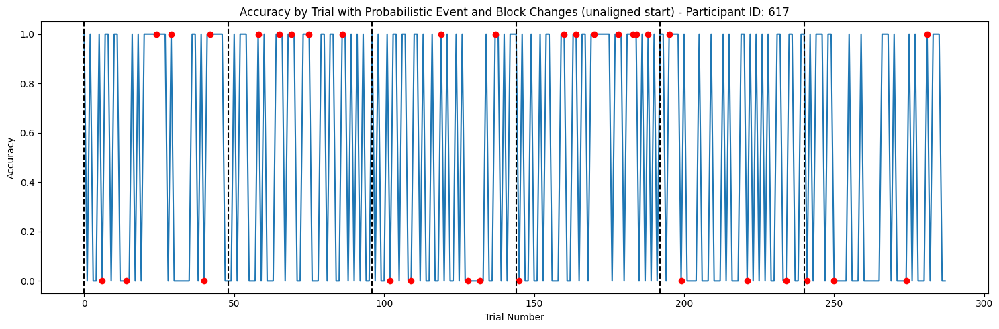

<Figure size 1200x800 with 0 Axes>

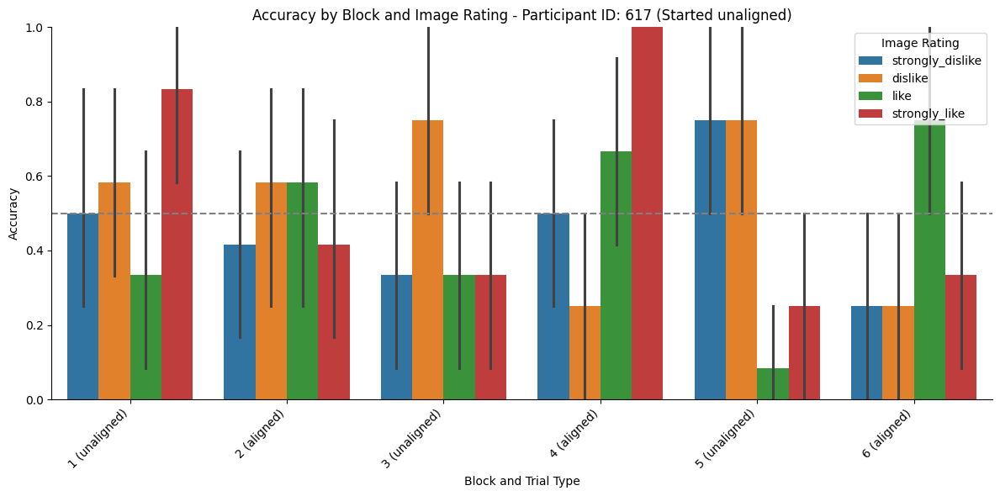

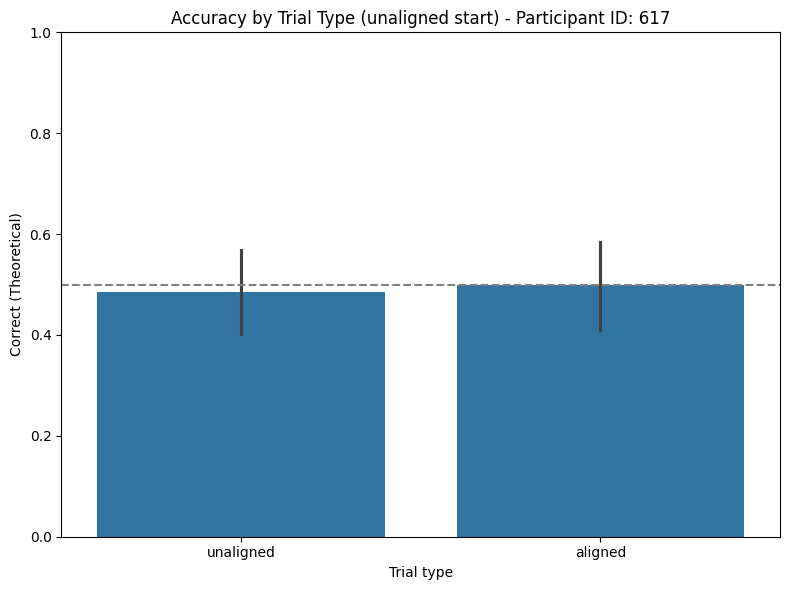

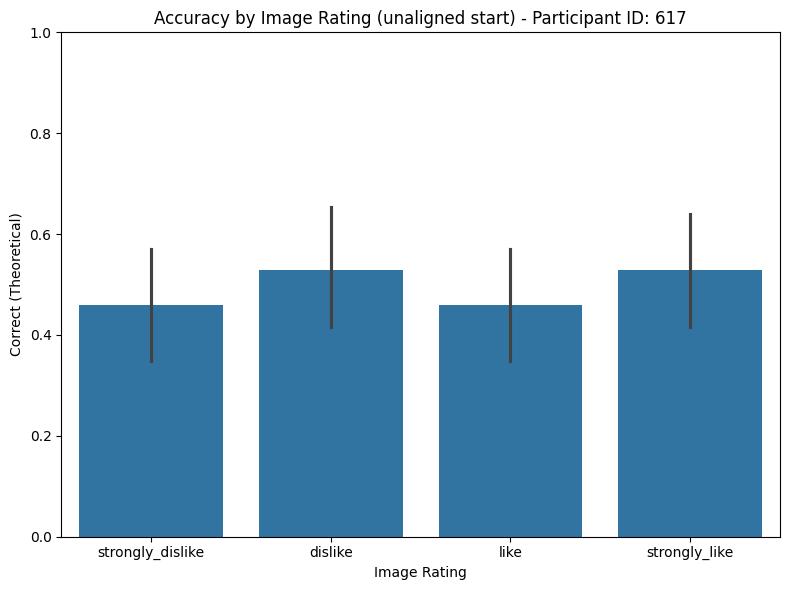

Participant ID: 617
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.562500
2    0.500000
3    0.437500
4    0.604167
5    0.458333
6    0.395833
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.500000
unaligned    0.486111
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.8144329248918659

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.562500
            2        0.500000
            3        0.437500
            4        0.604167
            5        0.458333
            6        0.395833
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.458333
dislike             0.527778
like                0.458333
strongly_like       0.527778
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


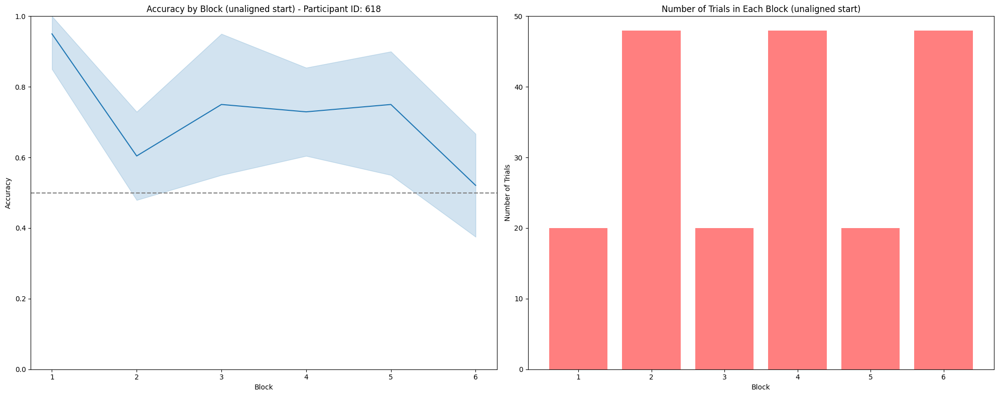

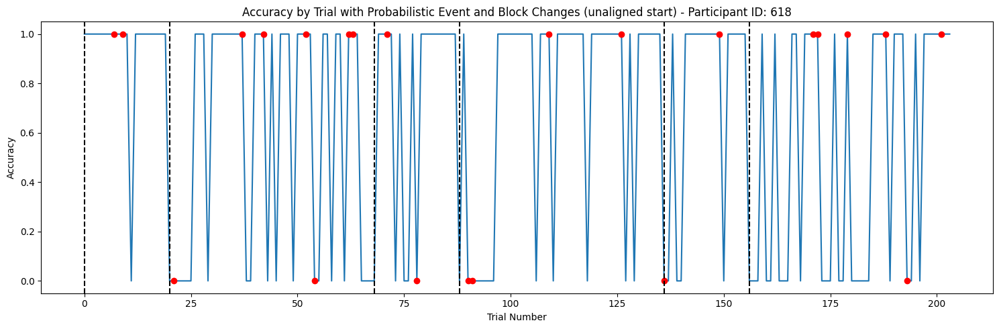

<Figure size 1200x800 with 0 Axes>

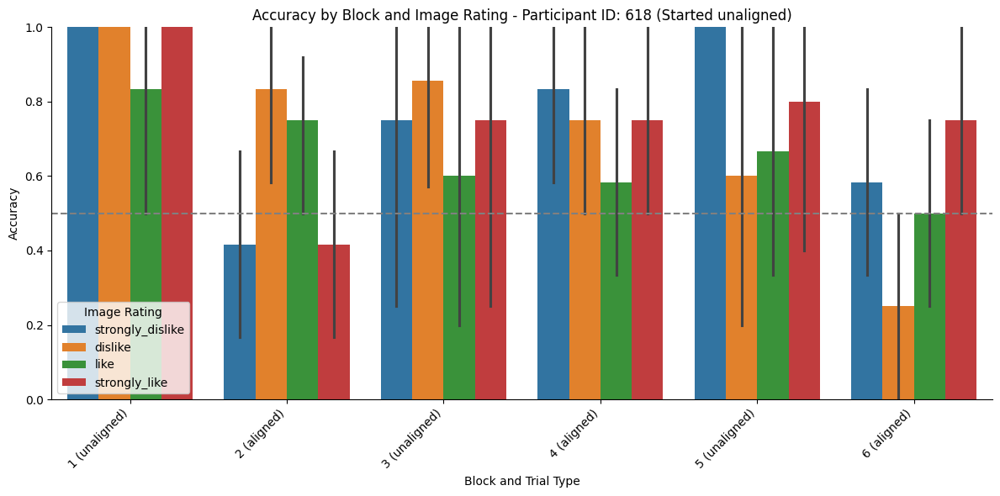

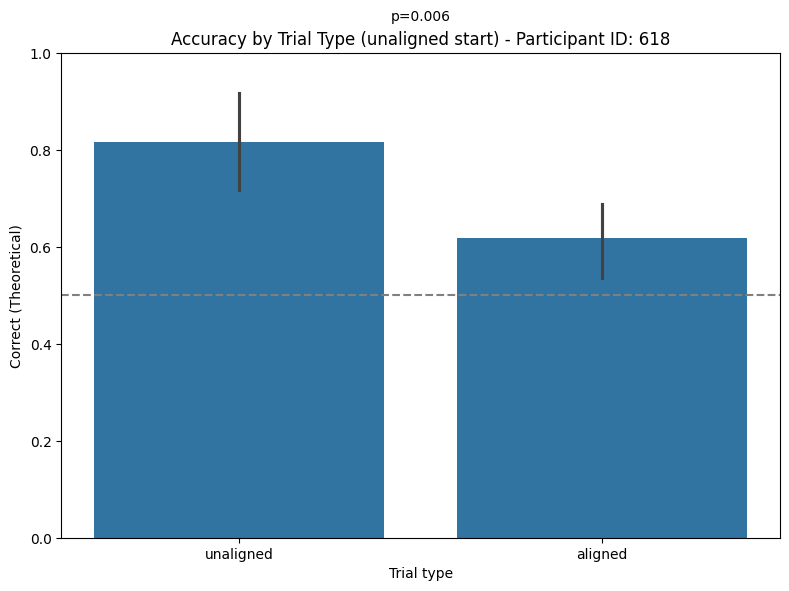

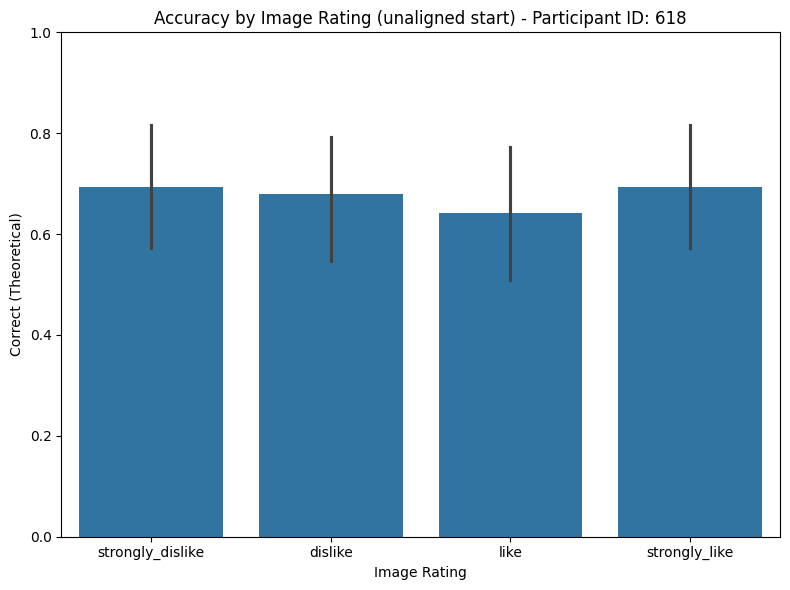

Participant ID: 618
Started with: unaligned
Number of trials in each 'Block':
Block
1    20
2    48
3    20
4    48
5    20
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.950000
2    0.604167
3    0.750000
4    0.729167
5    0.750000
6    0.520833
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.618056
unaligned    0.816667
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.005568774557674686

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.950000
            2        0.604167
            3        0.750000
            4        0.729167
            5        0.750000
            6        0.520833
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.693878
dislike             0.679245
like                0.641509
strongly_like       0.693878
Name: Correct (Binary), dtype: 

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


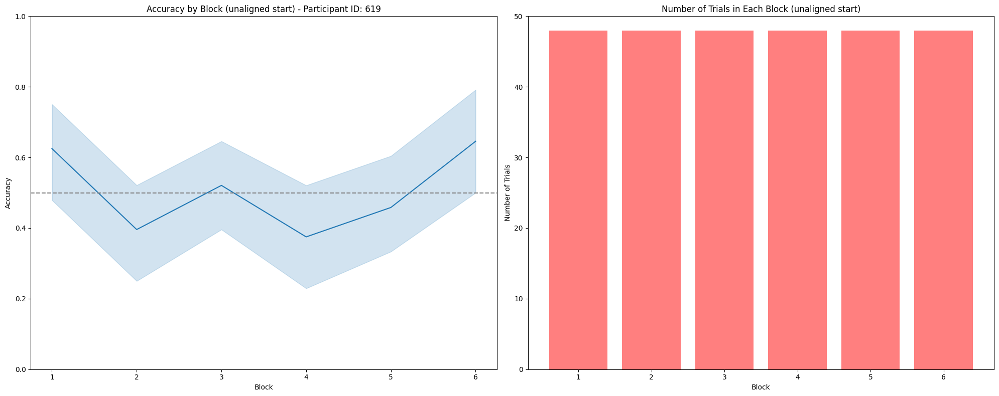

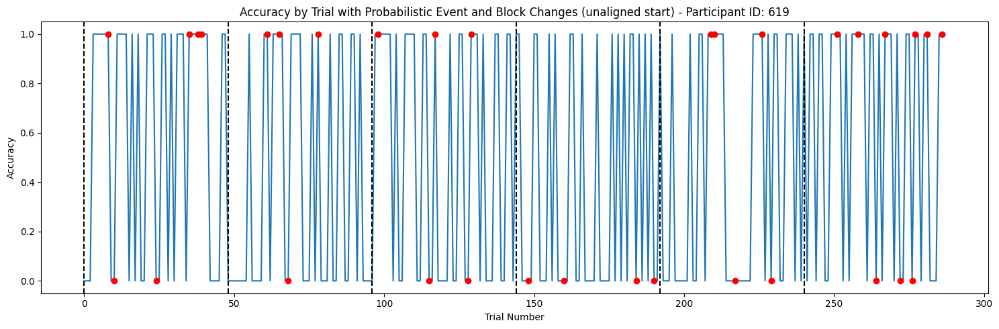

<Figure size 1200x800 with 0 Axes>

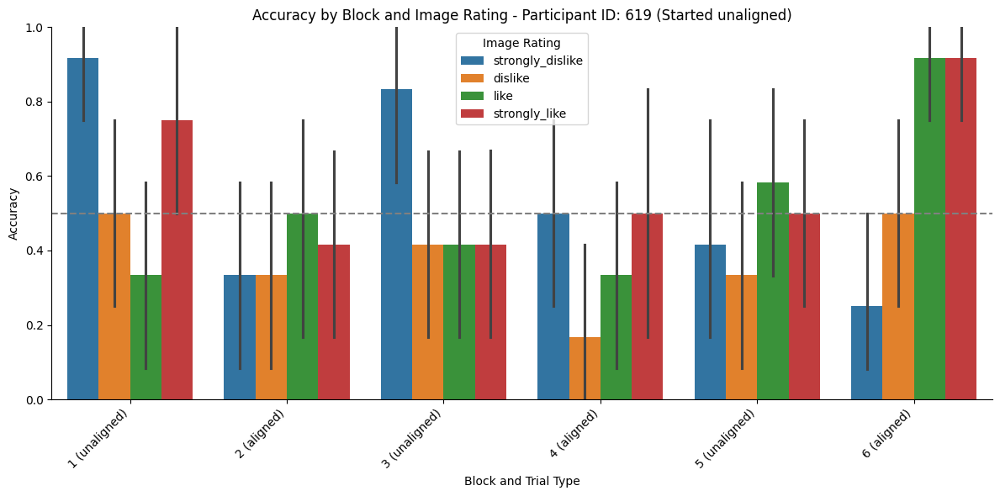

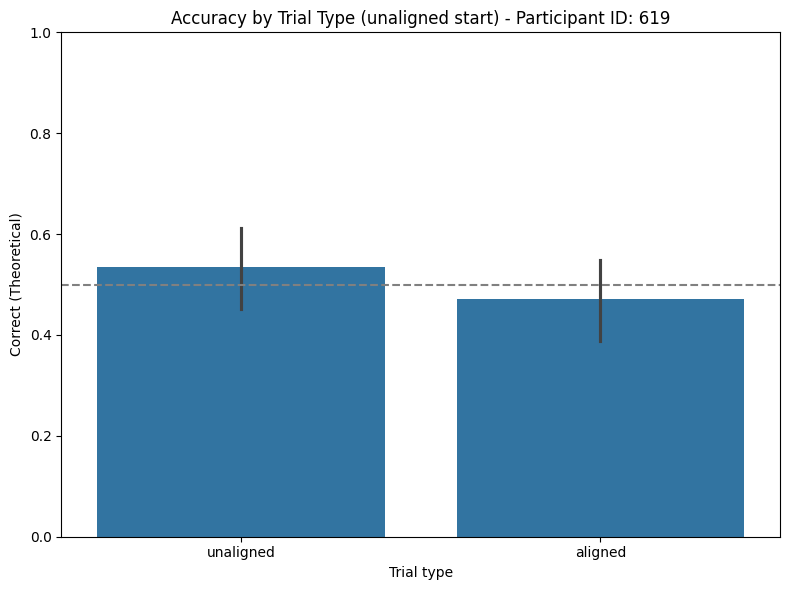

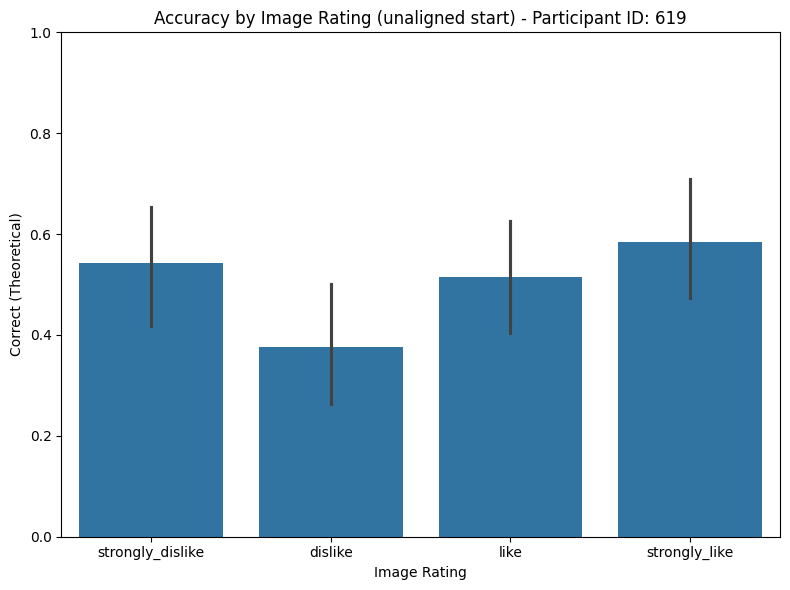

Participant ID: 619
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.625000
2    0.395833
3    0.520833
4    0.375000
5    0.458333
6    0.645833
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.472222
unaligned    0.534722
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.2904628874962106

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.625000
            2        0.395833
            3        0.520833
            4        0.375000
            5        0.458333
            6        0.645833
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.541667
dislike             0.375000
like                0.513889
strongly_like       0.583333
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


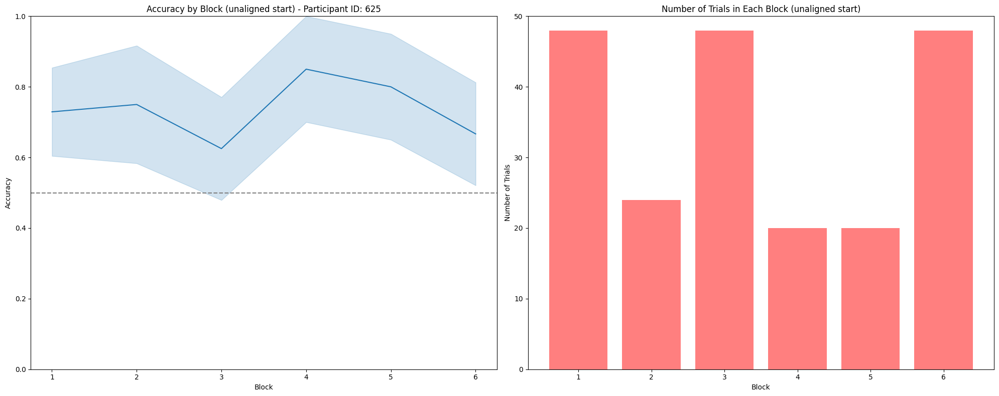

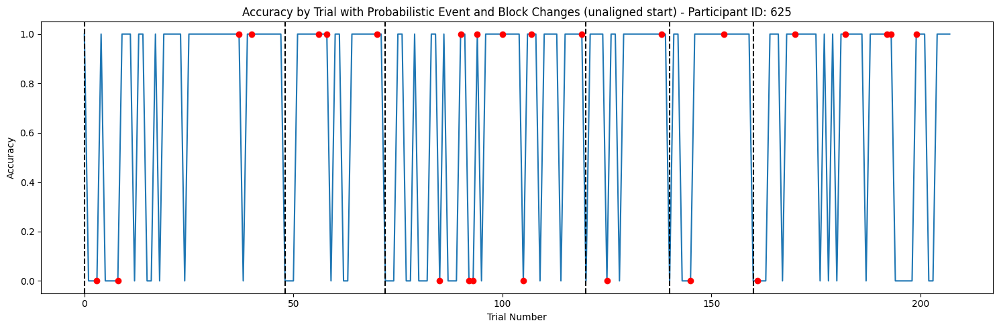

<Figure size 1200x800 with 0 Axes>

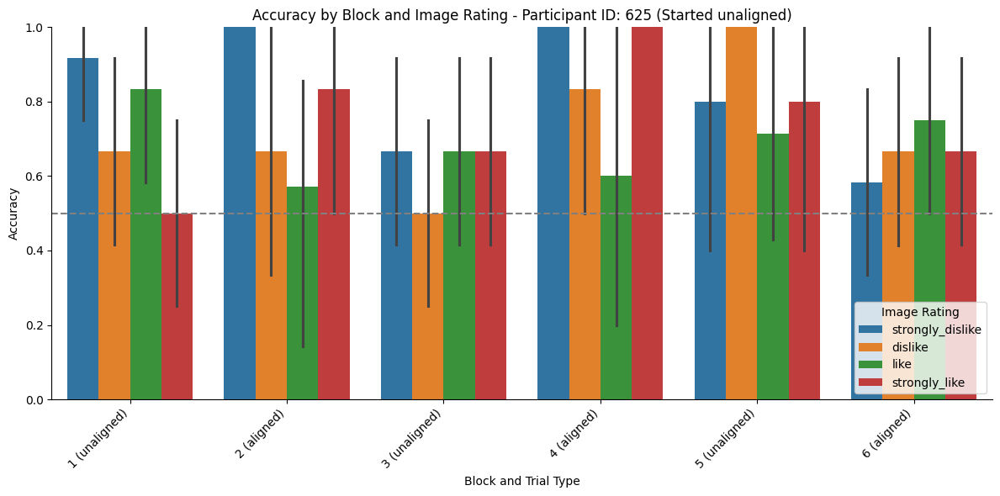

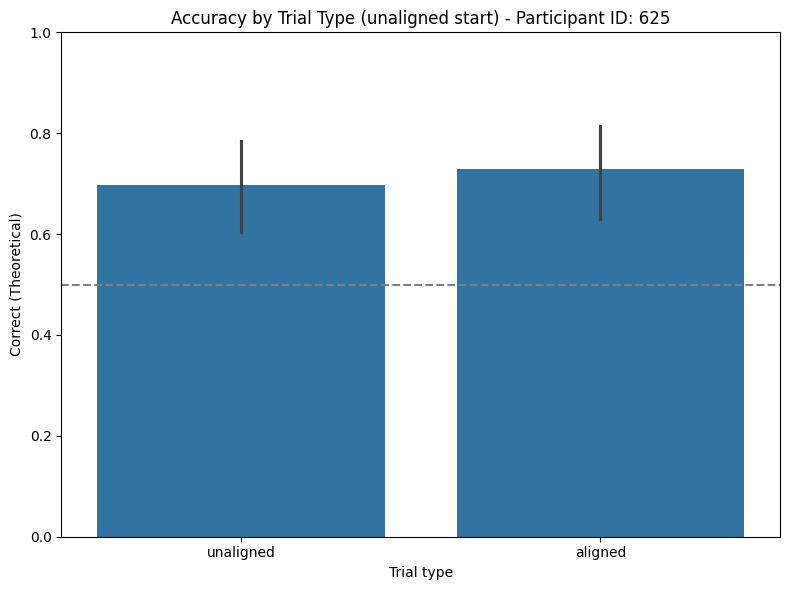

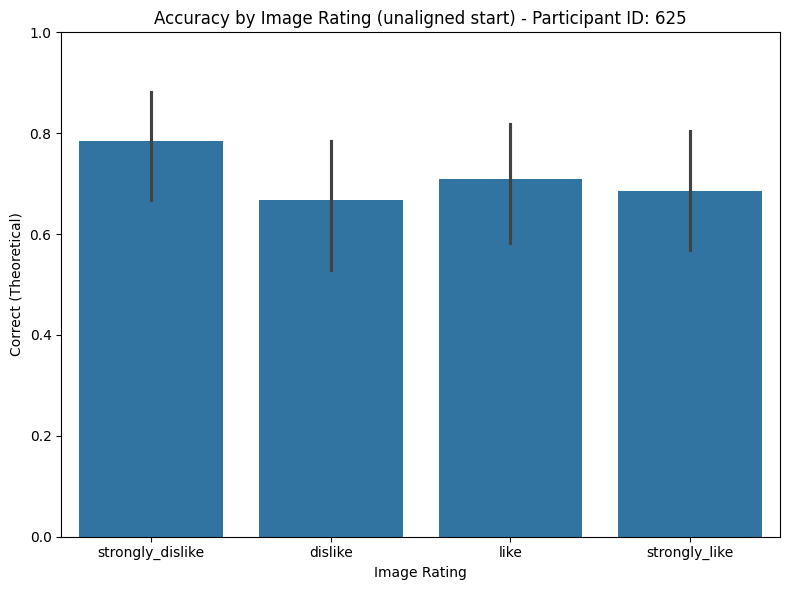

Participant ID: 625
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    24
3    48
4    20
5    20
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.729167
2    0.750000
3    0.625000
4    0.850000
5    0.800000
6    0.666667
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.728261
unaligned    0.698276
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.6373900015455498

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.729167
            2        0.750000
            3        0.625000
            4        0.850000
            5        0.800000
            6        0.666667
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.784314
dislike             0.666667
like                0.709091
strongly_like       0.686275
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


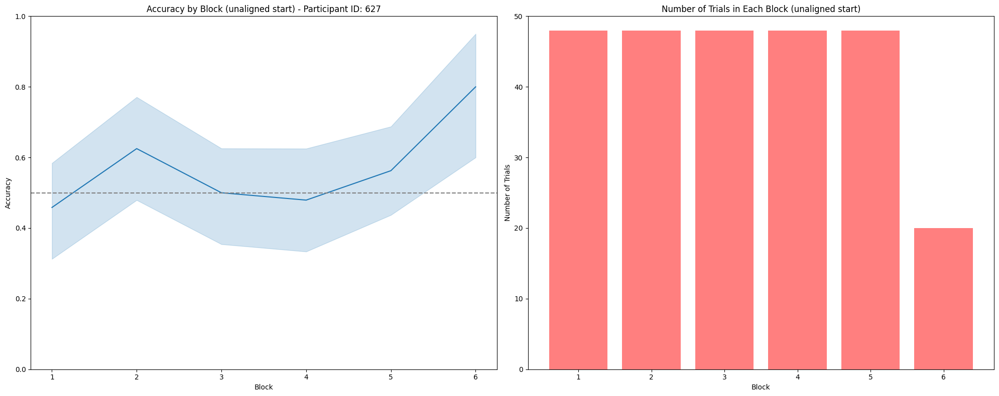

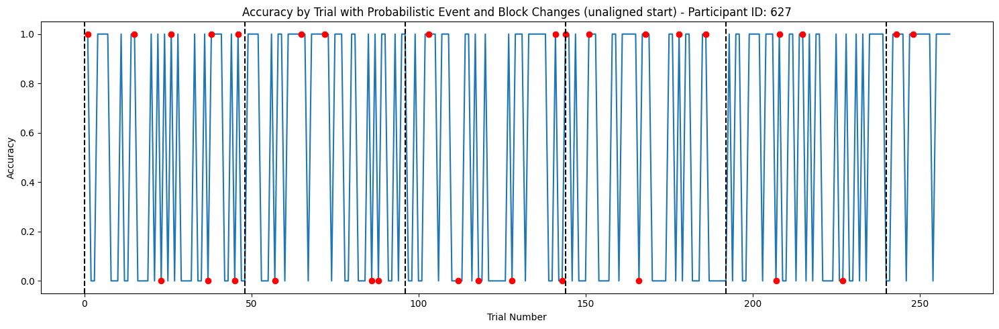

<Figure size 1200x800 with 0 Axes>

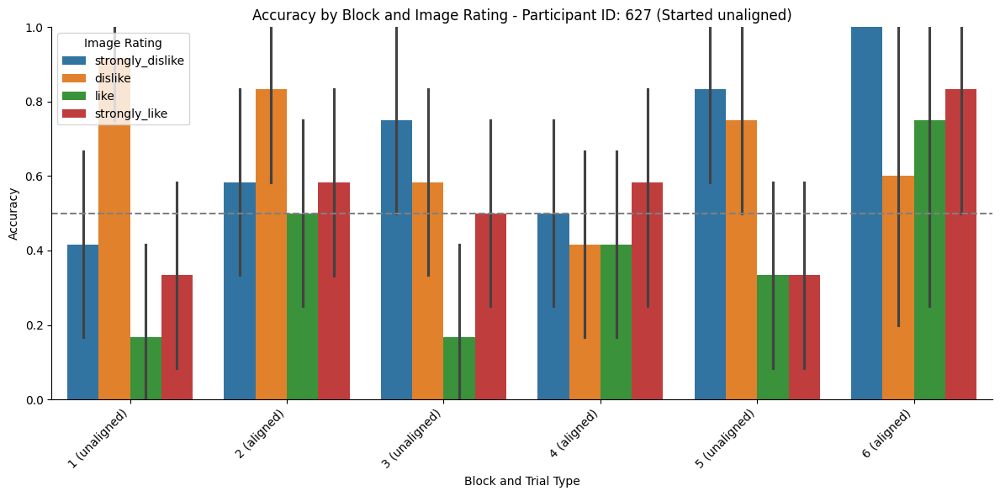

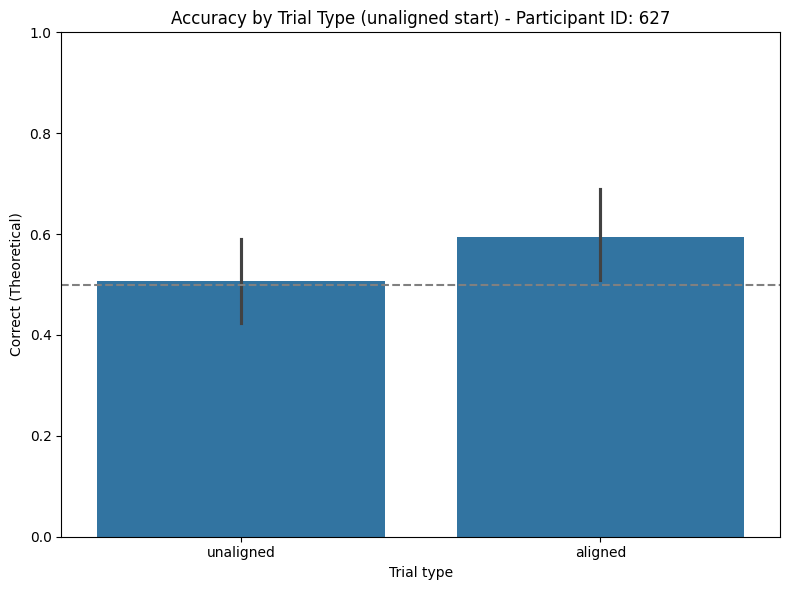

<ipython-input-3-4aad647d89d6>:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  height = max(df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05


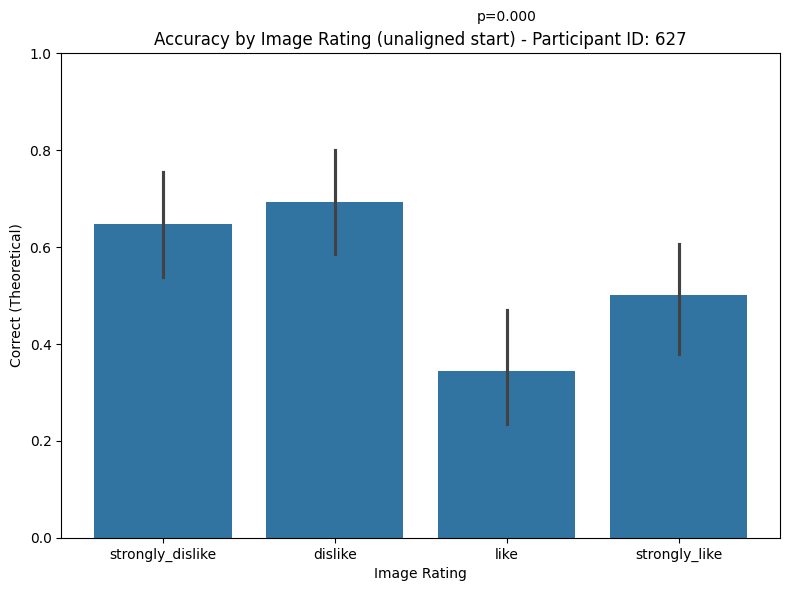

Participant ID: 627
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    48
6    20
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.458333
2    0.625000
3    0.500000
4    0.479167
5    0.562500
6    0.800000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.594828
unaligned    0.506944
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.15831016706442777

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.458333
            2        0.625000
            3        0.500000
            4        0.479167
            5        0.562500
            6        0.800000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.646154
dislike             0.692308
like                0.343750
strongly_like       0.500000
Name: Correct (Binary), dtype: f

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


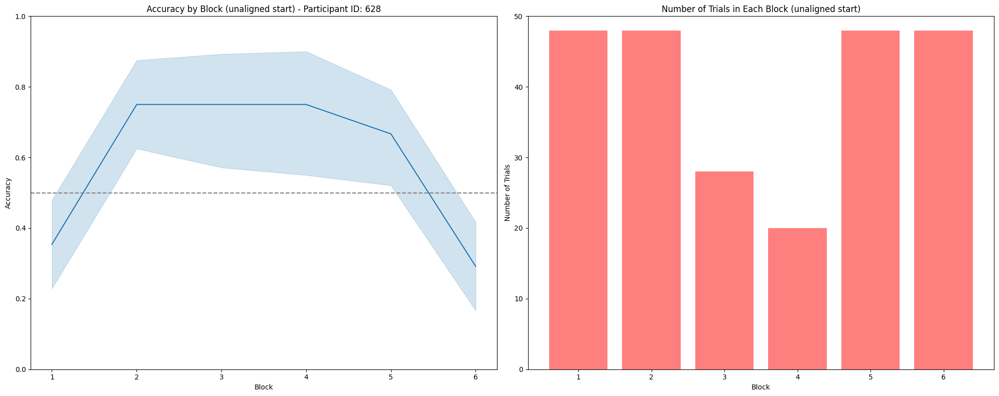

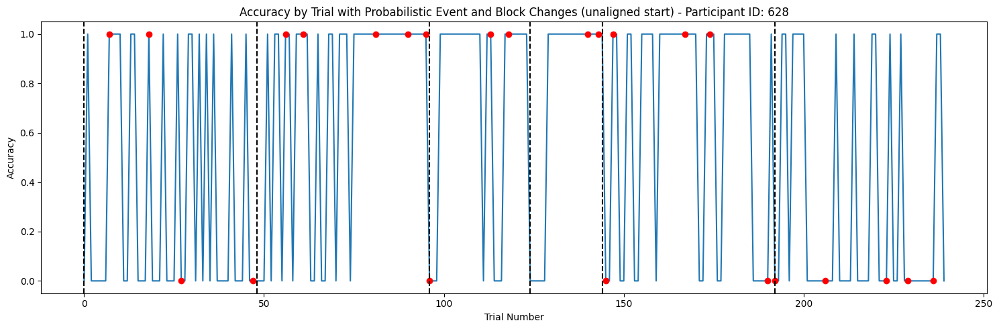

<Figure size 1200x800 with 0 Axes>

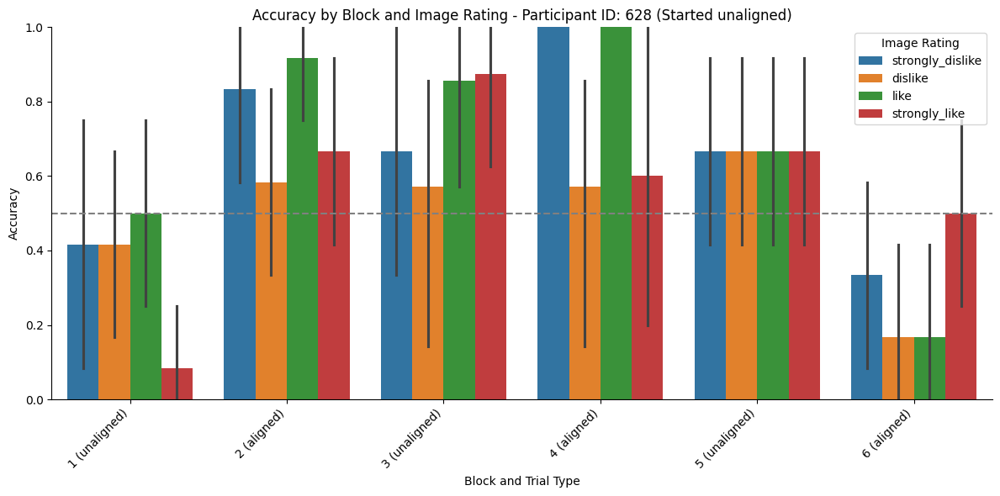

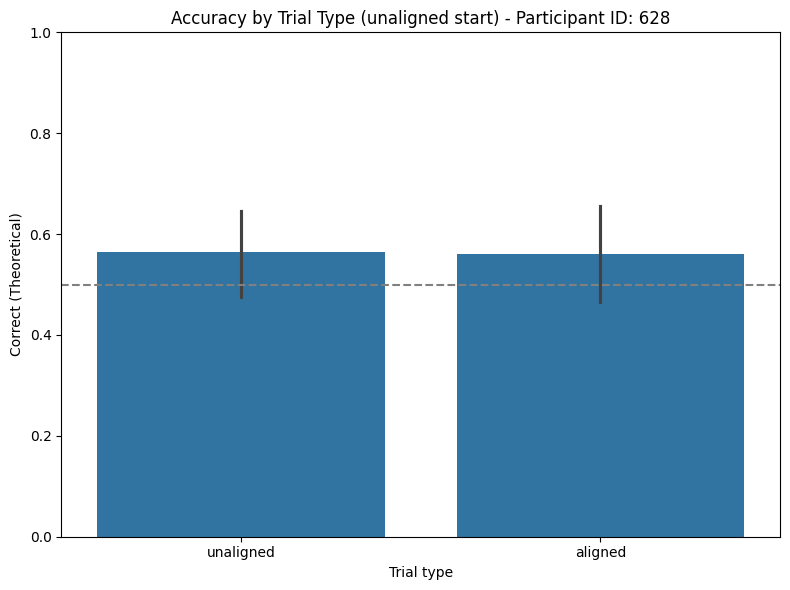

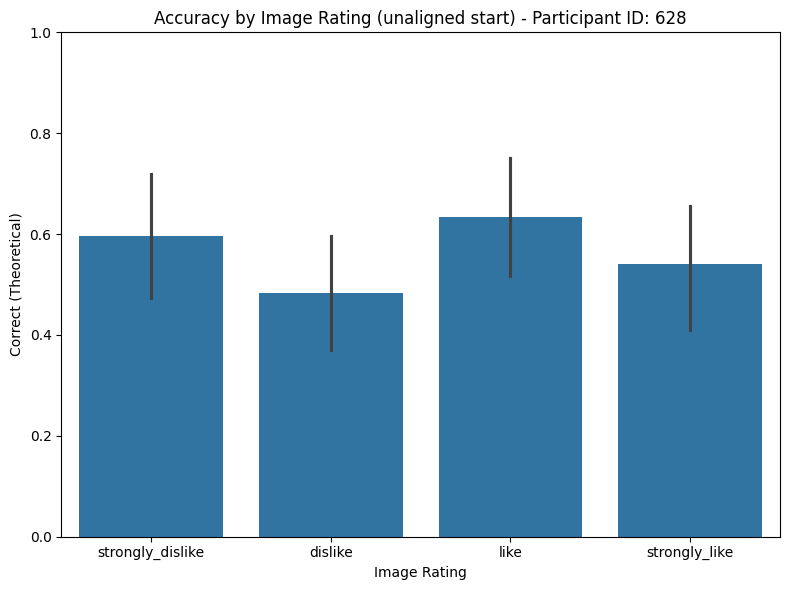

Participant ID: 628
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    28
4    20
5    48
6    48
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.354167
2    0.750000
3    0.750000
4    0.750000
5    0.666667
6    0.291667
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.560345
unaligned    0.564516
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.9483677914916675

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.354167
            2        0.750000
            3        0.750000
            4        0.750000
            5        0.666667
            6        0.291667
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.596491
dislike             0.483871
like                0.633333
strongly_like       0.540984
Name: Correct (Binary), dtype: fl

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


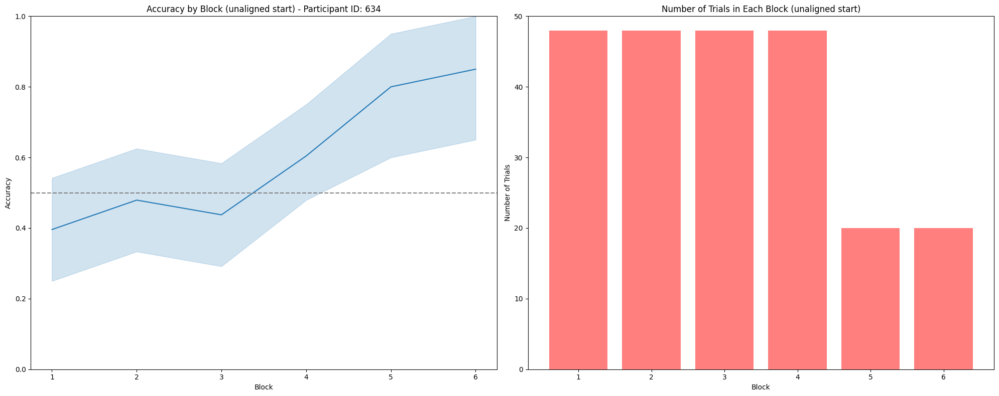

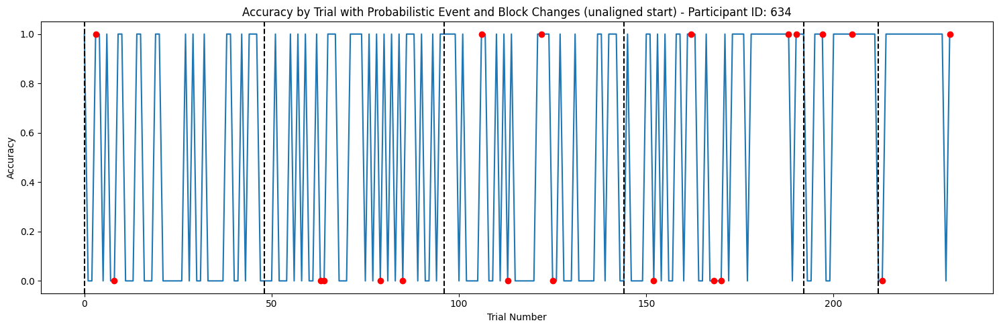

<Figure size 1200x800 with 0 Axes>

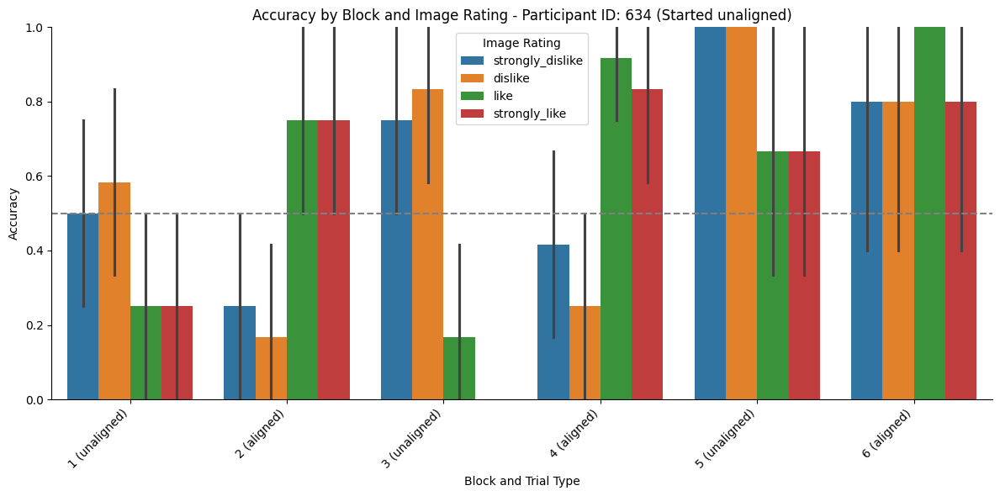

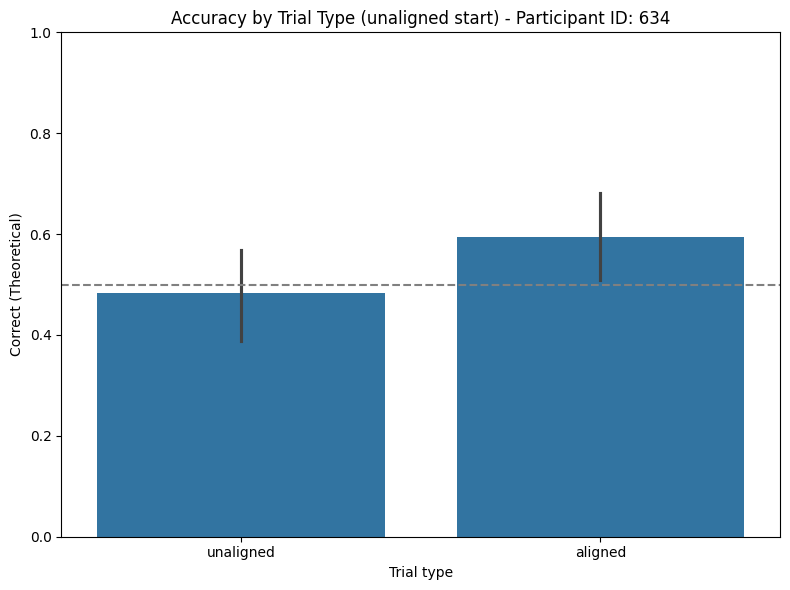

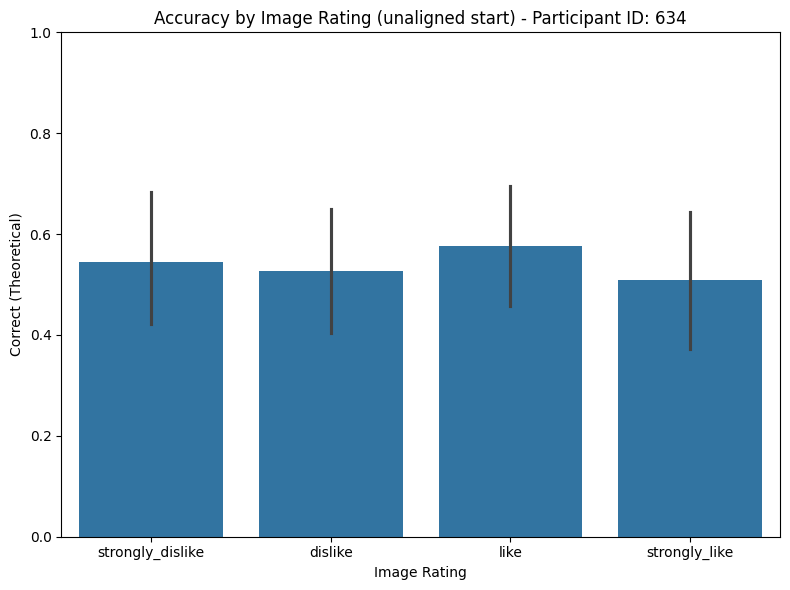

Participant ID: 634
Started with: unaligned
Number of trials in each 'Block':
Block
1    48
2    48
3    48
4    48
5    20
6    20
Name: count, dtype: int64

Accuracy in each 'Block':
Block
1    0.395833
2    0.479167
3    0.437500
4    0.604167
5    0.800000
6    0.850000
Name: Correct (Theoretical), dtype: float64

Accuracy per 'Trial type' (aligned and unaligned):
Trial type
aligned      0.594828
unaligned    0.482759
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type': 0.08757789074527407

Accuracy over the whole task:
All Trials  Block
All Trials  1        0.395833
            2        0.479167
            3        0.437500
            4        0.604167
            5        0.800000
            6        0.850000
Name: Correct (Theoretical), dtype: float64

Accuracy as a function of 'Image Rating':
Image Rating
strongly_dislike    0.543860
dislike             0.526316
like                0.576271
strongly_like       0.508475
Name: Correct (Binary), dtype: f

<ipython-input-3-4aad647d89d6>:153: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby('Image Rating')['Correct (Binary)'].mean())


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Define the image rating order
rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Determine the starting trial type (aligned or unaligned)
        starting_trial_type = df['Trial type'].iloc[0]

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()
        df['Block_Type'] = df['Block'].astype(str) + ' (' + df['Trial type'] + ')'

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Ensure 'Image Rating' is in the specified order
        df['Image Rating'] = pd.Categorical(df['Image Rating'], categories=rating_order, ordered=True)

        # Number of trials in each 'Block'
        block_counts = df['Block'].value_counts().sort_index()

        # Accuracy in each 'Block'
        block_accuracy = df.groupby('Block')['Correct (Theoretical)'].mean()

        # Accuracy per 'Trial type' (aligned and unaligned)
        trial_type_accuracy = df.groupby('Trial type')['Correct (Theoretical)'].mean()
        ttest_p_value_tt = ttest_ind(df[df['Trial type'] == 'aligned']['Correct (Theoretical)'],
                                   df[df['Trial type'] == 'unaligned']['Correct (Theoretical)'], nan_policy='omit').pvalue

        # Accuracy over the whole task
        df['Block Change'] = df['Block'].ne(df['Block'].shift())
        df['All Trials'] = 'All Trials'
        overall_accuracy = df.groupby(['All Trials', 'Block'])['Correct (Theoretical)'].mean()

        # Create a contingency table for chi-squared test
        contingency_table = pd.crosstab(df['Image Rating'], df['Correct (Binary)'])
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Visualization

        # Plot Accuracy by Block and Number of Trials in each Block
        fig, axs = plt.subplots(1, 2, figsize=(20, 8))

        # Accuracy by Block
        sns.lineplot(x='Block', y='Correct (Theoretical)', data=df, ax=axs[0])
        axs[0].set_ylabel('Accuracy')
        axs[0].axhline(y=0.5, color='gray', linestyle='--')  # Add a dotted line at y=0.5
        axs[0].set_ylim(0, 1)  # Set y-axis limits to 0-1
        axs[0].set_title(f'Accuracy by Block ({starting_trial_type} start) - Participant ID: {participant_id}')

        # Number of Trials in Each Block
        axs[1].bar(block_counts.index, block_counts, color='r', alpha=0.5)
        axs[1].set_ylabel('Number of Trials')
        axs[1].set_xlabel('Block')
        axs[1].set_ylim(0, 50)  # Set y-axis limits to 0-50
        axs[1].set_title(f'Number of Trials in Each Block ({starting_trial_type} start)')

        plt.tight_layout()
        plt.show()

        # Accuracy by Trial with Probabilistic Event and Block Changes
        plt.figure(figsize=(15, 5))
        sns.lineplot(x=df.index, y='Correct (Theoretical)', data=df)
        for i, event in enumerate(df['Probabilistic event']):
            if event:
                plt.plot(i, df.loc[i, 'Correct (Theoretical)'], 'ro')
        for i, change in enumerate(df['Block Change']):
            if change:
                plt.axvline(x=i, linestyle='--', color='k')
        plt.title(f'Accuracy by Trial with Probabilistic Event and Block Changes ({starting_trial_type} start) - Participant ID: {participant_id}')
        plt.ylabel('Accuracy')
        plt.xlabel('Trial Number')
        plt.tight_layout()
        plt.show()

        # Accuracy by Block and Image Rating
        plt.figure(figsize=(12, 8))
        sns.catplot(
            data=df,
            x='Block_Type',
            y='Correct (Binary)',
            hue='Image Rating',
            hue_order=rating_order,
            kind='bar',
            height=6,
            aspect=2,
            legend_out=False
        )
        plt.title(f'Accuracy by Block and Image Rating - Participant ID: {participant_id} (Started {starting_trial_type})')
        plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')
        plt.ylim(0, 1)  # Set y-axis limits to 0-1
        plt.xlabel('Block and Trial Type')
        plt.ylabel('Accuracy')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.tight_layout()
        plt.show()

        # Accuracy by Trial Type
        plt.figure(figsize=(8, 6))
        sns.barplot(x='Trial type', y='Correct (Theoretical)', data=df)
        plt.title(f'Accuracy by Trial Type ({starting_trial_type} start) - Participant ID: {participant_id}')
        if ttest_p_value_tt < 0.05:
            height = max(df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
            plt.plot([0, 1], [height, height], linewidth=1, color='k')
            plt.text(0.5, height + 0.01, f'p={ttest_p_value_tt:.3f}', ha='center', va='bottom')
        plt.ylim(0, 1)
        plt.axhline(y=0.5, color='gray', linestyle='--')
        plt.tight_layout()
        plt.show()

        # Accuracy by Image Rating
        plt.figure(figsize=(8, 6))
        sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=df)
        plt.title(f'Accuracy by Image Rating ({starting_trial_type} start) - Participant ID: {participant_id}')
        if p < 0.05:
            height = max(df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
            plt.plot(range(len(rating_order)), [height] * len(rating_order), linewidth=1, color='k')
            plt.text(len(rating_order) // 2, height + 0.01, f'p={p:.3f}', ha='center', va='bottom')
        plt.ylim(0, 1)
        plt.tight_layout()
        plt.show()

        # Output results
        print(f"Participant ID: {participant_id}")
        print(f"Started with: {starting_trial_type}")
        print("Number of trials in each 'Block':")
        print(block_counts)
        print("\nAccuracy in each 'Block':")
        print(block_accuracy)
        print("\nAccuracy per 'Trial type' (aligned and unaligned):")
        print(trial_type_accuracy)
        print(f"t-test p-value for 'Trial type': {ttest_p_value_tt}")
        print("\nAccuracy over the whole task:")
        print(overall_accuracy)
        print("\nAccuracy as a function of 'Image Rating':")
        print(df.groupby('Image Rating')['Correct (Binary)'].mean())
        print(f"Chi-squared p-value for 'Image Rating': {p:.15f}")
        print("Data for Chi-squared test:")
        print(contingency_table)


###Only last 15 trials of each block

<IPython.core.display.Javascript object>

Processing data for participant 592
            Image      Image Rating Expectation   Outcome  Response Time  \
0    celerysticks              like    positive  negative          804.0   
1  americancheese           dislike    negative  positive         1410.0   
2             lox  strongly_dislike    positive  positive          355.0   
3    celerysticks              like    negative  negative          877.0   
4        icecream     strongly_like    positive  negative          569.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2486.0       701    False                  False                False   
1    2221.0       770    False                  False                False   
2    2684.5       573     True                   True                False   
3    2433.5       749     True                   True                False   
4    2625.5       707    False                  False                False   

  Trial type  
0  unaligned  
1  unali

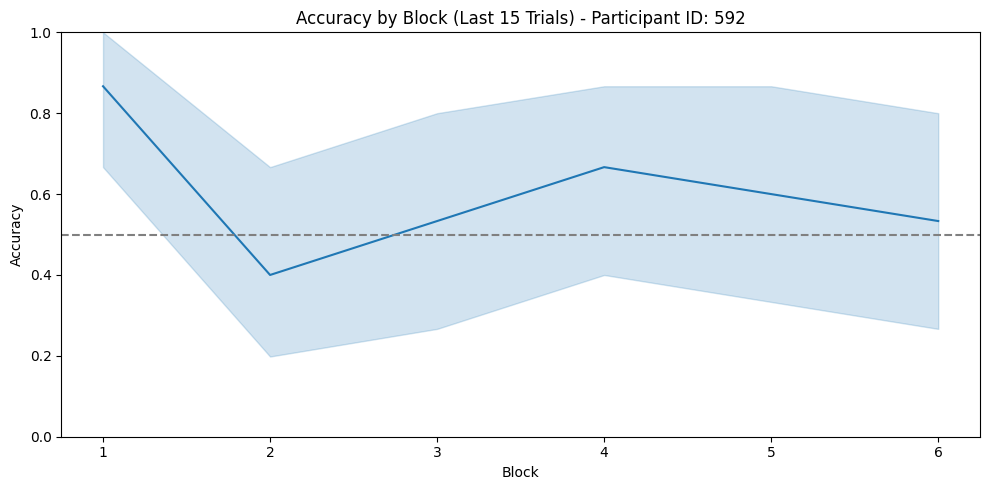

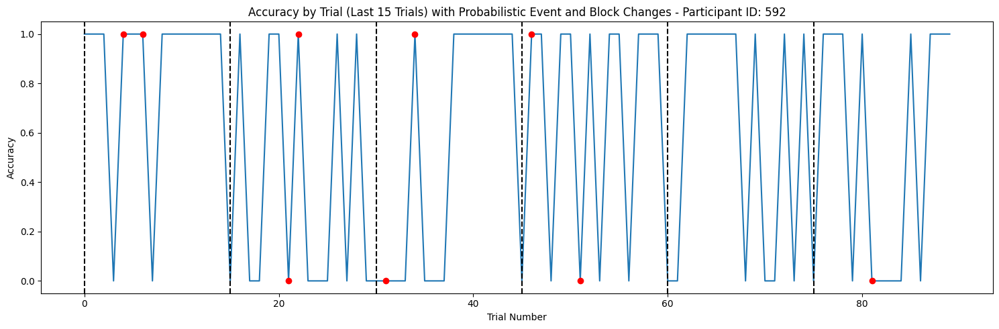

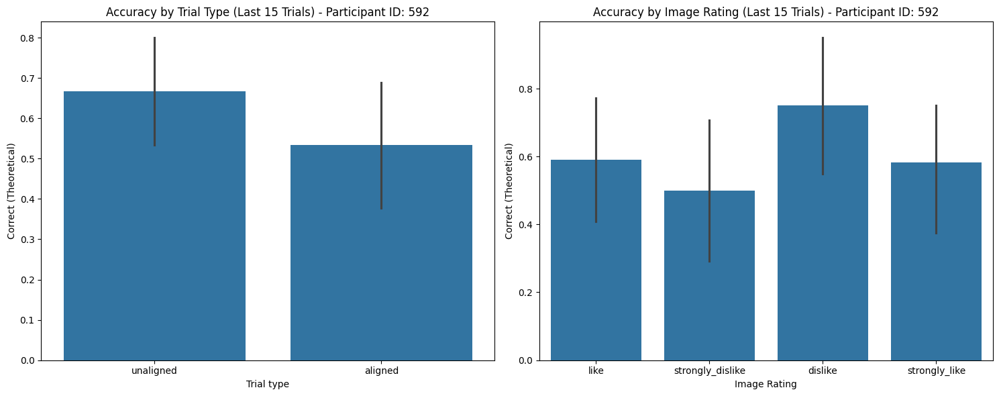

Processing data for participant 593
          Image      Image Rating Expectation   Outcome  Response Time  \
0    cantaloupe              like    negative  negative          418.0   
1  celerysticks  strongly_dislike    positive  positive          413.0   
2         sushi     strongly_like    negative  negative          431.0   
3   bakedpotato           dislike    positive  negative          366.0   
4         sushi     strongly_like    negative  negative          756.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2701.0       504     True                   True                False   
1    2409.5       708     True                   True                False   
2    2754.5       963     True                   True                False   
3    2525.0       528    False                   True                 True   
4    2156.0       598     True                   True                False   

  Trial type  
0  unaligned  
1  unaligned  
2  un

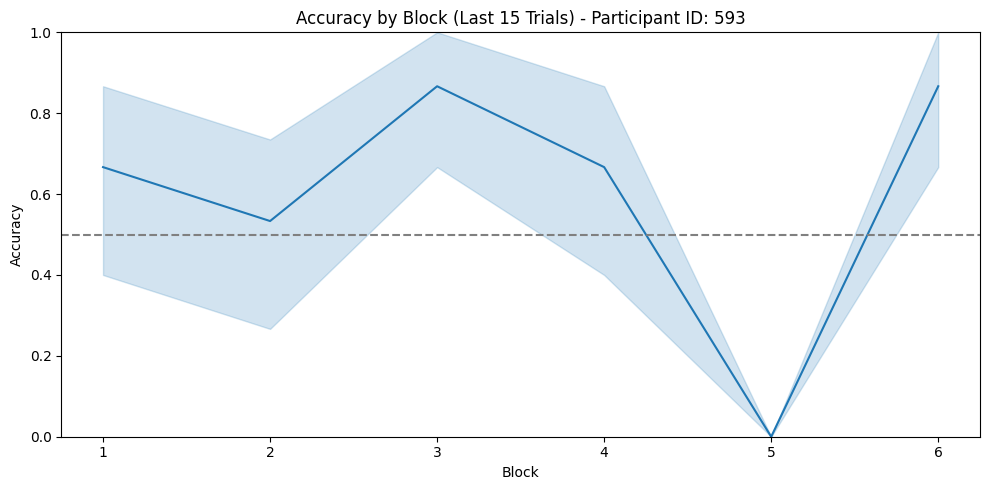

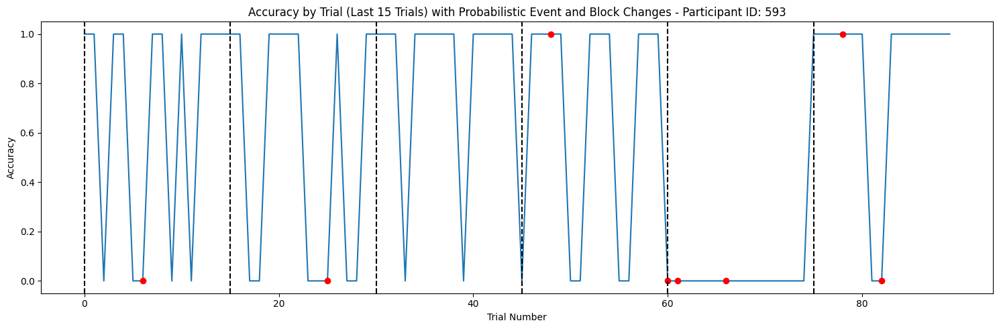

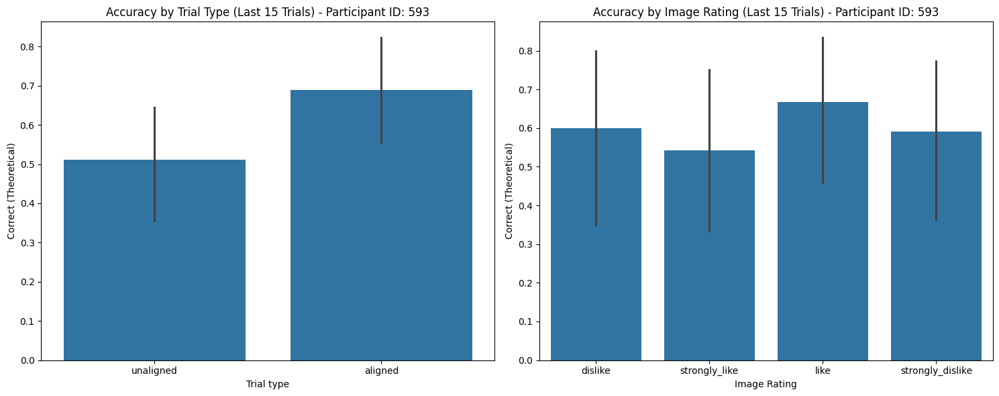

Processing data for participant 594
         Image      Image Rating Expectation   Outcome  Response Time  \
0        mango              like    positive  negative          494.0   
1     cheezits           dislike    positive  positive         1351.0   
2    ricecakes  strongly_dislike    negative  positive          876.0   
3  blueberries     strongly_like    negative  negative          462.0   
4    ricecakes  strongly_dislike    negative  negative         1757.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2442.0       622    False                  False                False   
1    1966.5       748     True                   True                False   
2    2514.0       836    False                  False                False   
3    2439.0       832     True                   True                False   
4    1817.5       760     True                  False                 True   

  Trial type  
0  unaligned  
1  unaligned  
2  unaligne

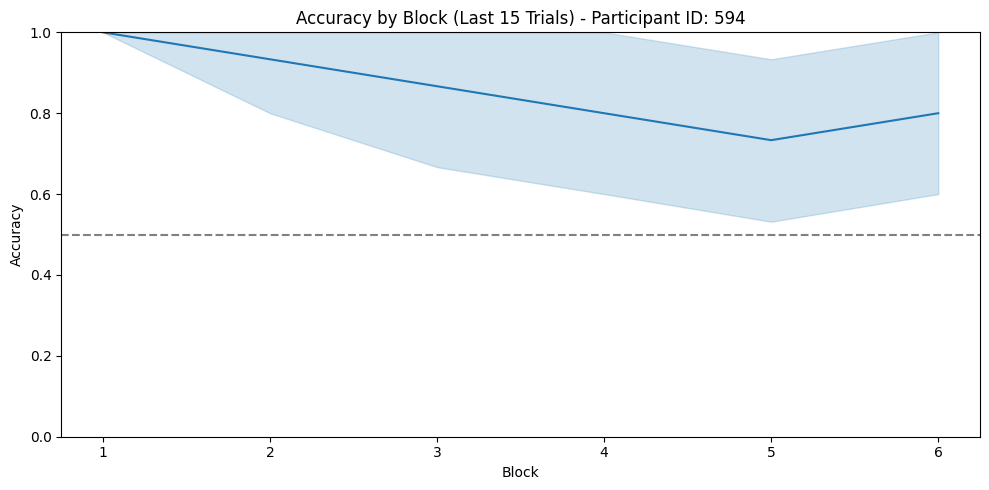

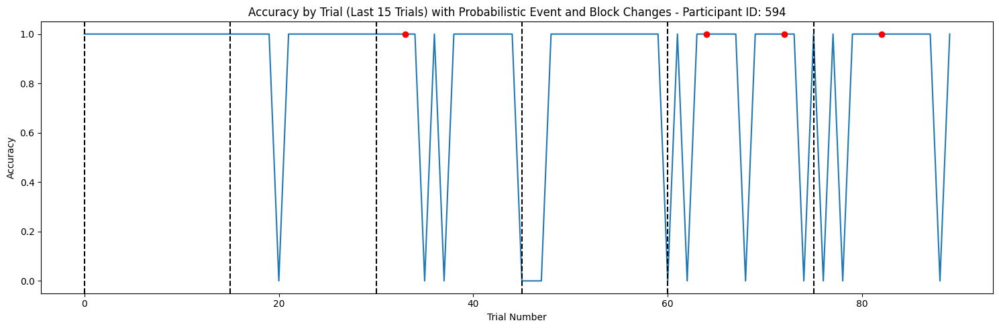

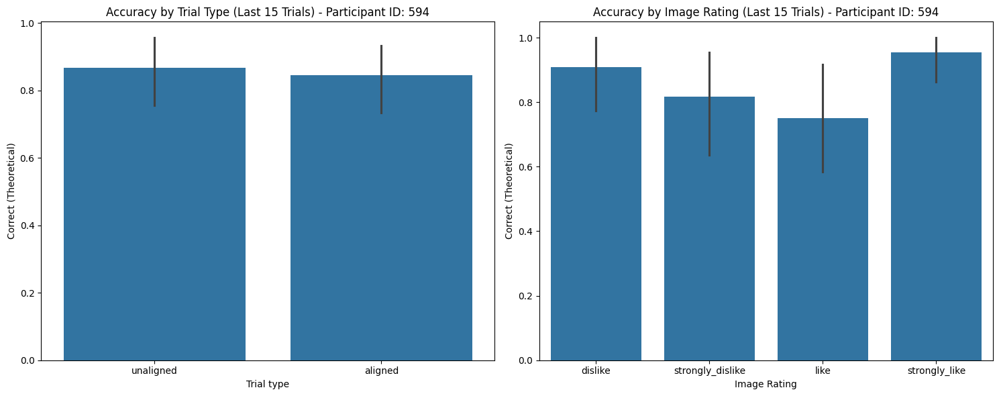

Processing data for participant 595
            Image      Image Rating Expectation   Outcome  Response Time  \
0  yogurtpretzels              like    positive  negative         1194.0   
1         edamame     strongly_like    positive  negative          679.0   
2        saltines           dislike    positive  positive          416.0   
3  cucumberslices  strongly_dislike    positive  positive         1048.0   
4  yogurtpretzels              like    positive  negative          467.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2130.0       615    False                  False                False   
1    2588.5       617    False                  False                False   
2    2382.0       865     True                   True                False   
3    2073.0       989     True                   True                False   
4    2379.5       721    False                  False                False   

  Trial type  
0  unaligned  
1  unali

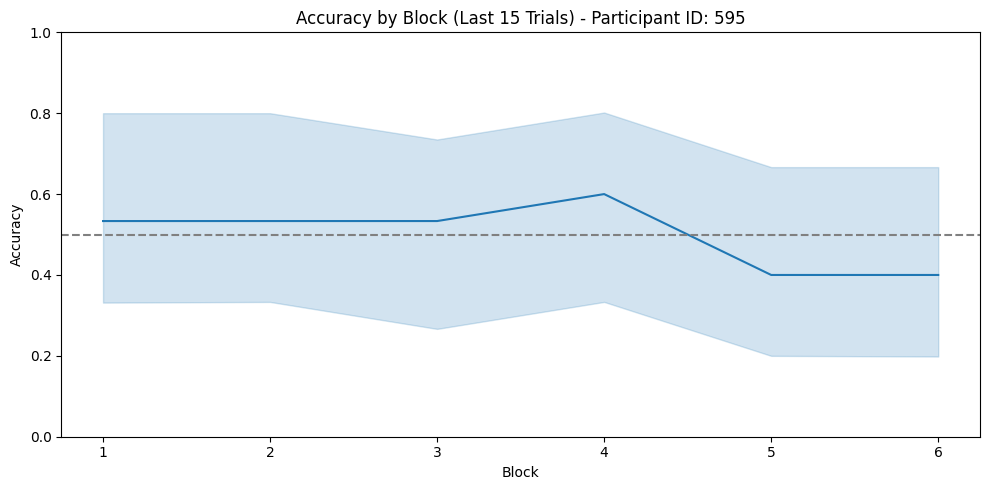

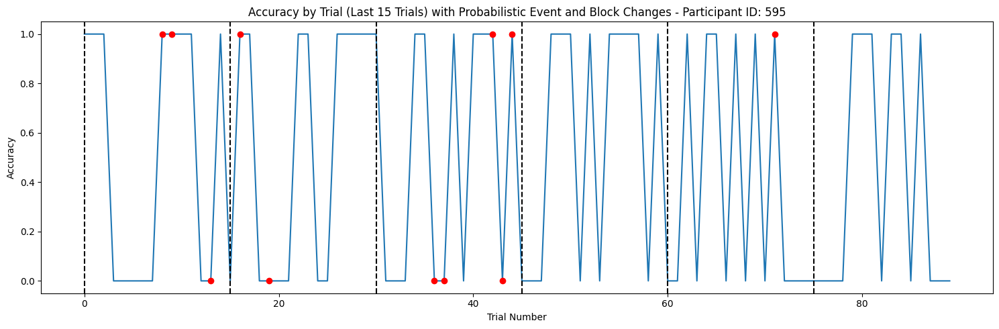

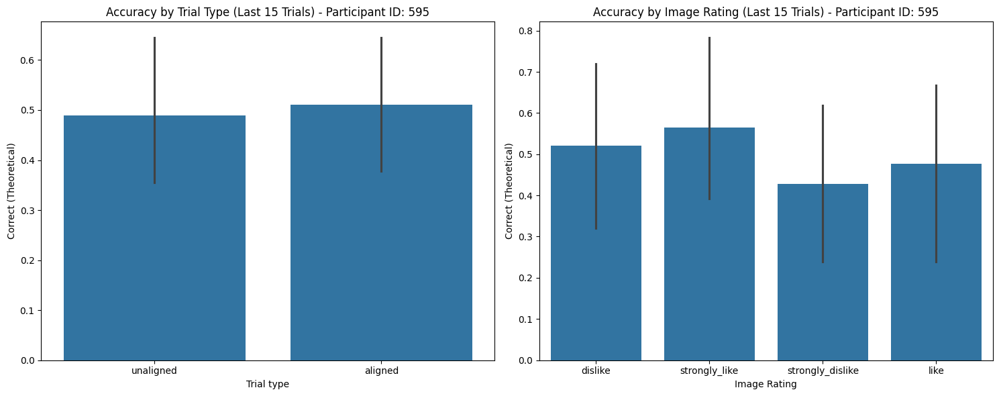

Processing data for participant 596
      Image      Image Rating Expectation   Outcome  Response Time  Jitter 1  \
0  pretzels  strongly_dislike    positive  positive          309.0    2749.5   
1   edamame     strongly_like    positive  negative          315.0    2611.5   
2    grapes           dislike    negative  positive          274.0    2763.0   
3     mango              like    positive  negative          291.0    2390.5   
4    grapes           dislike    positive  positive          282.0    2421.0   

   Jitter 2  Correct  Correct (Theoretical)  Probabilistic event Trial type  
0       515     True                   True                False  unaligned  
1       527    False                  False                False  unaligned  
2       835    False                  False                False  unaligned  
3       655    False                  False                False  unaligned  
4       704     True                   True                False  unaligned  
Participant ID:

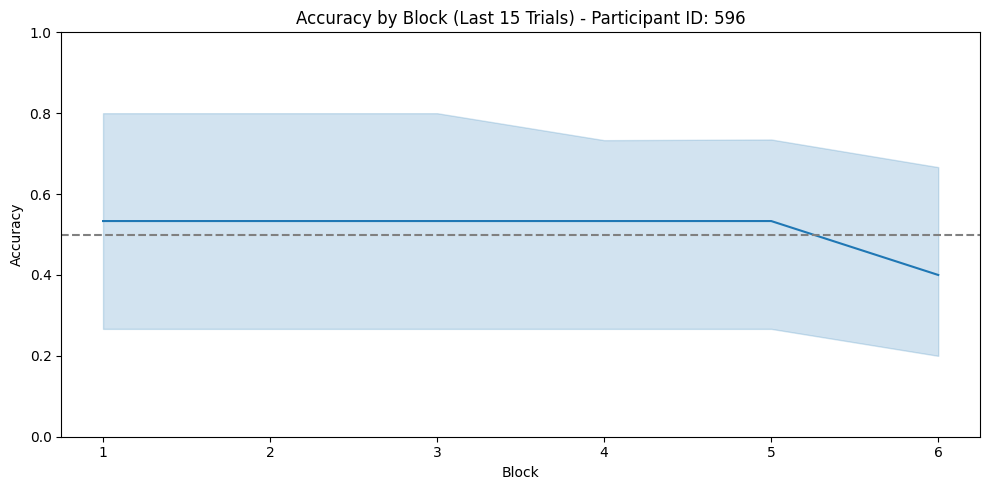

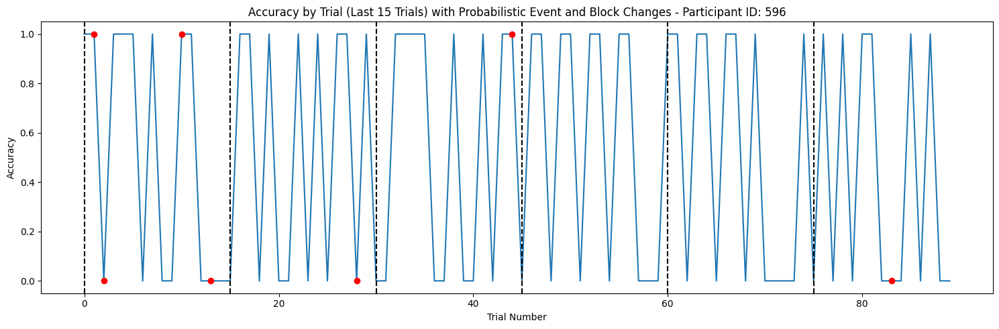

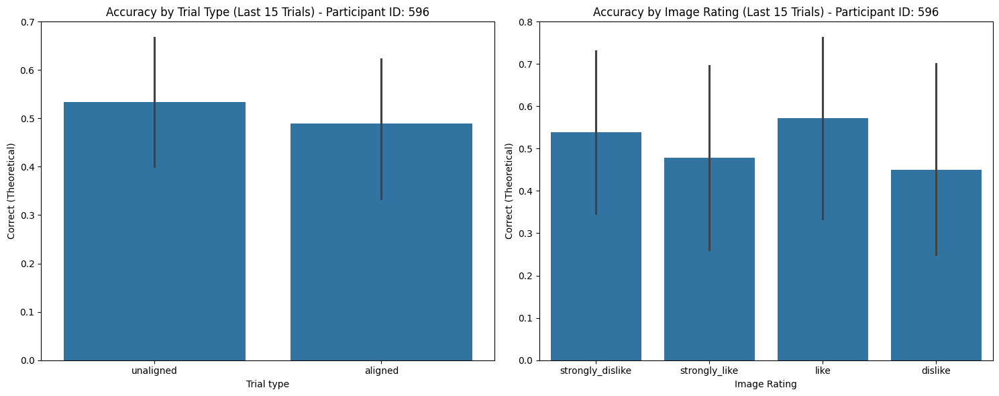

Processing data for participant 597
         Image      Image Rating Expectation   Outcome  Response Time  \
0  swedishfish  strongly_dislike    positive  negative          664.0   
1    croissant     strongly_like    positive  positive          452.0   
2     broccoli              like    positive  positive          553.0   
3    croissant     strongly_like    positive  positive          785.0   
4         pear           dislike    positive  positive          380.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2465.0       761    False                  False                False   
1    2472.0       591     True                   True                False   
2    2623.5       699     True                   True                False   
3    2439.5       796     True                   True                False   
4    2608.0       819     True                  False                 True   

  Trial type  
0    aligned  
1    aligned  
2    aligne

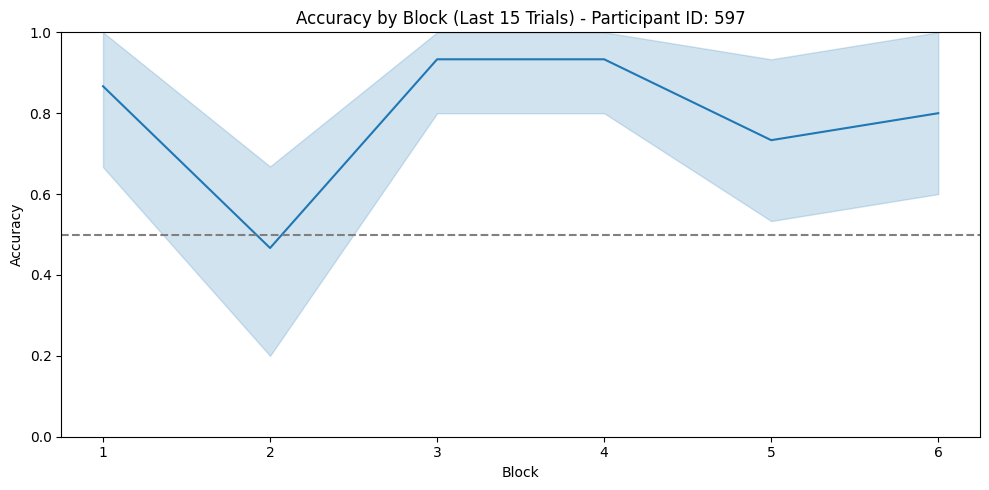

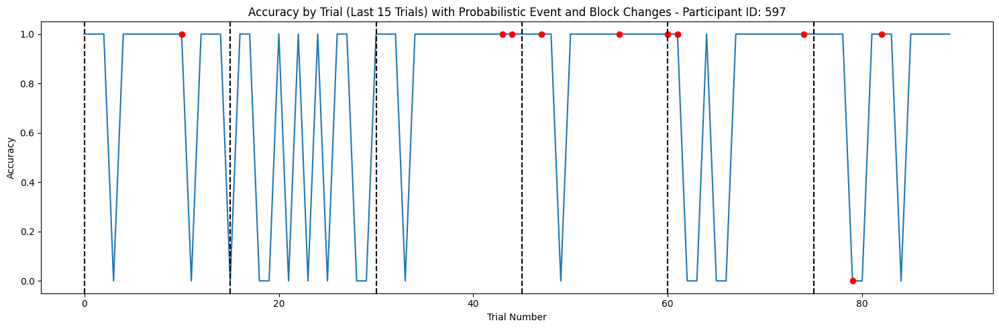

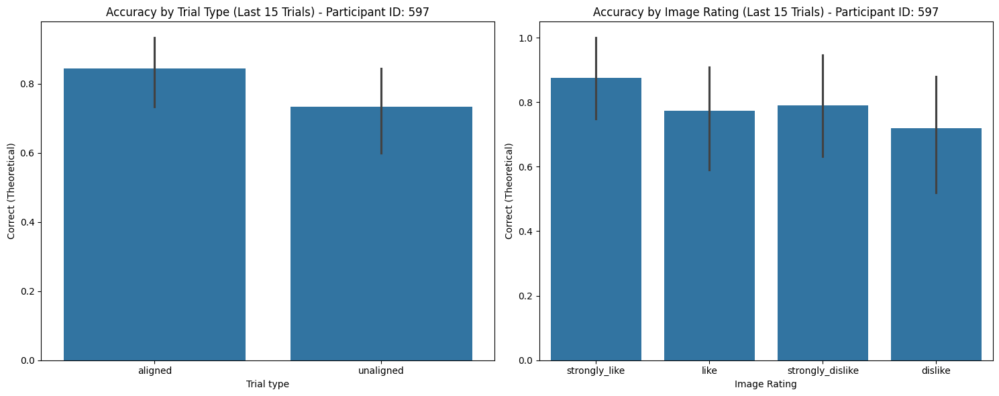

Processing data for participant 600
        Image      Image Rating Expectation   Outcome  Response Time  \
0   triscuits              like    positive  positive          715.0   
1      grapes     strongly_like    positive  positive         1244.0   
2  wheatbread           dislike    positive  negative          928.0   
3        eggs  strongly_dislike    negative  positive          780.0   
4  wheatbread           dislike    negative  negative          563.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2204.5       834     True                   True                False   
1    1942.0       895     True                   True                False   
2    2355.0       621    False                  False                False   
3    2523.0       800    False                   True                 True   
4    2505.5       788     True                   True                False   

  Trial type  
0    aligned  
1    aligned  
2    aligned  
3 

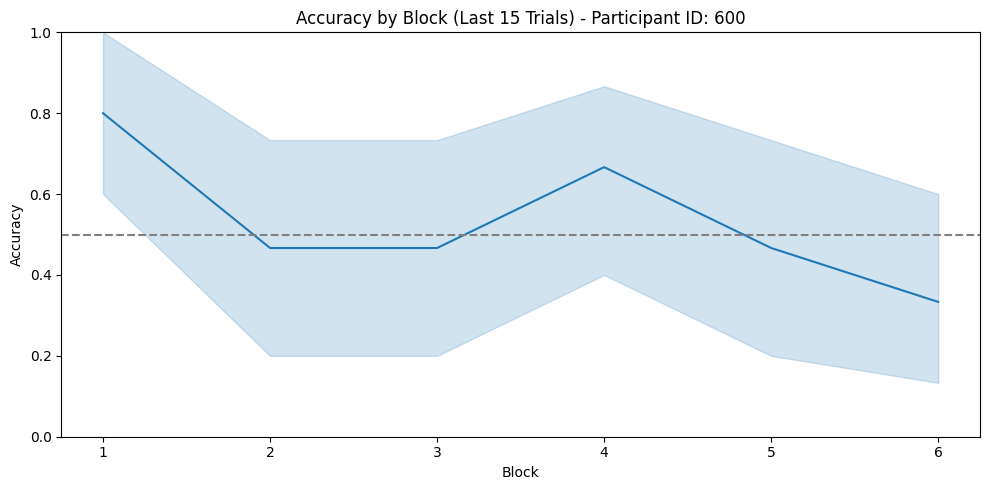

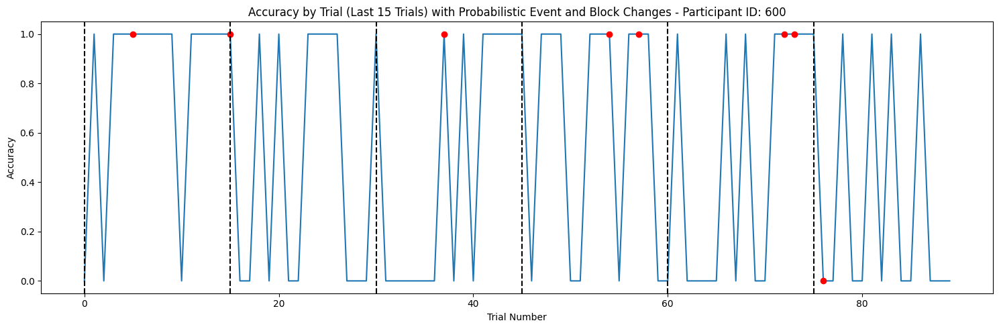

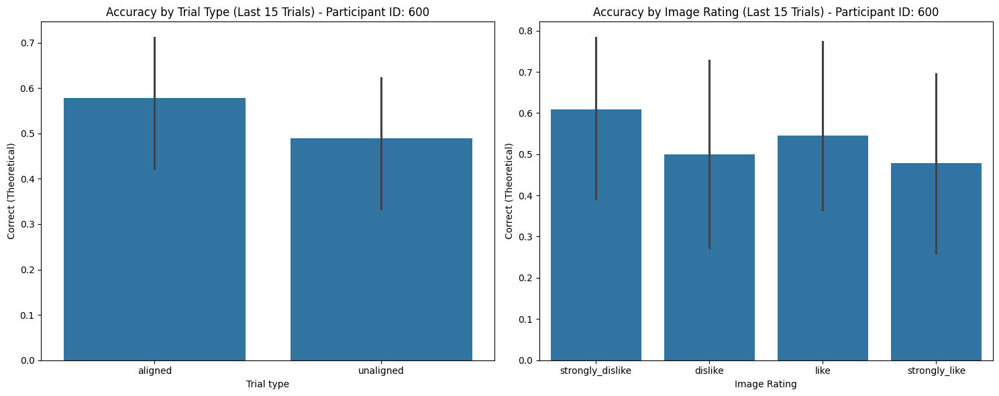

Processing data for participant 603
        Image      Image Rating Expectation   Outcome  Response Time  \
0   popsicles  strongly_dislike    negative  negative          388.0   
1  granolabar     strongly_like    positive  positive          566.0   
2        kiwi              like    positive  positive          399.0   
3   popsicles  strongly_dislike    negative  negative          399.0   
4     edamame           dislike    positive  negative          432.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2627.0       944     True                   True                False   
1    2505.0       965     True                   True                False   
2    2556.5       996     True                   True                False   
3    2532.5       789     True                   True                False   
4    2417.0       916    False                  False                False   

  Trial type  
0    aligned  
1    aligned  
2    aligned  
3 

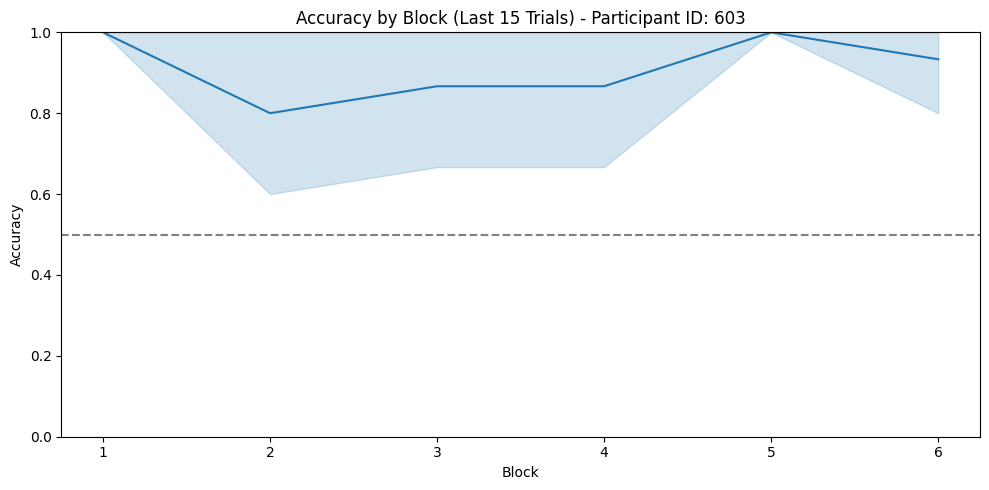

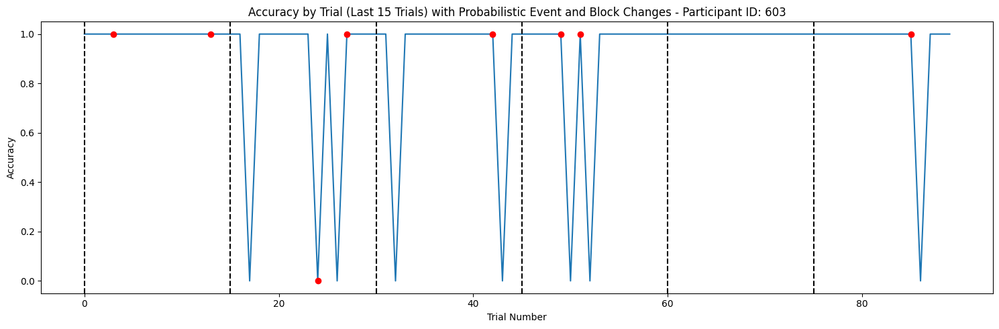

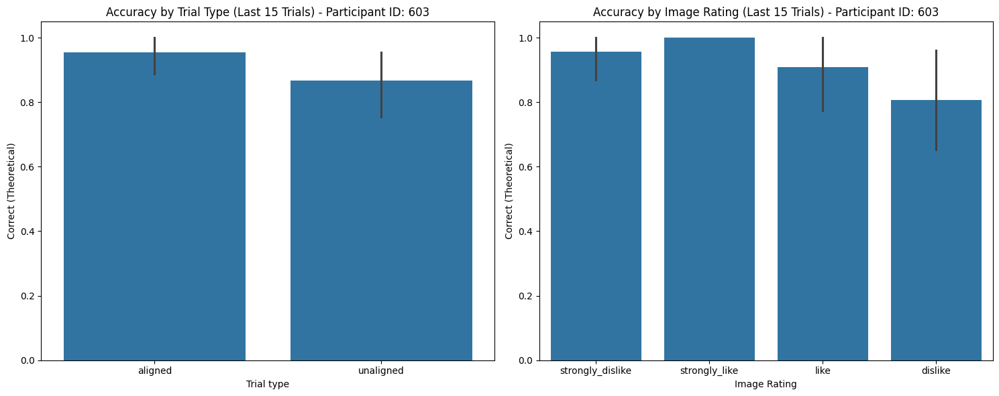

Processing data for participant 608
            Image      Image Rating Expectation   Outcome  Response Time  \
0            eggs  strongly_dislike    positive  negative            447   
1         cookies     strongly_like    positive  positive            530   
2            eggs  strongly_dislike    negative  negative            488   
3  americancheese           dislike    negative  negative            535   
4     appleslices              like    positive  positive            447   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2508.5       738    False                  False                False   
1    2475.0       790     True                   True                False   
2    2313.0       524     True                   True                False   
3    2416.5       704     True                   True                False   
4    2745.5       774     True                   True                False   

  Trial type  
0    aligned  
1    ali

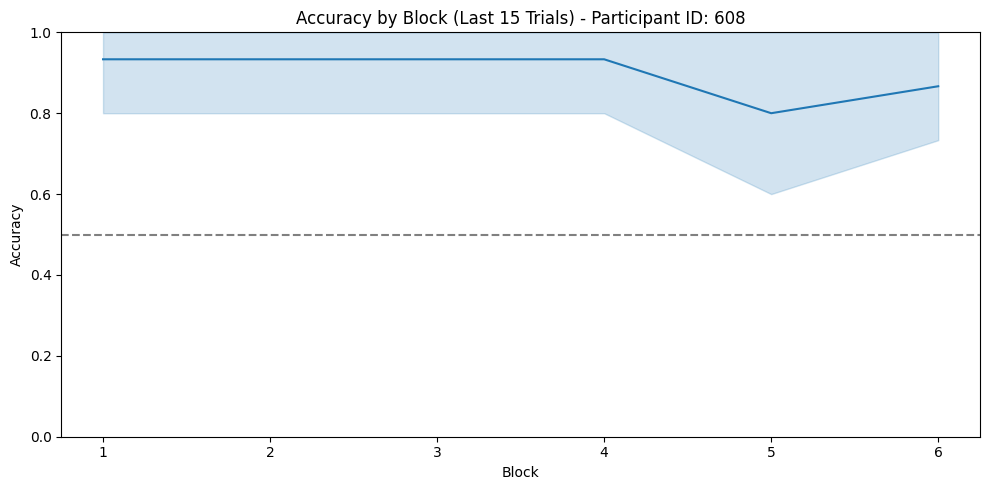

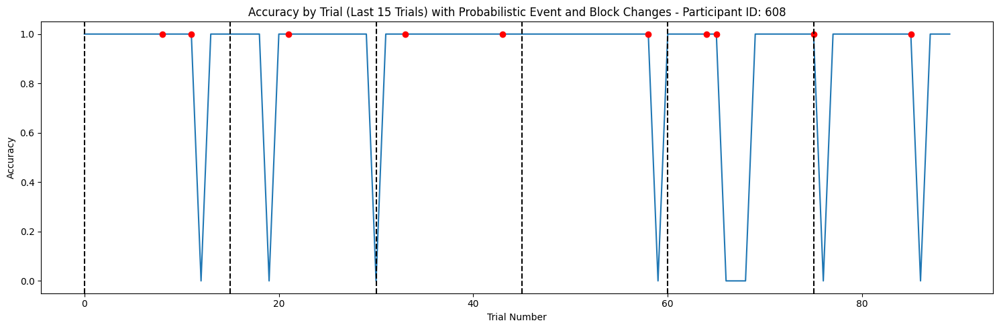

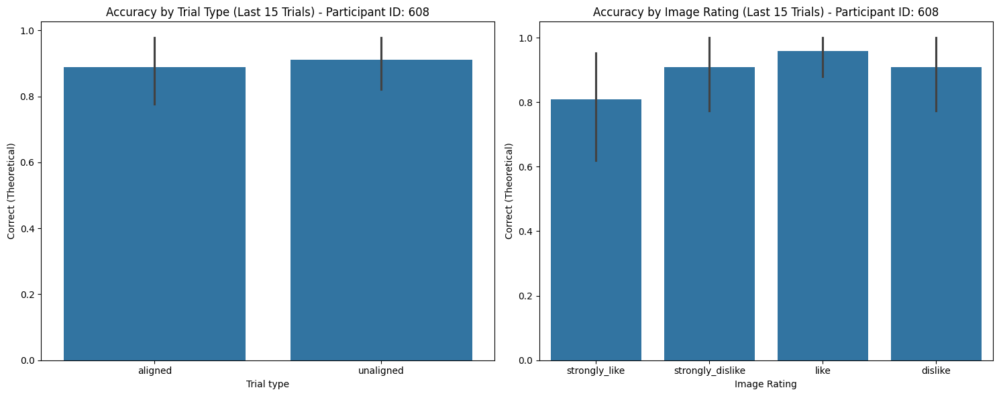

Processing data for participant 610
          Image   Image Rating Expectation   Outcome  Response Time  Jitter 1  \
0      broccoli        dislike    negative  positive         1603.0    2162.5   
1  strawberries  strongly_like    positive  positive          486.0    2274.0   
2      broccoli        dislike    negative  negative          401.0    2487.5   
3  strawberries  strongly_like    positive  positive          336.0    2405.0   
4   minimuffins           like    positive  positive          567.0    2374.5   

   Jitter 2  Correct  Correct (Theoretical)  Probabilistic event Trial type  
0       902    False                   True                 True    aligned  
1       859     True                   True                False    aligned  
2       600     True                   True                False    aligned  
3       610     True                   True                False    aligned  
4       803     True                   True                False    aligned  
Participa

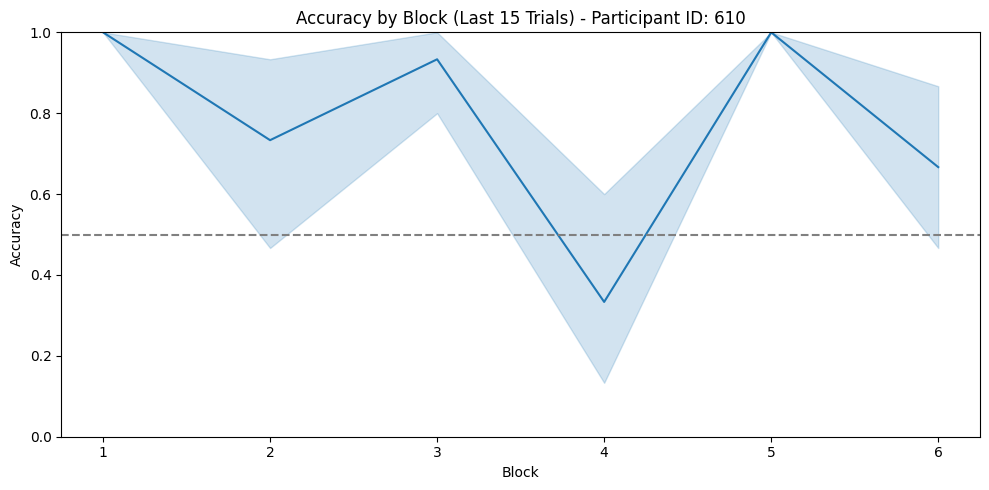

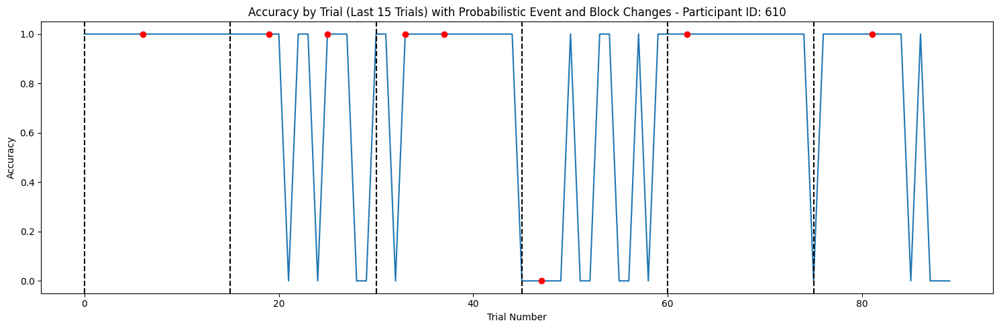

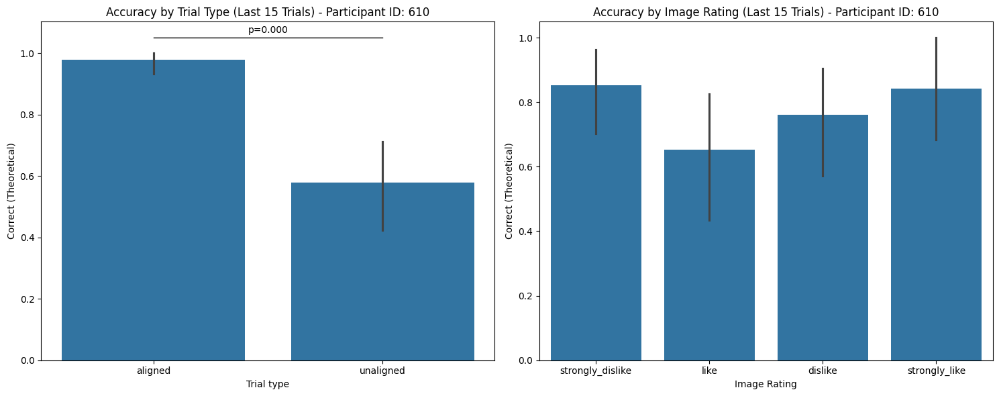

Processing data for participant 609
               Image   Image Rating Expectation   Outcome  Response Time  \
0            doritos  strongly_like    positive  positive          666.0   
1     yogurtpretzels        dislike    negative  negative         2080.0   
2            doritos  strongly_like    positive  negative          493.0   
3  chocolatepretzels           like    positive  positive          771.0   
4     yogurtpretzels        dislike    negative  negative          685.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2656.0       670     True                   True                False   
1    1841.0       617     True                   True                False   
2    2536.5       588    False                   True                 True   
3    2266.5       688     True                   True                False   
4    2267.5       738     True                   True                False   

  Trial type  
0    aligned  
1    ali

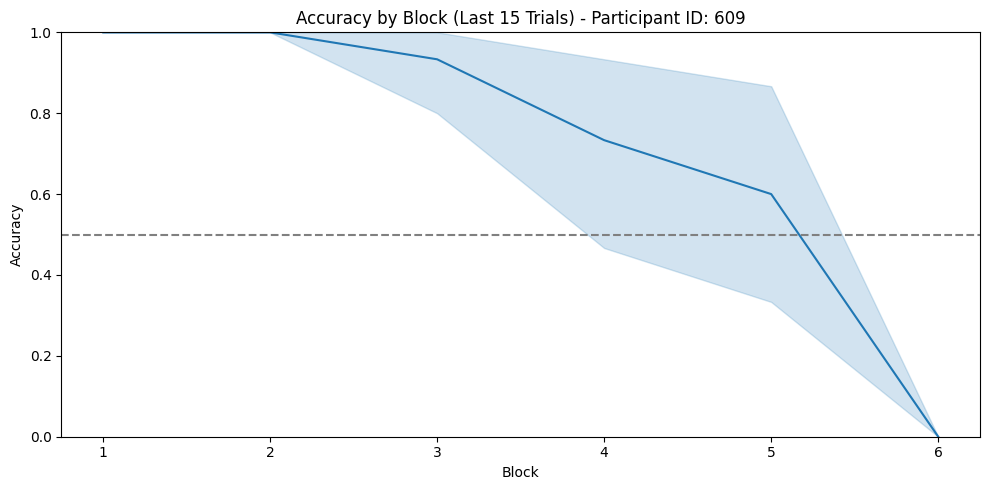

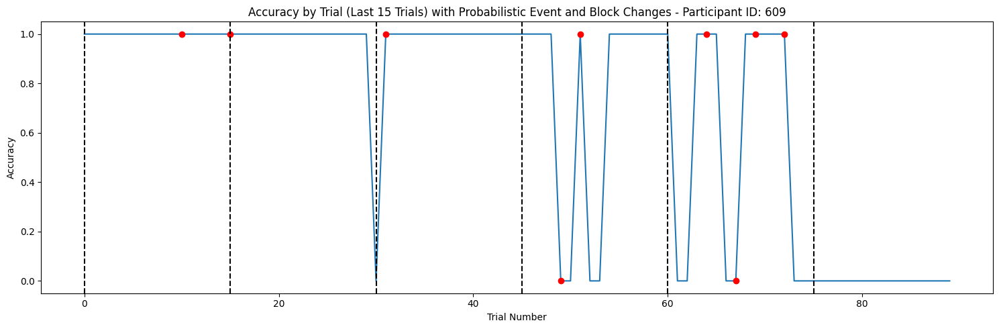

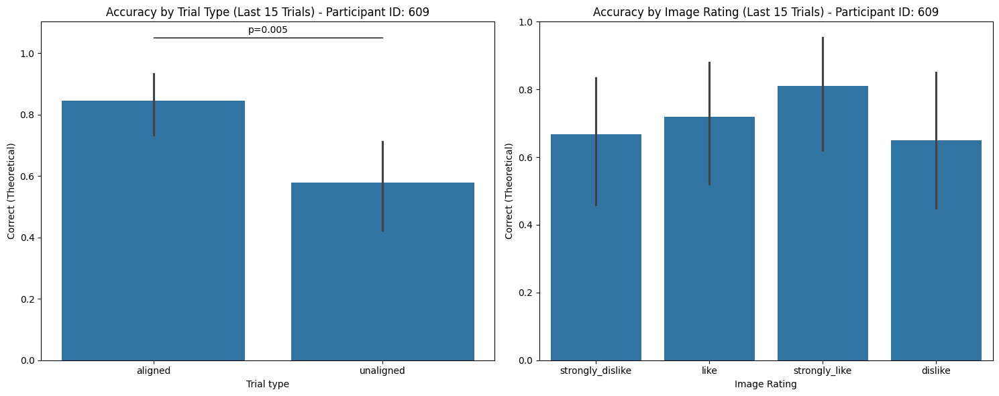

Processing data for participant 626
          Image      Image Rating Expectation   Outcome  Response Time  \
0    granolabar           dislike    negative  negative            576   
1      poptarts  strongly_dislike    positive  positive            444   
2  cherrytomato              like    negative  negative            620   
3    granolabar           dislike    negative  positive            543   
4  cherrytomato              like    positive  negative            616   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2325.0       633     True                  False                 True   
1    2361.0       533     True                   True                False   
2    2445.0       511     True                   True                False   
3    2594.5       883    False                  False                False   
4    2282.0       751    False                  False                False   

  Trial type  
0  unaligned  
1  unaligned  
2  un

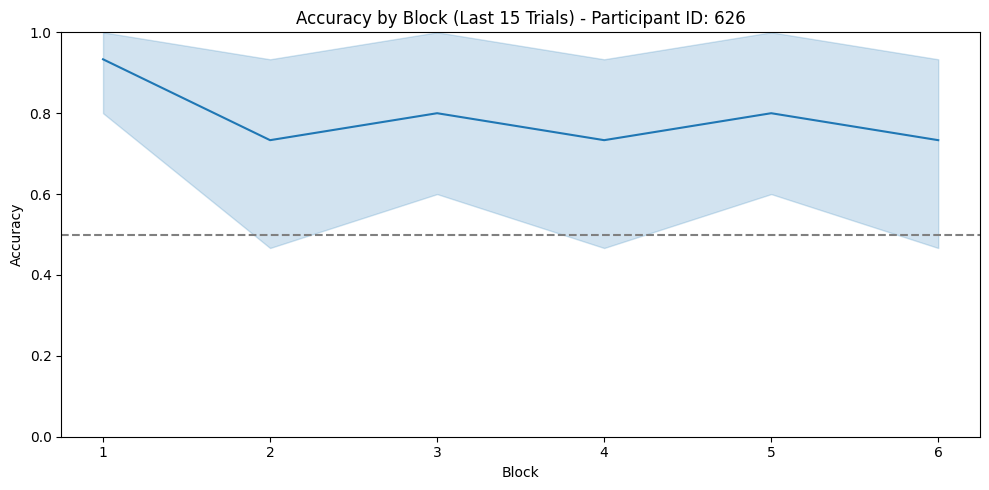

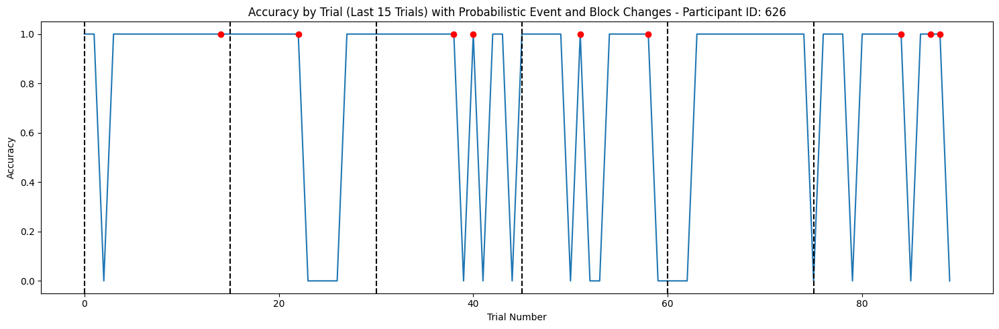

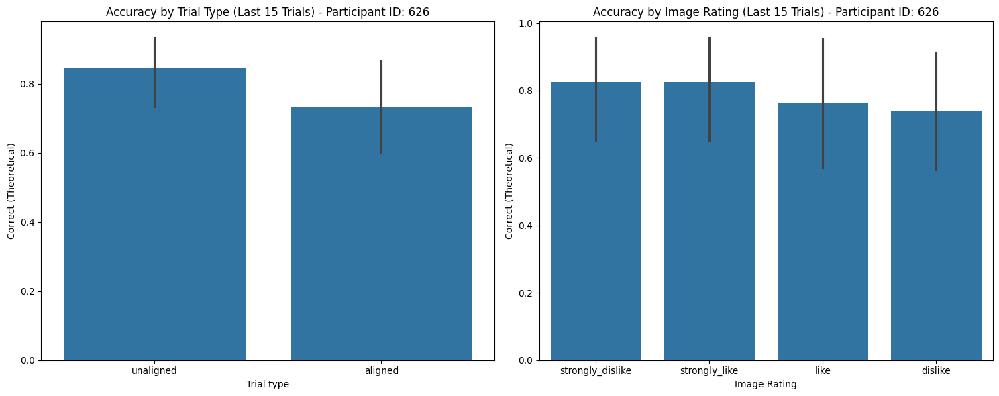

Processing data for participant 616
          Image      Image Rating Expectation   Outcome  Response Time  \
0  orangeslices           dislike    positive  positive            584   
1    cantaloupe              like    positive  negative            497   
2        olives  strongly_dislike    negative  positive            561   
3  orangeslices           dislike    positive  positive            384   
4    cantaloupe              like    negative  negative            501   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2226.0       767     True                   True                False   
1    2280.5       507    False                  False                False   
2    2356.5       680    False                  False                False   
3    2795.0       615     True                   True                False   
4    2445.5       564     True                   True                False   

  Trial type  
0  unaligned  
1  unaligned  
2  un

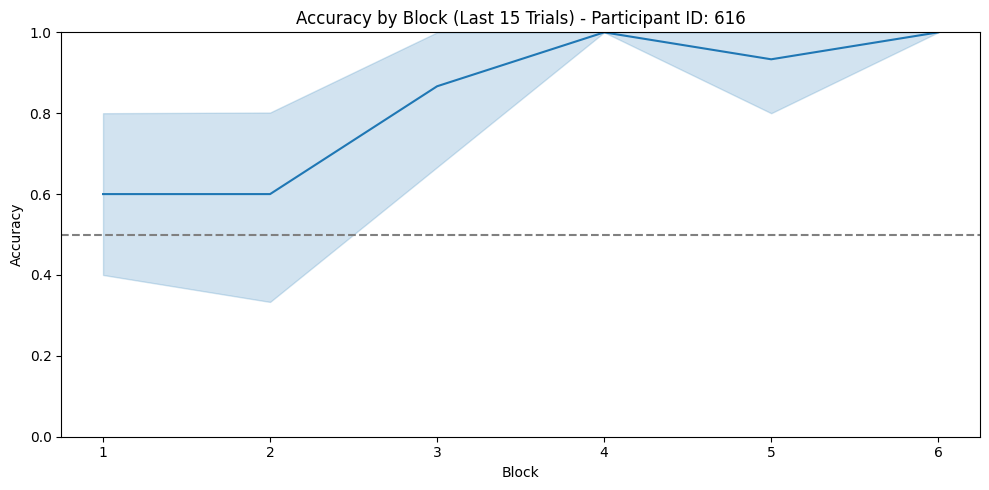

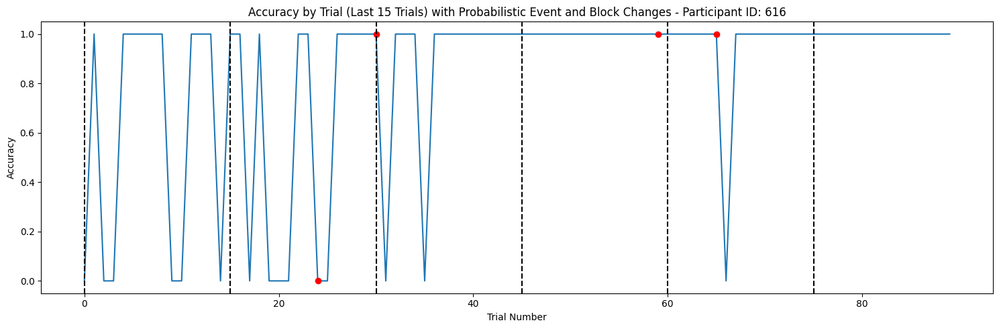

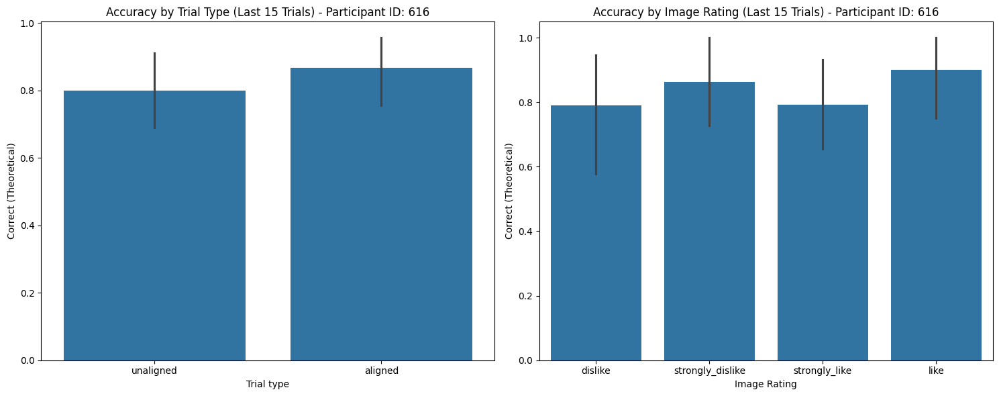

Processing data for participant 617
       Image      Image Rating Expectation   Outcome  Response Time  Jitter 1  \
0    avocado           dislike    positive  positive          638.0    2468.0   
1  mushrooms              like    positive  negative          606.0    2291.0   
2      oreos     strongly_like    negative  negative          824.0    2149.0   
3   cheezits  strongly_dislike    negative  positive          446.0    2715.0   
4  mushrooms              like    positive  negative          626.0    2645.0   

   Jitter 2  Correct  Correct (Theoretical)  Probabilistic event Trial type  
0       631     True                   True                False  unaligned  
1       583    False                  False                False  unaligned  
2       886     True                   True                False  unaligned  
3       826    False                  False                False  unaligned  
4       886    False                  False                False  unaligned  
Participa

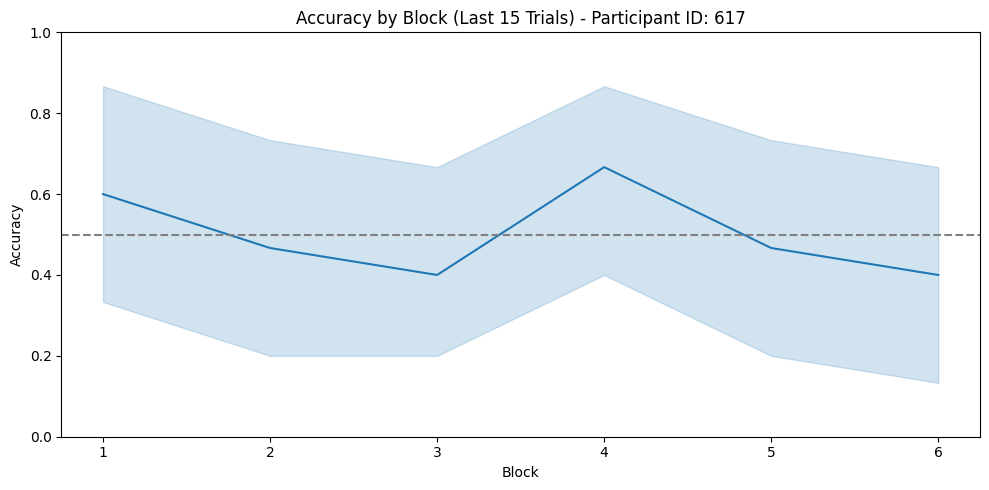

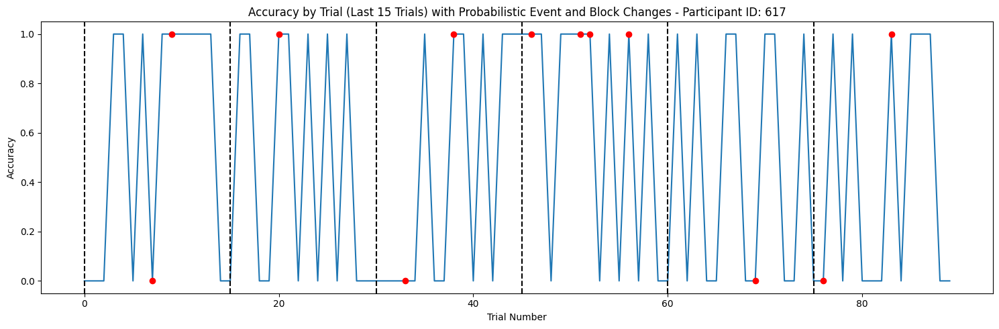

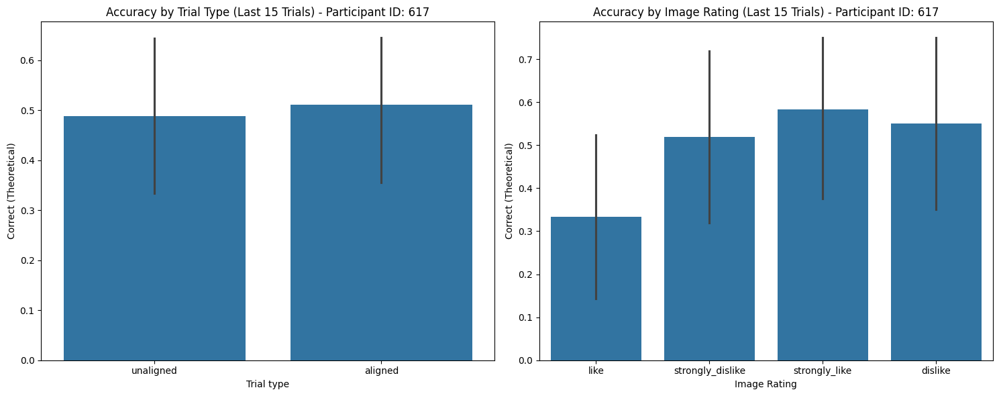

Processing data for participant 618
       Image      Image Rating Expectation   Outcome  Response Time  Jitter 1  \
0     olives  strongly_dislike    positive  positive            675    2399.5   
1    cookies     strongly_like    negative  negative            910    2537.0   
2  ricecakes           dislike    positive  positive            393    2775.5   
3     olives  strongly_dislike    positive  positive            405    2630.5   
4   sunchips              like    negative  negative            561    2393.5   

   Jitter 2  Correct  Correct (Theoretical)  Probabilistic event Trial type  
0       936     True                   True                False  unaligned  
1       796     True                   True                False  unaligned  
2       718     True                   True                False  unaligned  
3       607     True                   True                False  unaligned  
4       780     True                   True                False  unaligned  
Participa

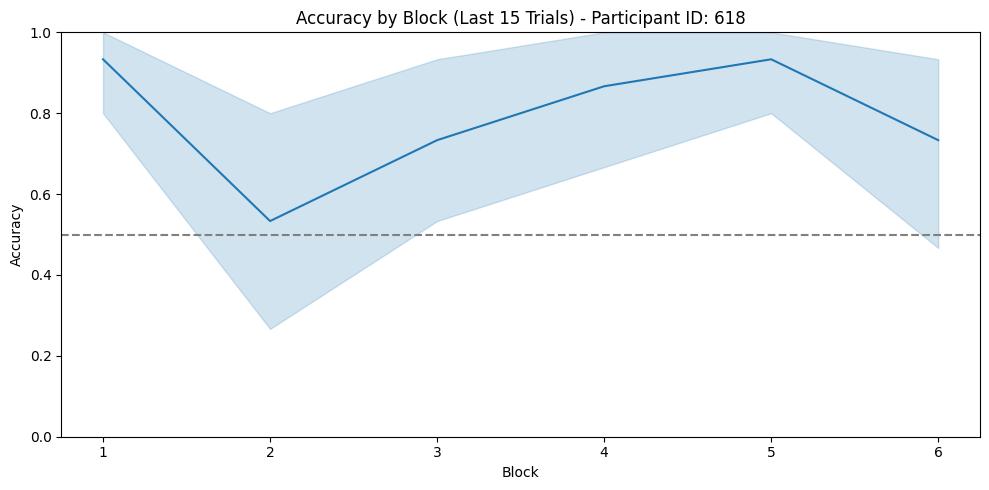

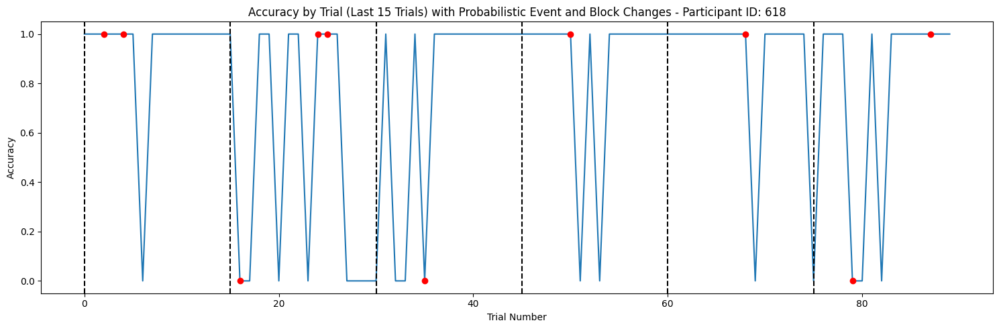

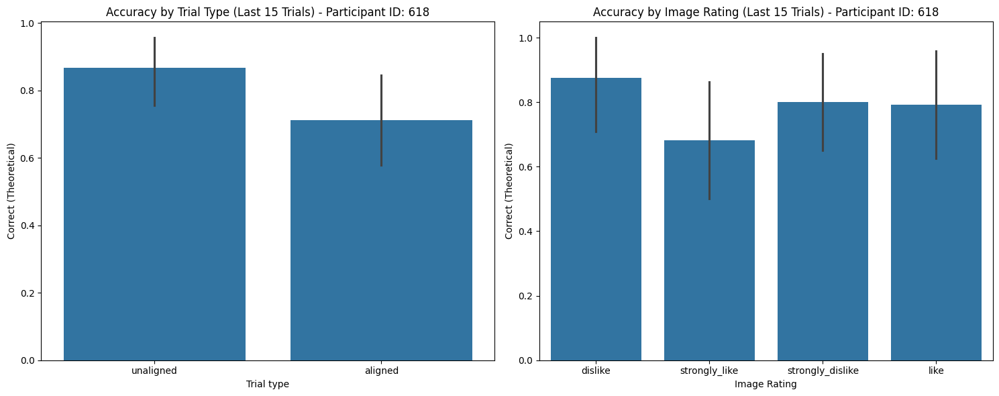

Processing data for participant 619
            Image   Image Rating Expectation   Outcome  Response Time  \
0  yogurtpretzels        dislike    negative  positive           37.0   
1    cherrytomato  strongly_like    positive  negative          982.0   
2          salami           like    positive  negative          225.0   
3  yogurtpretzels        dislike    positive  positive          682.0   
4    cherrytomato  strongly_like    negative  negative          547.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2721.5       657    False                  False                False   
1    2218.0       609    False                  False                False   
2    2768.5       937    False                  False                False   
3    2567.0       690     True                   True                False   
4    2297.5       748     True                   True                False   

  Trial type  
0  unaligned  
1  unaligned  
2  unaligne

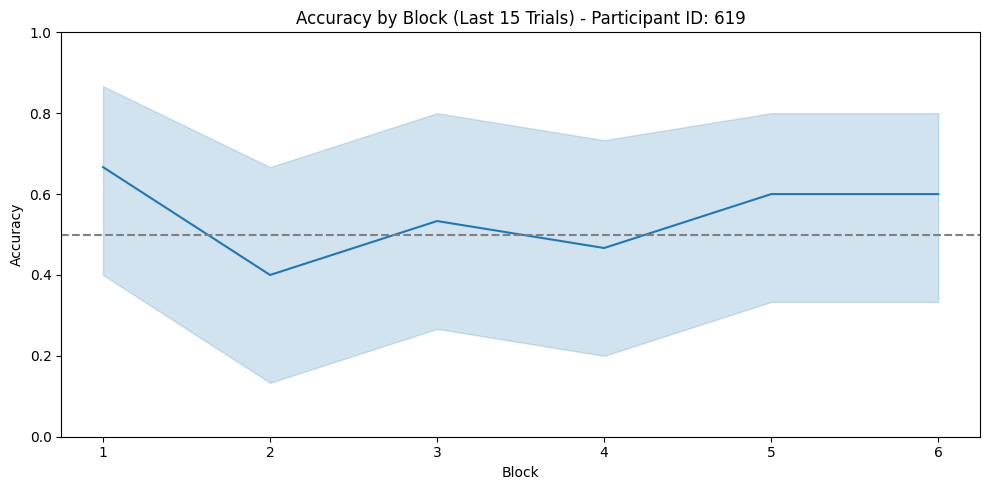

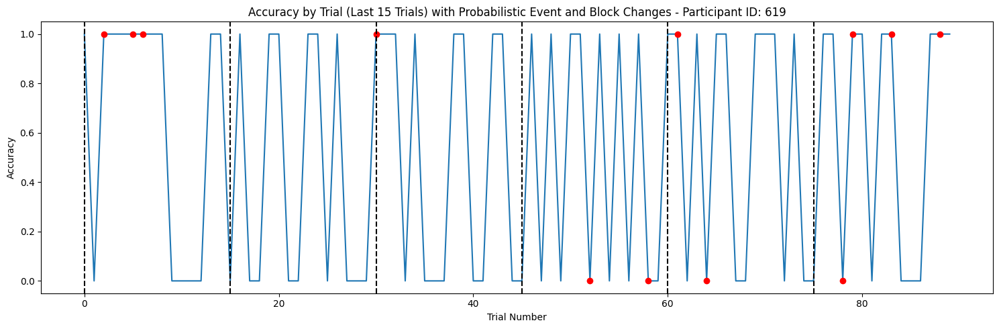

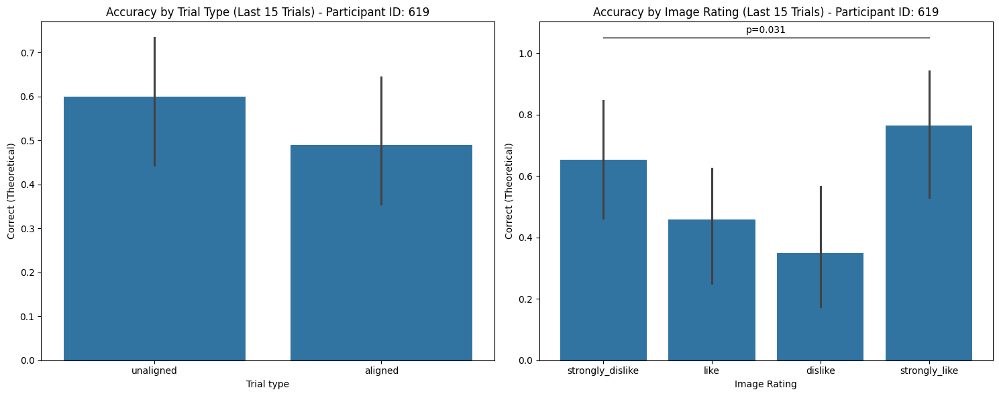

Processing data for participant 625
         Image      Image Rating Expectation   Outcome  Response Time  \
0       olives           dislike    positive  positive           2120   
1          lox              like    positive  negative            674   
2  swedishfish     strongly_like    positive  negative            304   
3       olives           dislike    negative  negative            347   
4  blueberries  strongly_dislike    positive  positive           1406   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    1920.0       643     True                   True                False   
1    2188.0       553    False                  False                False   
2    2355.0       603    False                  False                False   
3    2770.5       629     True                  False                 True   
4    2128.0       745     True                   True                False   

  Trial type  
0  unaligned  
1  unaligned  
2  unaligne

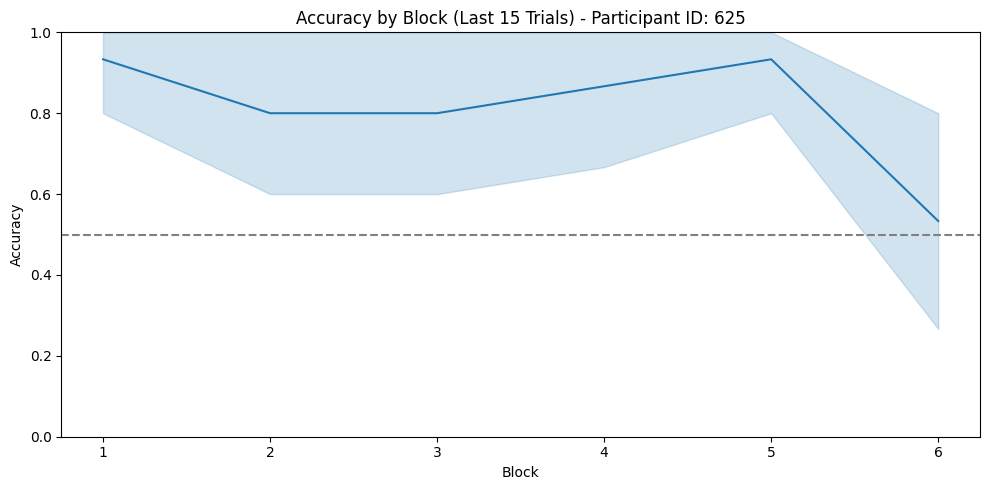

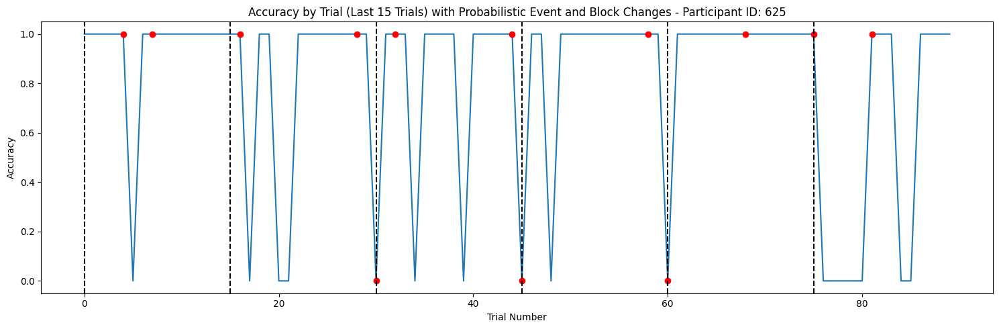

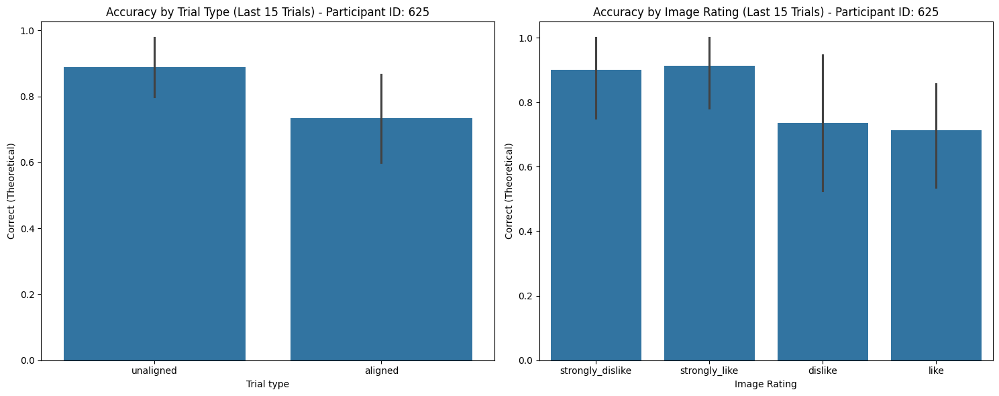

Processing data for participant 627
            Image      Image Rating Expectation   Outcome  Response Time  \
0  cocktailshrimp  strongly_dislike    positive  positive          626.0   
1      cantaloupe           dislike    positive  negative          467.0   
2  cocktailshrimp  strongly_dislike    negative  positive          975.0   
3       croissant              like    positive  negative          589.0   
4      cantaloupe           dislike    positive  positive         1359.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    2208.0       962     True                   True                False   
1    2655.5       819    False                   True                 True   
2    2063.5       698    False                  False                False   
3    2632.5       818    False                  False                False   
4    2195.5       511     True                   True                False   

  Trial type  
0  unaligned  
1  unali

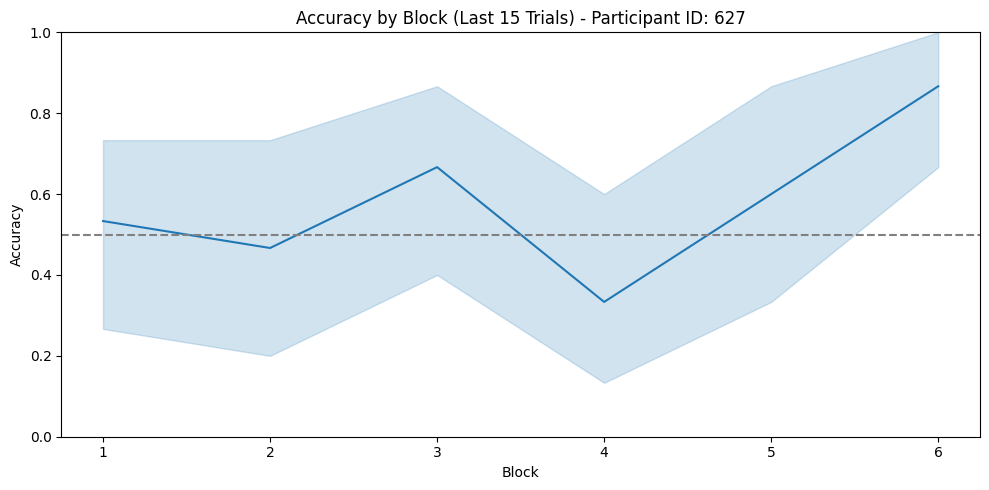

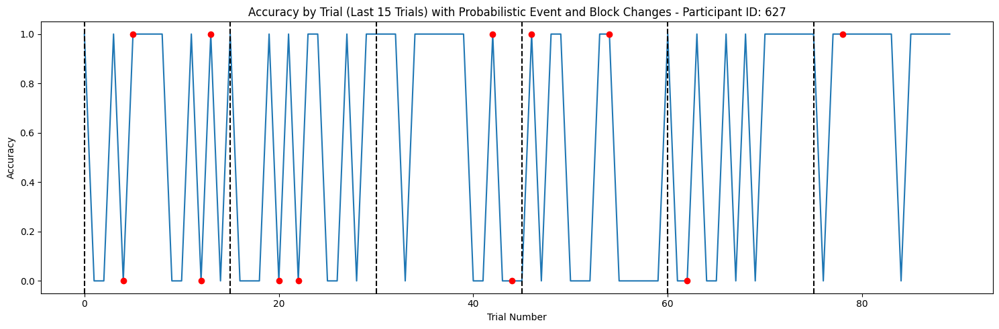

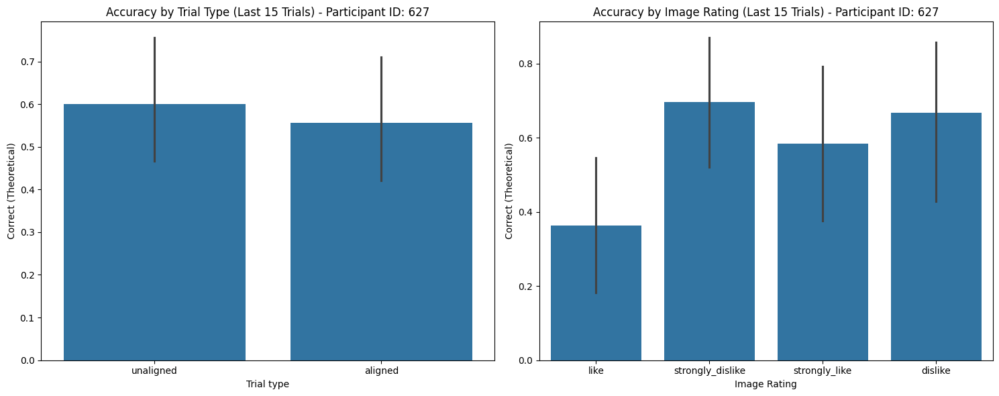

Processing data for participant 628
      Image      Image Rating Expectation   Outcome  Response Time  Jitter 1  \
0   avocado           dislike    negative  positive         3419.0    1016.5   
1    banana  strongly_dislike    positive  positive         3400.0     804.0   
2    kitkat     strongly_like    positive  negative          820.0    2555.0   
3    banana  strongly_dislike    negative  positive          833.0    2243.5   
4  saltines              like    positive  negative         1234.0    2304.0   

   Jitter 2  Correct  Correct (Theoretical)  Probabilistic event Trial type  
0       880    False                  False                False  unaligned  
1       920     True                   True                False  unaligned  
2       526    False                  False                False  unaligned  
3       794    False                  False                False  unaligned  
4       954    False                  False                False  unaligned  
Participant ID:

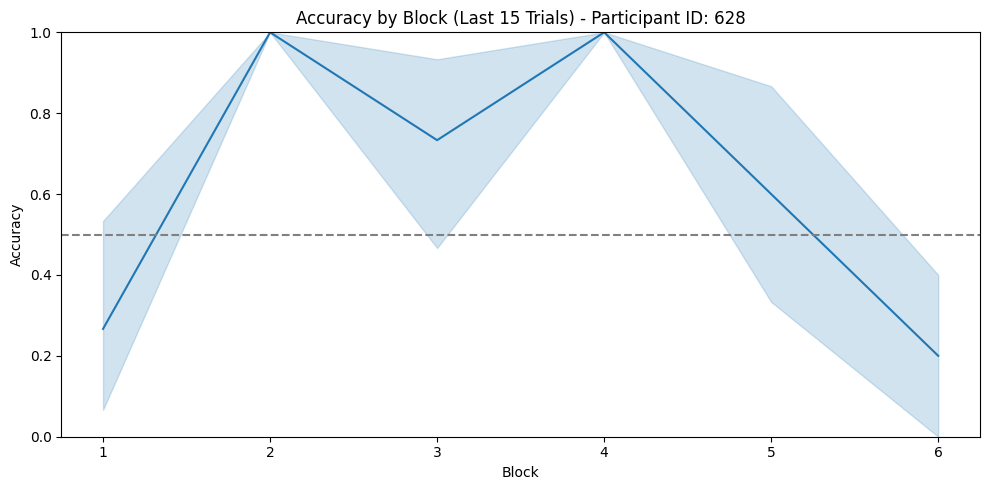

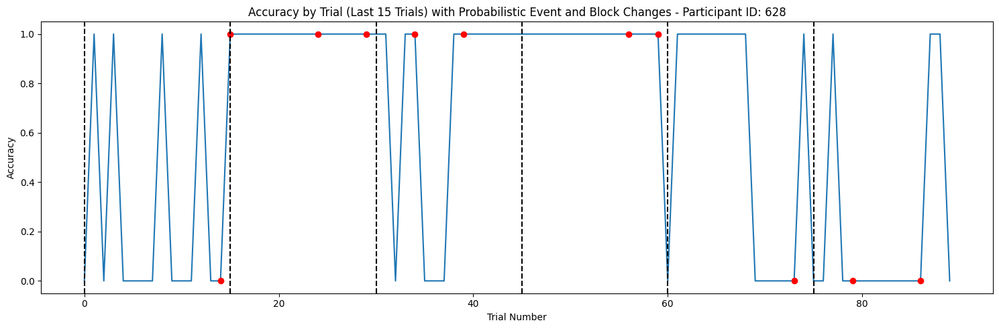

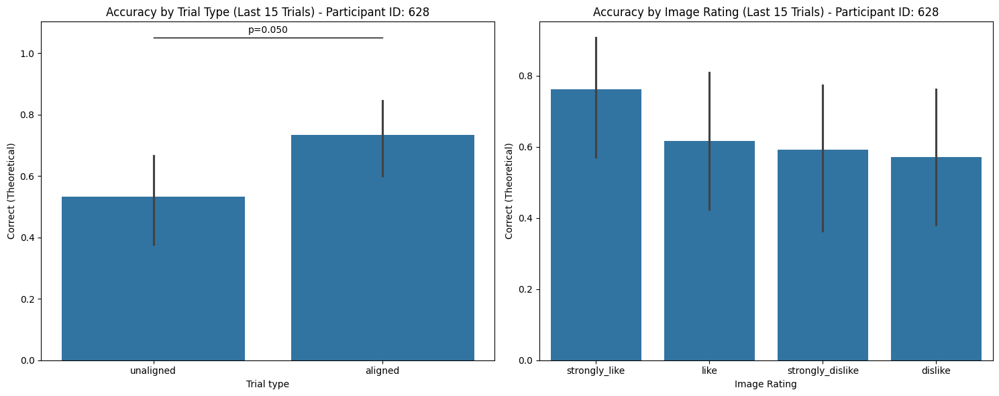

Processing data for participant 634
            Image      Image Rating Expectation   Outcome  Response Time  \
0       triscuits  strongly_dislike    positive  positive         2497.0   
1         corncob     strongly_like    positive  negative          523.0   
2          kitkat           dislike    negative  positive          834.0   
3  cocktailshrimp              like    negative  positive          605.0   
4       triscuits  strongly_dislike    positive  positive          992.0   

   Jitter 1  Jitter 2  Correct  Correct (Theoretical)  Probabilistic event  \
0    1267.5       587     True                   True                False   
1    2690.5       757    False                  False                False   
2    2150.0       844    False                  False                False   
3    2607.5       664    False                   True                 True   
4    2148.0       974     True                   True                False   

  Trial type  
0  unaligned  
1  unali

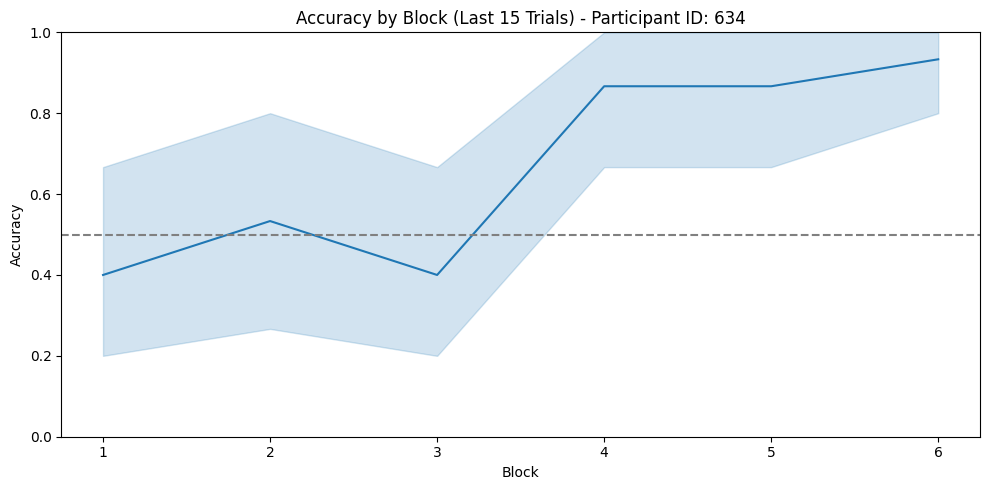

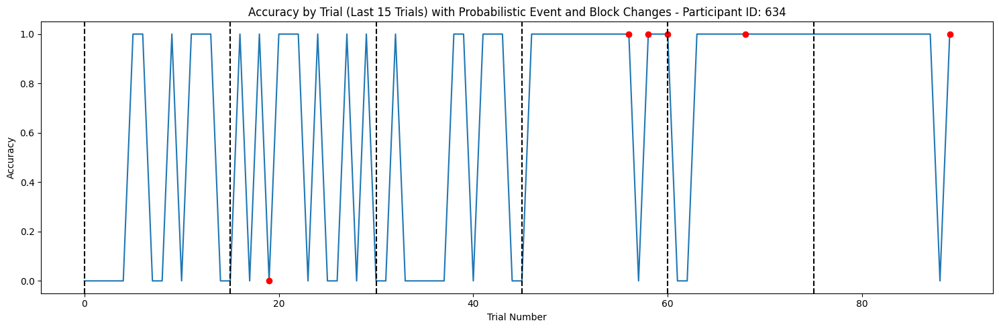

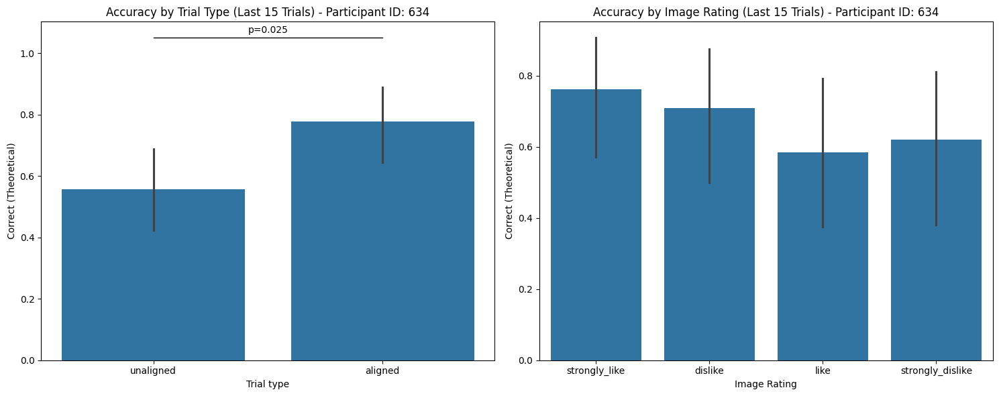

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Process the DataFrame as needed
        print(f'Processing data for participant {participant_id}')
        print(df.head())  # Example of processing - adjust as needed

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Keep only the last 15 trials of each block
        df = df.groupby('Block').tail(15).reset_index(drop=True)

        # Accuracy per 'Trial type' (aligned and unaligned)
        trial_type_accuracy = df.groupby('Trial type')['Correct (Theoretical)'].mean()
        ttest_p_value_tt = ttest_ind(df[df['Trial type'] == 'aligned']['Correct (Theoretical)'],
                                    df[df['Trial type'] == 'unaligned']['Correct (Theoretical)'], nan_policy='omit').pvalue

        # Accuracy over the whole task
        df['Block Change'] = df['Block'].ne(df['Block'].shift())
        df['All Trials'] = 'All Trials'
        overall_accuracy = df.groupby(['All Trials', 'Block'])['Correct (Theoretical)'].mean()

        # Accuracy as a function of 'Image Rating'
        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Create a contingency table
        contingency_table = pd.crosstab(df['Image Rating'], df['Correct (Binary)'])

        # Perform chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Output results
        print(f"Participant ID: {participant_id.split('_')[0]}")
        print("\nAccuracy in each 'Block':")
        print(df.groupby('Block')['Correct (Theoretical)'].mean())
        print("\nAccuracy per 'Trial type' (aligned and unaligned):")
        print(trial_type_accuracy)
        print(f"t-test p-value for 'Trial type': {ttest_p_value_tt}")
        print("\nAccuracy over the whole task:")
        print(overall_accuracy)
        print("\nAccuracy as a function of 'Image Rating':")
        print(df.groupby('Image Rating')['Correct (Binary)'].mean())
        print(f"Chi-squared p-value for 'Image Rating': {p:.15f}")
        print("Data for Chi-squared test:")
        print(contingency_table)


        # Visualization

        # Accuracy by Block
        plt.figure(figsize=(10, 5))
        sns.lineplot(x='Block', y='Correct (Theoretical)', data=df)
        plt.ylabel('Accuracy')
        plt.axhline(y=0.5, color='gray', linestyle='--')  # Add a dotted line at y=0.5
        plt.ylim(0, 1)  # Set y-axis limits to 0-1
        plt.title(f"Accuracy by Block (Last 15 Trials) - Participant ID: {participant_id.split('_')[0]}")
        plt.tight_layout()
        plt.show()

        # Accuracy by Trial with Probabilistic Event and Block Changes
        plt.figure(figsize=(15, 5))
        sns.lineplot(x=df.index, y='Correct (Theoretical)', data=df)
        for i, event in enumerate(df['Probabilistic event']):
            if event:
                plt.plot(i, df.loc[i, 'Correct (Theoretical)'], 'ro')
        for i, change in enumerate(df['Block Change']):
            if change:
                plt.axvline(x=i, linestyle='--', color='k')
        plt.title(f"Accuracy by Trial (Last 15 Trials) with Probabilistic Event and Block Changes - Participant ID: {participant_id.split('_')[0]}")
        plt.ylabel('Accuracy')
        plt.xlabel('Trial Number')
        plt.tight_layout()
        plt.show()

        # Accuracy by Trial Type and Image Rating
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))

        # Accuracy by Trial Type
        sns.barplot(x='Trial type', y='Correct (Theoretical)', data=df, ax=axs[0])
        axs[0].set_title(f"Accuracy by Trial Type (Last 15 Trials) - Participant ID: {participant_id.split('_')[0]}")
        if ttest_p_value_tt < 0.05:
            height = max(df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
            axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
            axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt:.3f}', ha='center', va='bottom')

        # Accuracy by Image Rating
        sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=df, ax=axs[1])
        axs[1].set_title(f"Accuracy by Image Rating (Last 15 Trials) - Participant ID: {participant_id.split('_')[0]}")
        if p < 0.05:
            height = max(df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
            axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
            axs[1].text(1.5, height + 0.01, f'p={p:.3f}', ha='center', va='bottom')

        plt.tight_layout()
        plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 1200x800 with 0 Axes>

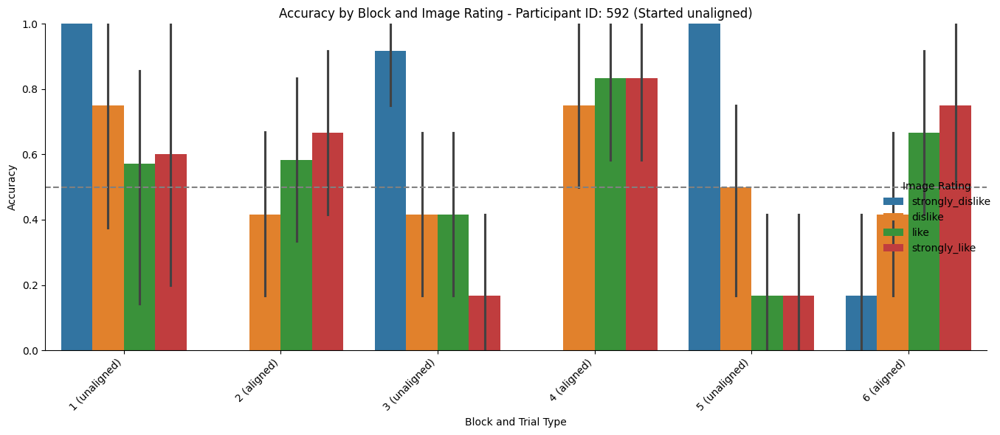

<Figure size 1200x800 with 0 Axes>

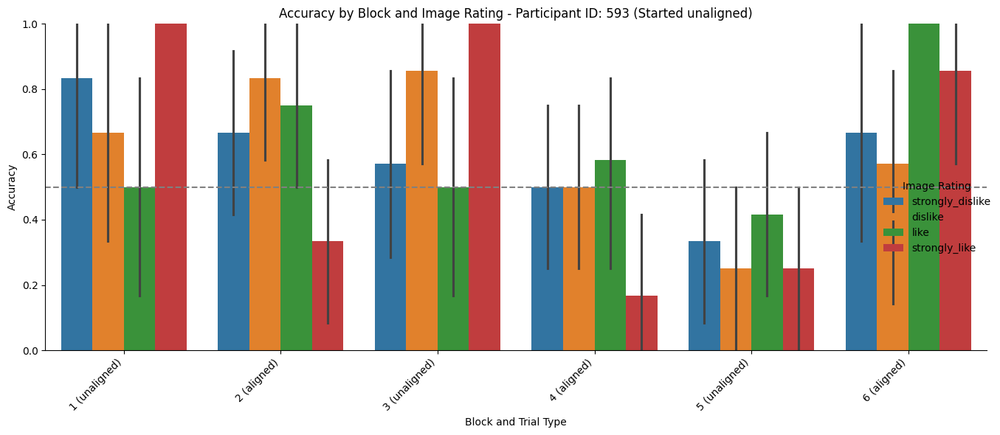

<Figure size 1200x800 with 0 Axes>

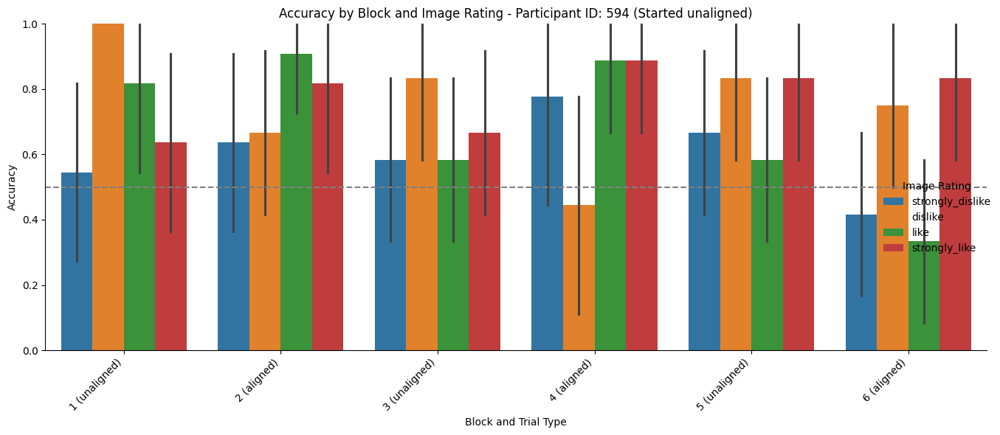

<Figure size 1200x800 with 0 Axes>

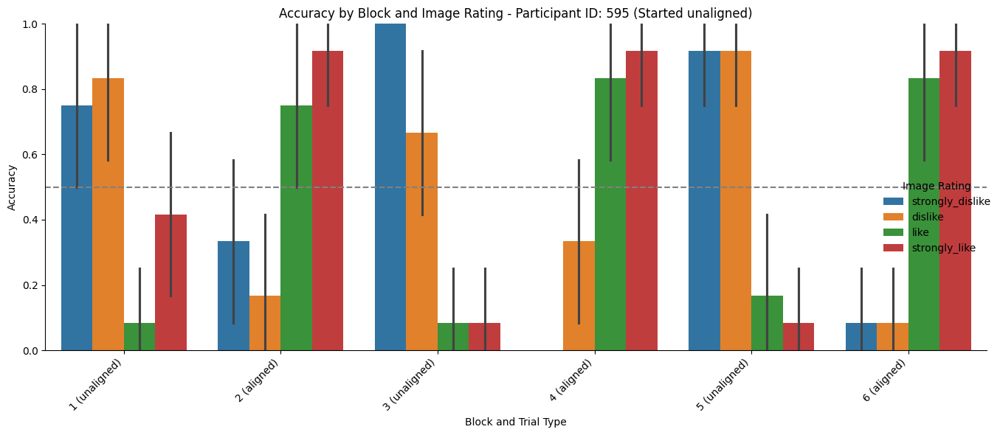

<Figure size 1200x800 with 0 Axes>

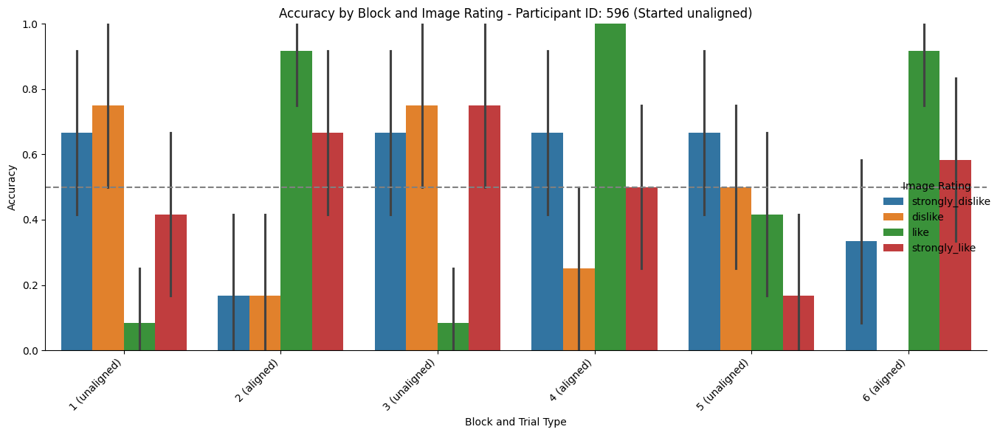

<Figure size 1200x800 with 0 Axes>

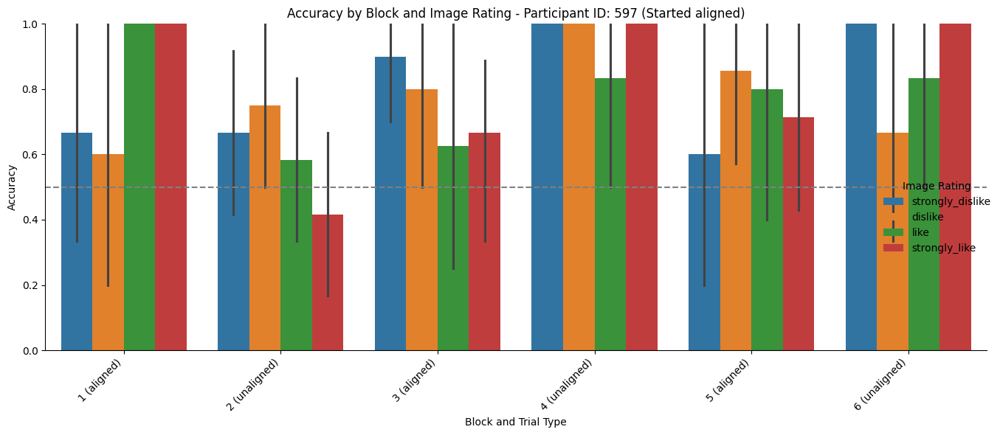

<Figure size 1200x800 with 0 Axes>

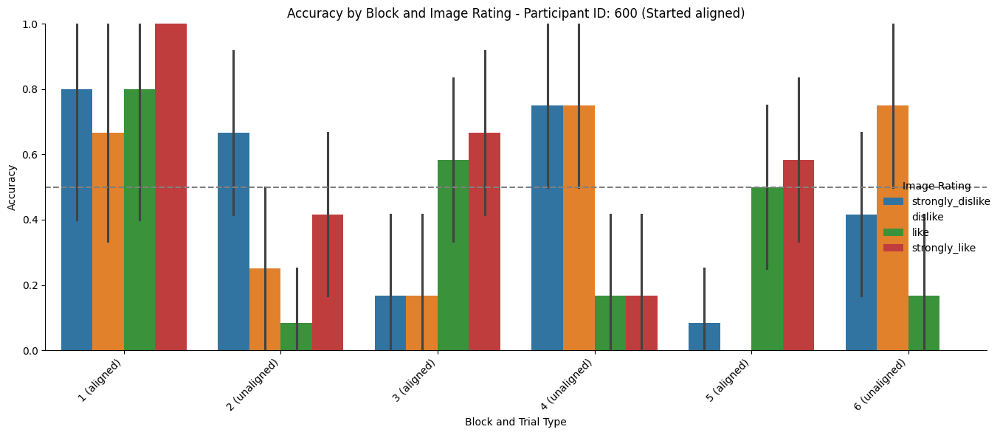

<Figure size 1200x800 with 0 Axes>

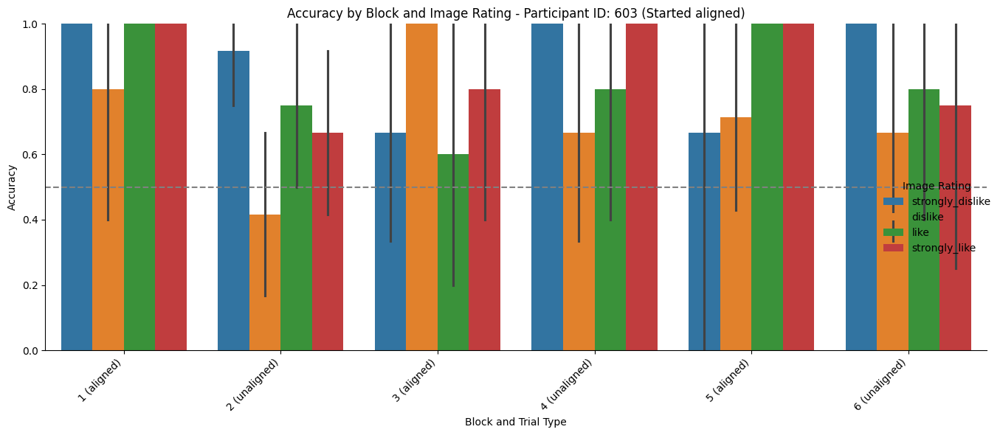

<Figure size 1200x800 with 0 Axes>

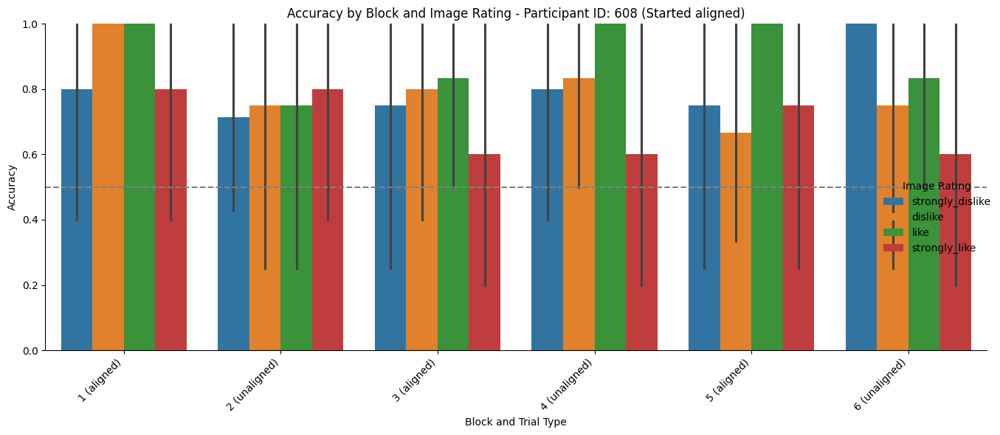

<Figure size 1200x800 with 0 Axes>

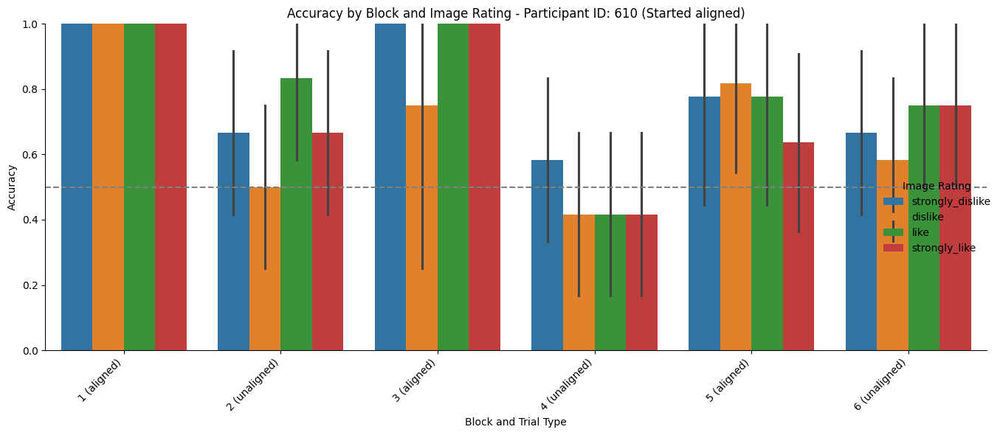

<Figure size 1200x800 with 0 Axes>

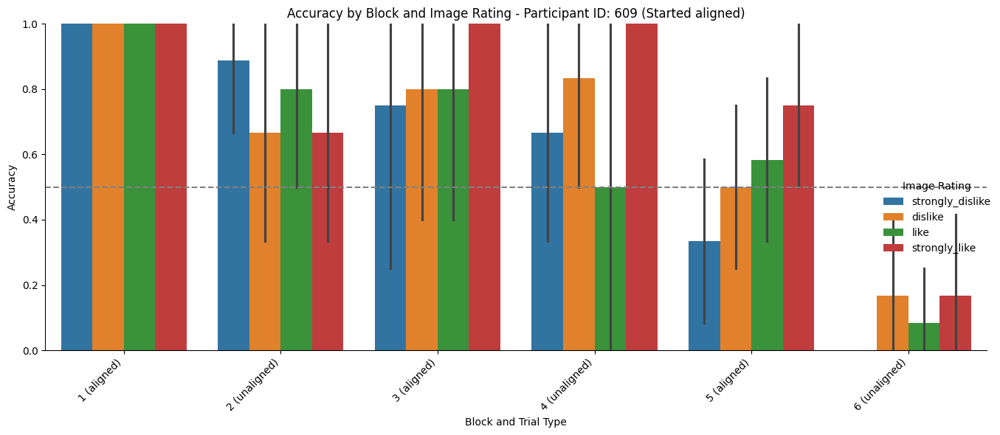

<Figure size 1200x800 with 0 Axes>

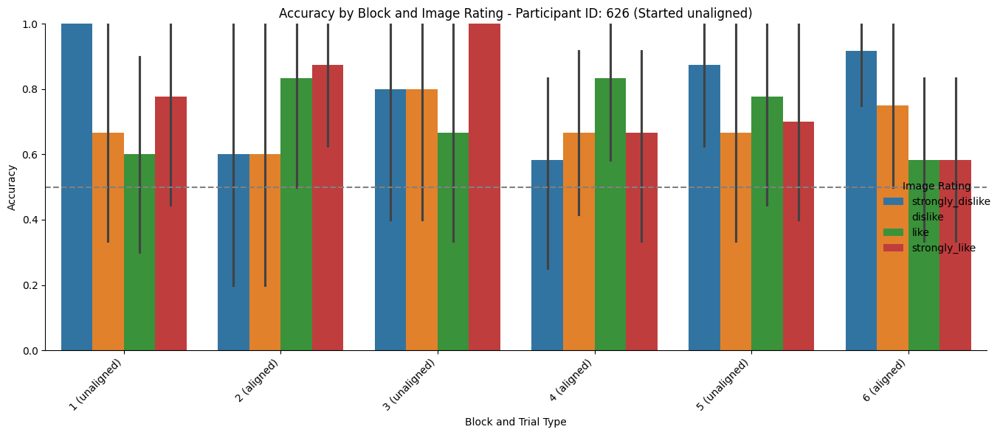

<Figure size 1200x800 with 0 Axes>

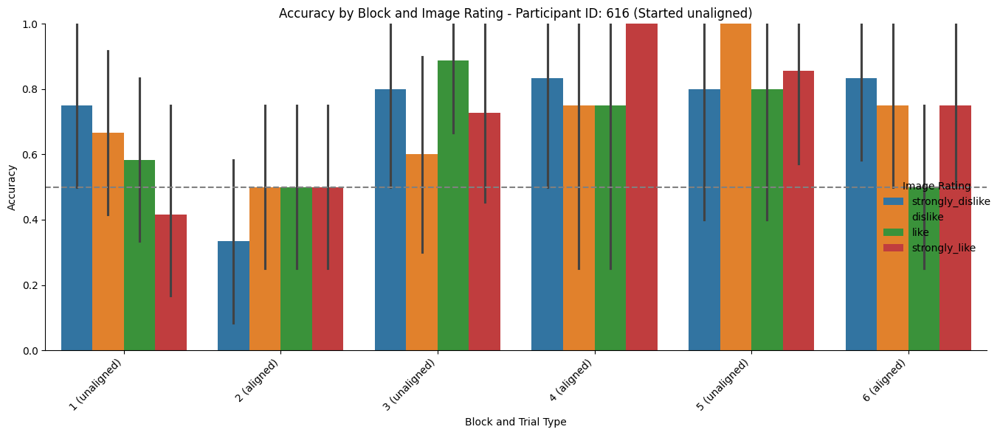

<Figure size 1200x800 with 0 Axes>

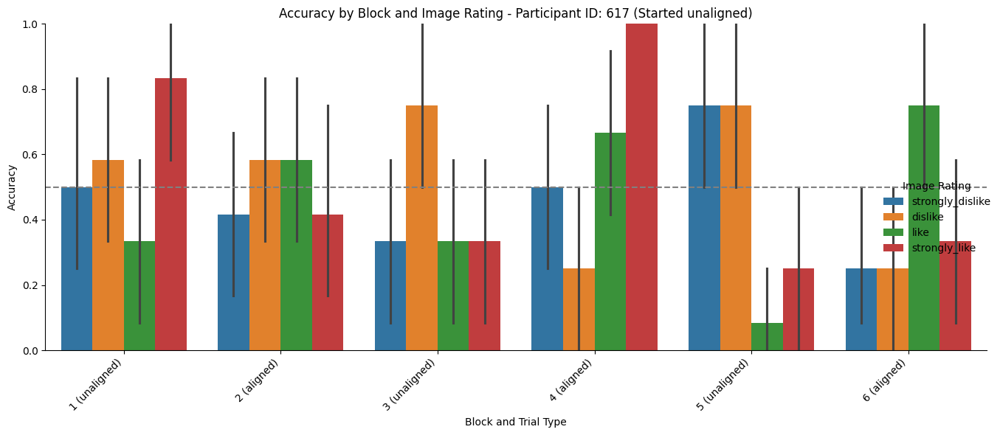

<Figure size 1200x800 with 0 Axes>

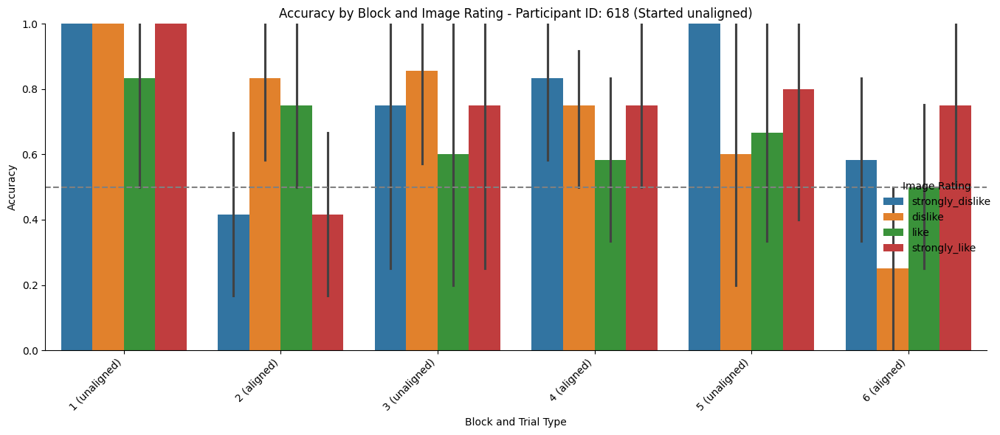

<Figure size 1200x800 with 0 Axes>

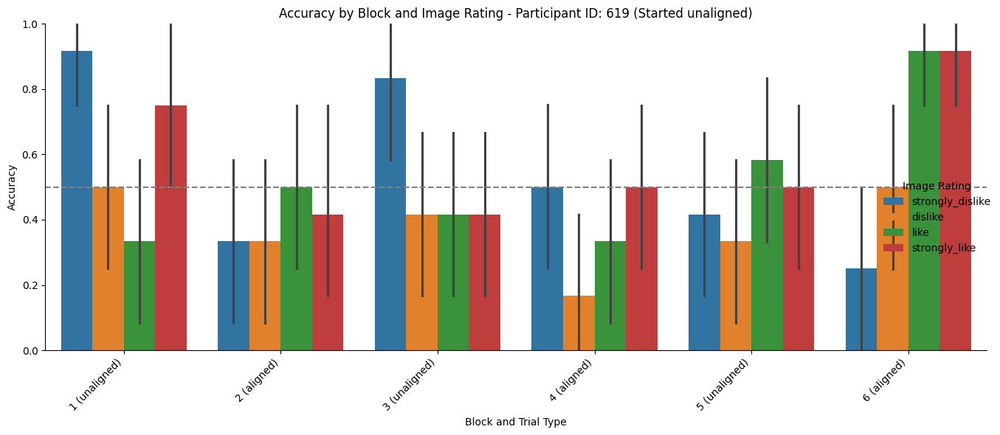

<Figure size 1200x800 with 0 Axes>

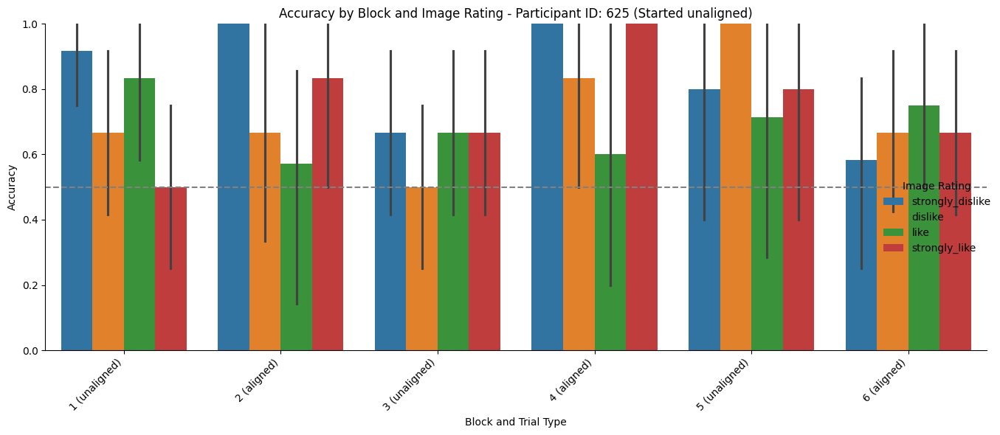

<Figure size 1200x800 with 0 Axes>

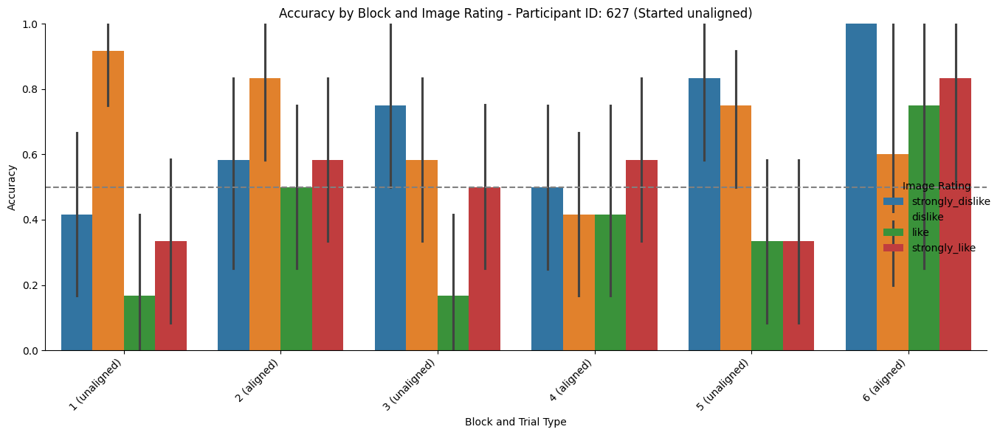

<Figure size 1200x800 with 0 Axes>

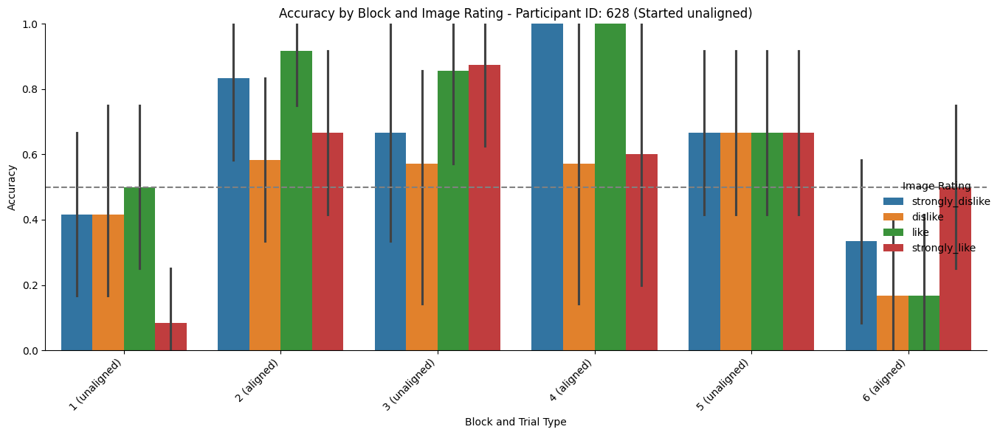

<Figure size 1200x800 with 0 Axes>

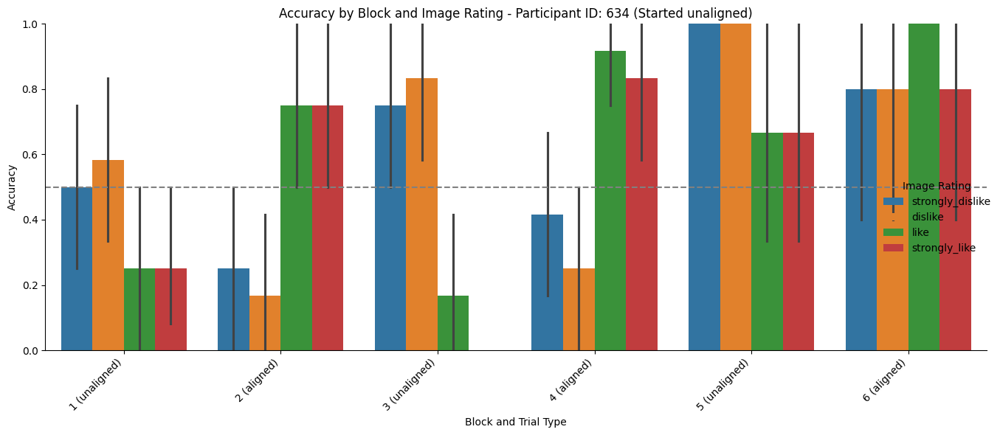

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the image rating order
rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Determine the starting trial type (aligned or unaligned)
        starting_trial_type = df['Trial type'].iloc[0]

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Create a column that combines Block and Trial type
        df['Block_Type'] = df['Block'].astype(str) + ' (' + df['Trial type'] + ')'

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Ensure 'Image Rating' is in the specified order
        df['Image Rating'] = pd.Categorical(df['Image Rating'], categories=rating_order, ordered=True)

        # Plot Accuracy by Block and Image Rating
        plt.figure(figsize=(12, 8))

        sns.catplot(
            data=df,
            x='Block_Type',
            y='Correct (Binary)',
            hue='Image Rating',
            hue_order=rating_order,  # Specify the order of the hue categories
            kind='bar',
            height=6,
            aspect=2,
            legend_out=True
        )

        plt.title(f'Accuracy by Block and Image Rating - Participant ID: {participant_id} (Started {starting_trial_type})')
        plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')  # Add a dotted line at y=0.5
        plt.ylim(0, 1)  # Set y-axis limits to 0-1
        plt.xlabel('Block and Trial Type')
        plt.ylabel('Accuracy')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.tight_layout()
        plt.show()


# Across participants


## Average number of trials per block (separated by U & A starts) and average accuracy time course (separated by U & A start)

<IPython.core.display.Javascript object>

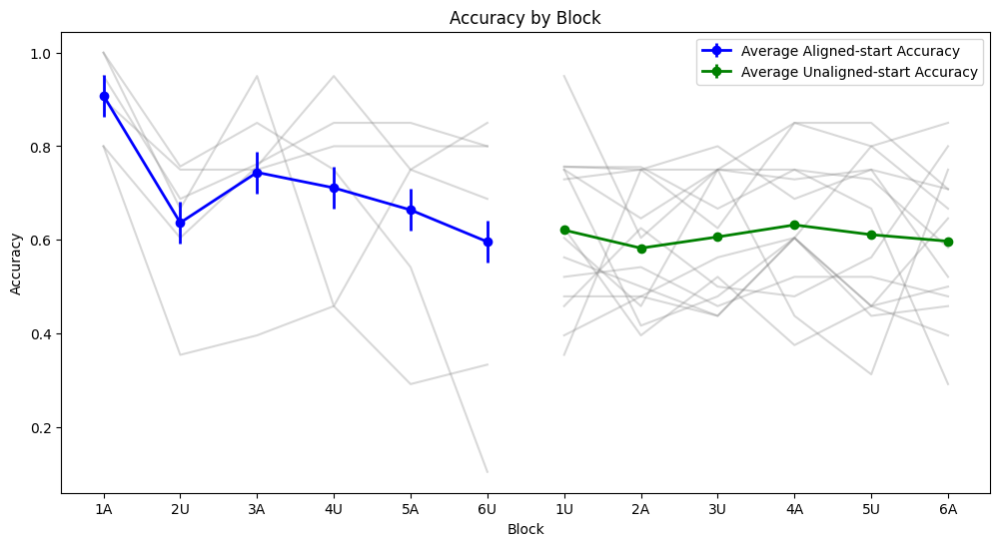

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize empty lists to store aggregated data
all_block_counts = []
all_block_accuracy = []
all_trial_type_accuracy = []
all_ttest_p_values_tt = []
all_overall_accuracy = []
all_image_rating_data = []
all_chi2_p_values = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Define blocks based on switches in 'Trial type'
        df['Block Number'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()
        df['Block'] = df['Block Number'].astype(str) + df['Trial type'].apply(lambda x: 'A' if x == 'aligned' else 'U')

        # Number of trials in each 'Block'
        block_counts = df['Block'].value_counts()

        # Accuracy in each 'Block'
        block_accuracy = df.groupby('Block')['Correct (Theoretical)'].mean()

        # Accuracy per 'Trial type' (aligned and unaligned)
        trial_type_accuracy = df.groupby('Trial type')['Correct (Theoretical)'].mean()
        ttest_p_value_tt = ttest_ind(df[df['Trial type'] == 'aligned']['Correct (Theoretical)'],
                                     df[df['Trial type'] == 'unaligned']['Correct (Theoretical)'], nan_policy='omit').pvalue

        # Accuracy over the whole task
        overall_accuracy = df.groupby('Block')['Correct (Theoretical)'].mean()

        # Accuracy as a function of 'Image Rating'
        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Create a contingency table
        contingency_table = pd.crosstab(df['Image Rating'], df['Correct (Binary)'])

        # Perform chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Append data to lists
        all_block_counts.append(block_counts)
        all_block_accuracy.append(block_accuracy)
        all_trial_type_accuracy.append(trial_type_accuracy)
        all_ttest_p_values_tt.append(ttest_p_value_tt)
        all_overall_accuracy.append(overall_accuracy)
        all_image_rating_data.append(df.groupby('Image Rating')['Correct (Theoretical)'].mean())
        all_chi2_p_values.append(p)

# Plotting across participants

# Accuracy by Block with Error 'Cloud' for Average Accuracy for Aligned and Unaligned Starts
plt.figure(figsize=(12, 6))

# Separate data for 'Aligned' and 'Unaligned' starts
aligned_data = [block_accuracy for block_accuracy in all_block_accuracy if 'A' in block_accuracy.index[0]]
unaligned_data = [block_accuracy for block_accuracy in all_block_accuracy if 'U' in block_accuracy.index[0]]

# Plot individual accuracies (faint grey lines) and average lines with error 'cloud'
for block_accuracy in aligned_data:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_aligned_accuracy = pd.concat(aligned_data, axis=1).mean(axis=1)
plt.errorbar(avg_aligned_accuracy.index, avg_aligned_accuracy, yerr=avg_aligned_accuracy.sem(), fmt='-o', color='blue', lw=2, label='Average Aligned-start Accuracy')

for block_accuracy in unaligned_data:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_unaligned_accuracy = pd.concat(unaligned_data, axis=1).mean(axis=1)
plt.errorbar(avg_unaligned_accuracy.index, avg_unaligned_accuracy, yerr=avg_unaligned_accuracy.sem(), fmt='-o', color='green', lw=2, label='Average Unaligned-start Accuracy')

plt.xlabel('Block')
plt.ylabel('Accuracy')
plt.title('Accuracy by Block')
plt.legend()
plt.show()


<IPython.core.display.Javascript object>

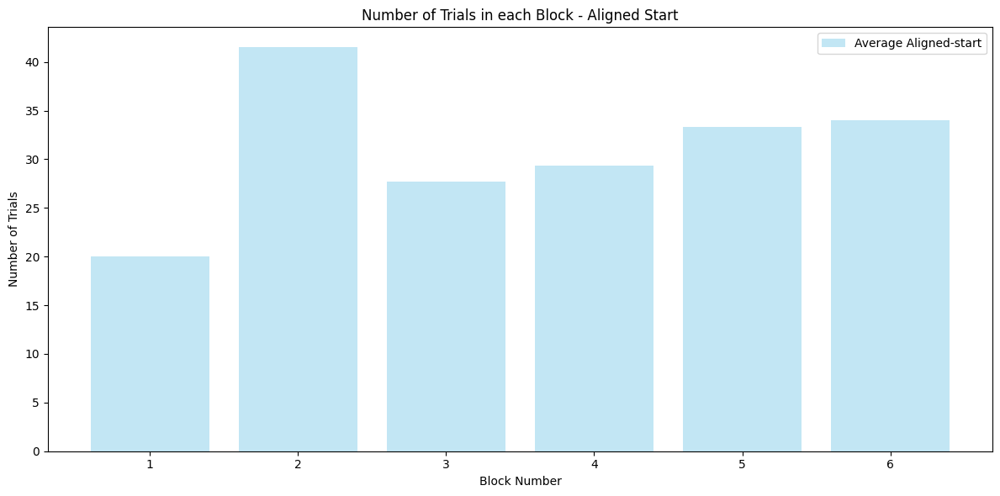

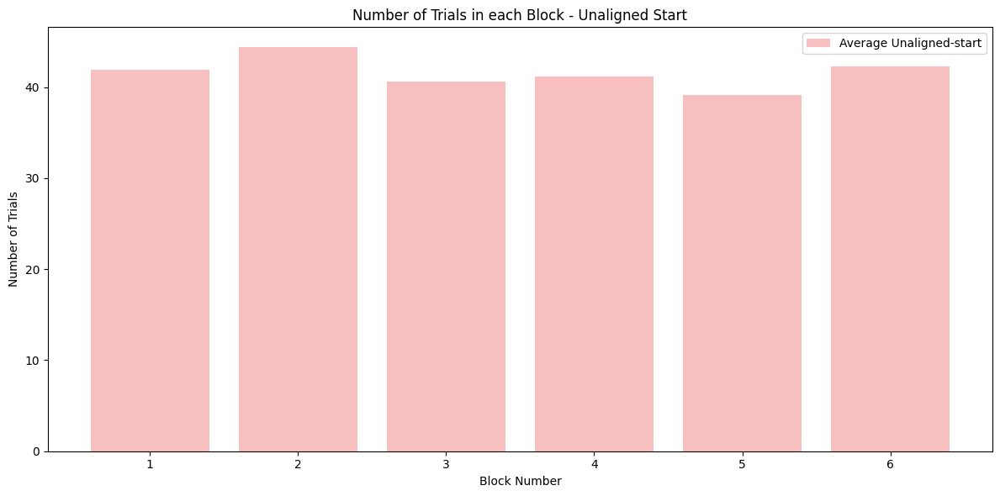

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize empty lists to store aggregated data
aligned_block_counts = []
unaligned_block_counts = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Define blocks based on switches in 'Trial type'
        df['Block Number'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Number of trials in each Block
        block_counts = df['Block Number'].value_counts().sort_index()

        # Separate out aligned and unaligned starts
        if df['Trial type'].iloc[0] == 'aligned':
            aligned_block_counts.append(block_counts)
        else:
            unaligned_block_counts.append(block_counts)

# Calculate the average number of trials in each block across participants for aligned starts
aligned_block_counts_df = pd.concat(aligned_block_counts, axis=1)
avg_aligned_block_counts = aligned_block_counts_df.mean(axis=1)

# Calculate the average number of trials in each block across participants for unaligned starts
unaligned_block_counts_df = pd.concat(unaligned_block_counts, axis=1)
avg_unaligned_block_counts = unaligned_block_counts_df.mean(axis=1)

# Plotting the number of trials in each Block, separated by Unaligned and Aligned starts

# Plot for aligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_aligned_block_counts) + 1), avg_aligned_block_counts, color='skyblue', alpha=0.5, label='Average Aligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_aligned_block_counts) + 1), range(1, len(avg_aligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Aligned Start')
plt.legend()
plt.tight_layout()
plt.show()

# Plot for unaligned starts
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(avg_unaligned_block_counts) + 1), avg_unaligned_block_counts, color='lightcoral', alpha=0.5, label='Average Unaligned-start')

plt.xlabel('Block Number')
plt.ylabel('Number of Trials')
plt.xticks(range(1, len(avg_unaligned_block_counts) + 1), range(1, len(avg_unaligned_block_counts) + 1))
plt.title('Number of Trials in each Block - Unaligned Start')
plt.legend()
plt.tight_layout()
plt.show()


## Average accuracy within a block (by block type)

<IPython.core.display.Javascript object>

Columns in the DataFrame: Index(['Image', 'Image Rating', 'Expectation', 'Outcome', 'Response Time',
       'Jitter 1', 'Jitter 2', 'Correct', 'Correct (Theoretical)',
       'Probabilistic event', 'Trial type', 'Participant ID', 'Block',
       'Trial Number'],
      dtype='object')


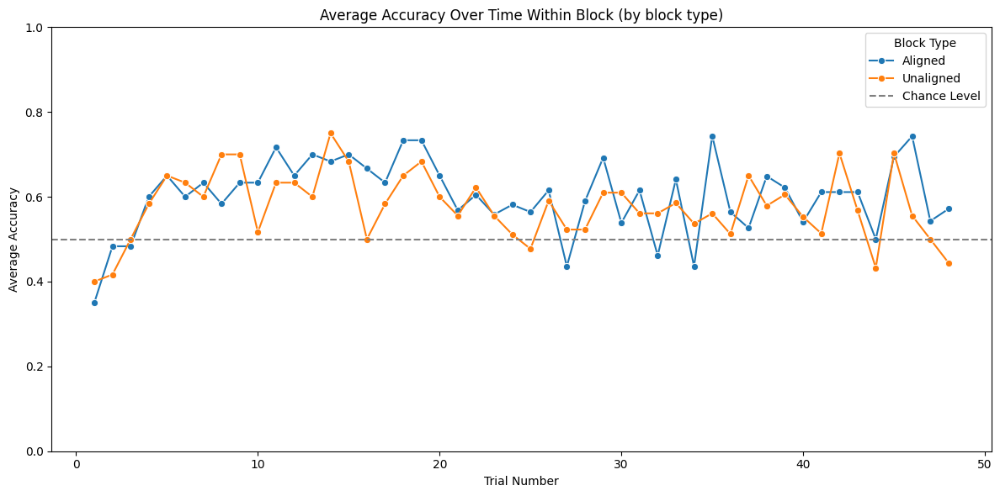

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize an empty list to store DataFrames
all_data = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Add participant ID to DataFrame
        df['Participant ID'] = participant_id

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Add cumulative trial number within each block
        df['Trial Number'] = df.groupby('Block').cumcount() + 1

        # Append the DataFrame to the list
        all_data.append(df)

# Concatenate all DataFrames into a single DataFrame
all_data_df = pd.concat(all_data, ignore_index=True)

# Check columns for sanity
print("Columns in the DataFrame:", all_data_df.columns)

# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
all_data_df['Correct (Binary)'] = all_data_df['Correct (Theoretical)'].astype(int)

# Convert 'Block' to string and create a column to represent the type of block (Aligned/Unaligned)
all_data_df['Block'] = all_data_df['Block'].astype(str)
all_data_df['Block Type'] = all_data_df['Trial type'].apply(lambda x: 'Aligned' if x == 'aligned' else 'Unaligned')

# Calculate overall average accuracy per trial across all participants
overall_avg = all_data_df.groupby(['Block Type', 'Trial Number'])['Correct (Theoretical)'].mean().reset_index()

# Plot overall average accuracy per trial
plt.figure(figsize=(12, 6))
sns.lineplot(x='Trial Number', y='Correct (Theoretical)', hue='Block Type', data=overall_avg, marker='o')
plt.title('Average Accuracy Over Time Within Block (by block type)')
plt.ylim(0, 1)
plt.axhline(0.5, linestyle='--', color='grey', label='Chance Level')
plt.xlabel('Trial Number')
plt.ylabel('Average Accuracy')
plt.legend(title='Block Type')
plt.tight_layout()
plt.show()


## Bar plots: Accuracy by trial type and by stimulus valence
First overall
Second by Unaligned and Aligned start

<IPython.core.display.Javascript object>


Accuracy per 'Trial type' (aligned and unaligned) (average across participants):
Trial type
aligned      0.607033
unaligned    0.581296
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type' (average across participants): 0.07538079026611609

Accuracy as a function of 'Image Rating' (average across participants):
Image Rating
dislike             0.580895
like                0.585578
strongly_dislike    0.608772
strongly_like       0.601041
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating' (average across participants): 0.487234248766356
Data for Chi-squared test (average across participants):
Correct (Binary)    0    1
Image Rating              
dislike           487  675
like              477  674
strongly_dislike  446  694
strongly_like     460  693


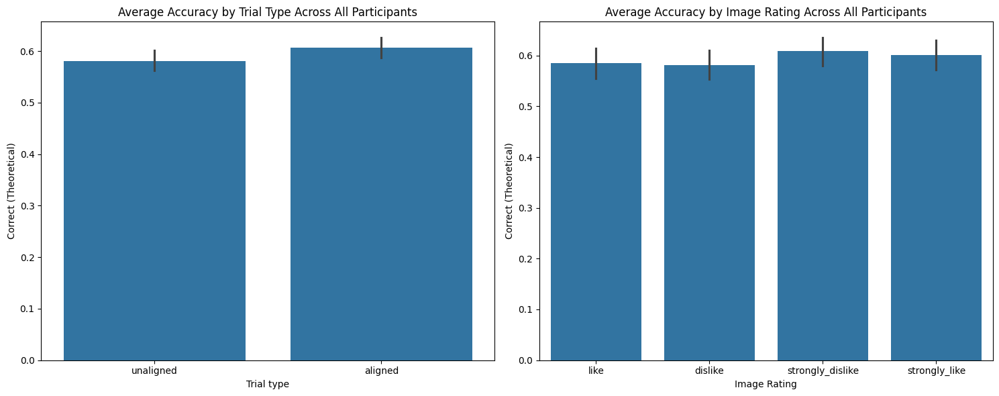

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize lists to store data from each participant
all_data = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Add participant ID to DataFrame
        df['Participant ID'] = participant_id

        # Append the DataFrame to the list
        all_data.append(df)

# Concatenate all DataFrames into a single DataFrame
all_data_df = pd.concat(all_data, ignore_index=True)

# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
all_data_df['Correct (Binary)'] = all_data_df['Correct (Theoretical)'].astype(int)


# Accuracy per 'Trial type' (aligned and unaligned)
trial_type_accuracy_all = all_data_df.groupby('Trial type')['Correct (Theoretical)'].mean()
ttest_p_value_tt_all = ttest_ind(
    all_data_df[all_data_df['Trial type'] == 'aligned']['Correct (Theoretical)'],
    all_data_df[all_data_df['Trial type'] == 'unaligned']['Correct (Theoretical)'],
    nan_policy='omit'
).pvalue


# Accuracy as a function of 'Image Rating'
# Create a contingency table
contingency_table_all = pd.crosstab(all_data_df['Image Rating'], all_data_df['Correct (Binary)'])

# Perform chi-squared test
chi2_all, p_all, _, _ = chi2_contingency(contingency_table_all)

# Output results

print("\nAccuracy per 'Trial type' (aligned and unaligned) (average across participants):")
print(trial_type_accuracy_all)
print(f"t-test p-value for 'Trial type' (average across participants): {ttest_p_value_tt_all}")

print("\nAccuracy as a function of 'Image Rating' (average across participants):")
print(all_data_df.groupby('Image Rating')['Correct (Binary)'].mean())
print(f"Chi-squared p-value for 'Image Rating' (average across participants): {p_all:.15f}")
print("Data for Chi-squared test (average across participants):")
print(contingency_table_all)

# Visualization

# Accuracy by Trial Type and Image Rating
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Accuracy by Trial Type
sns.barplot(x='Trial type', y='Correct (Theoretical)', data=all_data_df, ax=axs[0])
axs[0].set_title('Average Accuracy by Trial Type Across All Participants')
if ttest_p_value_tt_all < 0.05:
    height = max(all_data_df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
    axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
    axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt_all:.3f}', ha='center', va='bottom')

# Accuracy by Image Rating
sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=all_data_df, ax=axs[1])
axs[1].set_title('Average Accuracy by Image Rating Across All Participants')
if p_all < 0.05:
    height = max(all_data_df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
    axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
    axs[1].text(1.5, height + 0.01, f'p={p_all:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


Accuracy per 'Trial type' (aligned and unaligned) (average across participants) - Aligned Start:
Trial type
aligned      0.707819
unaligned    0.585056
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type' (average across participants) - Aligned Start: 2.200561563646041e-05

Accuracy as a function of 'Image Rating' (average across participants) - Aligned Start:
Image Rating
dislike             0.614583
like                0.642599
strongly_dislike    0.658182
strongly_like       0.640000
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating' (average across participants) - Aligned Start: 0.753446072314888
Data for Chi-squared test (average across participants) - Aligned Start:
Correct (Binary)    0    1
Image Rating              
dislike           111  177
like               99  178
strongly_dislike   94  181
strongly_like      99  176


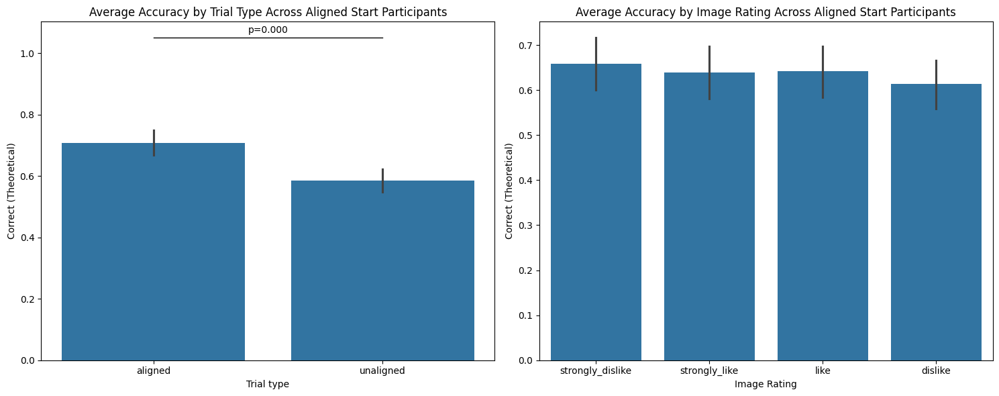


Accuracy per 'Trial type' (aligned and unaligned) (average across participants) - Unaligned Start:
Trial type
aligned      0.579653
unaligned    0.579906
Name: Correct (Theoretical), dtype: float64
t-test p-value for 'Trial type' (average across participants) - Unaligned Start: 0.9879478646860878

Accuracy as a function of 'Image Rating' (average across participants) - Unaligned Start:
Image Rating
dislike             0.569794
like                0.567506
strongly_dislike    0.593064
strongly_like       0.588838
Name: Correct (Binary), dtype: float64
Chi-squared p-value for 'Image Rating' (average across participants) - Unaligned Start: 0.610515222203603
Data for Chi-squared test (average across participants) - Unaligned Start:
Correct (Binary)    0    1
Image Rating              
dislike           376  498
like              378  496
strongly_dislike  352  513
strongly_like     361  517


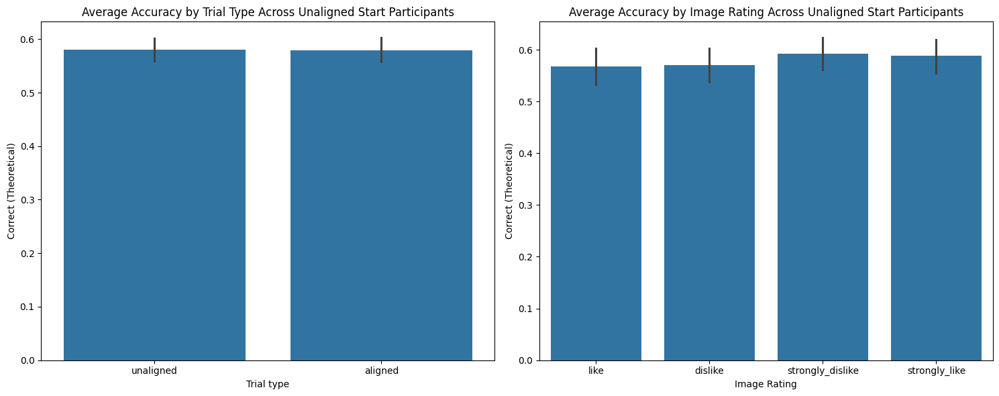

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize lists to store data from each participant
all_data = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Add participant ID to DataFrame
        df['Participant ID'] = participant_id

        # Append the DataFrame to the list
        all_data.append(df)

# Concatenate all DataFrames into a single DataFrame
all_data_df = pd.concat(all_data, ignore_index=True)

# Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
all_data_df['Correct (Binary)'] = all_data_df['Correct (Theoretical)'].astype(int)

# Separate data based on the starting block type
aligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'aligned')
unaligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'unaligned')

# Function to perform analysis and plotting
def analyze_and_plot(data_df, title_suffix):
    # Accuracy per 'Trial type'
    trial_type_accuracy = data_df.groupby('Trial type')['Correct (Theoretical)'].mean()
    ttest_p_value_tt = ttest_ind(
        data_df[data_df['Trial type'] == 'aligned']['Correct (Theoretical)'],
        data_df[data_df['Trial type'] == 'unaligned']['Correct (Theoretical)'],
        nan_policy='omit'
    ).pvalue

    # Accuracy as a function of 'Image Rating'
    contingency_table = pd.crosstab(data_df['Image Rating'], data_df['Correct (Binary)'])
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Output results
    print(f"\nAccuracy per 'Trial type' (aligned and unaligned) (average across participants) - {title_suffix}:")
    print(trial_type_accuracy)
    print(f"t-test p-value for 'Trial type' (average across participants) - {title_suffix}: {ttest_p_value_tt}")

    print(f"\nAccuracy as a function of 'Image Rating' (average across participants) - {title_suffix}:")
    print(data_df.groupby('Image Rating')['Correct (Binary)'].mean())
    print(f"Chi-squared p-value for 'Image Rating' (average across participants) - {title_suffix}: {p:.15f}")
    print(f"Data for Chi-squared test (average across participants) - {title_suffix}:")
    print(contingency_table)

    # Visualization
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))

    # Accuracy by Trial Type
    sns.barplot(x='Trial type', y='Correct (Theoretical)', data=data_df, ax=axs[0])
    axs[0].set_title(f'Average Accuracy by Trial Type Across {title_suffix} Participants')
    if ttest_p_value_tt < 0.05:
        height = max(data_df.groupby('Trial type')['Correct (Theoretical)'].max()) + 0.05
        axs[0].plot([0, 1], [height, height], linewidth=1, color='k')
        axs[0].text(0.5, height + 0.01, f'p={ttest_p_value_tt:.3f}', ha='center', va='bottom')

    # Accuracy by Image Rating
    sns.barplot(x='Image Rating', y='Correct (Theoretical)', data=data_df, ax=axs[1])
    axs[1].set_title(f'Average Accuracy by Image Rating Across {title_suffix} Participants')
    if p < 0.05:
        height = max(data_df.groupby('Image Rating')['Correct (Theoretical)'].max()) + 0.05
        axs[1].plot([0, 1, 2, 3], [height, height, height, height], linewidth=1, color='k')
        axs[1].text(1.5, height + 0.01, f'p={p:.3f}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Analyze and plot for aligned-start participants
analyze_and_plot(aligned_start_df, 'Aligned Start')

# Analyze and plot for unaligned-start participants
analyze_and_plot(unaligned_start_df, 'Unaligned Start')


##Bar plots: Accuracy by block and image rating


<IPython.core.display.Javascript object>

<Figure size 1200x800 with 0 Axes>

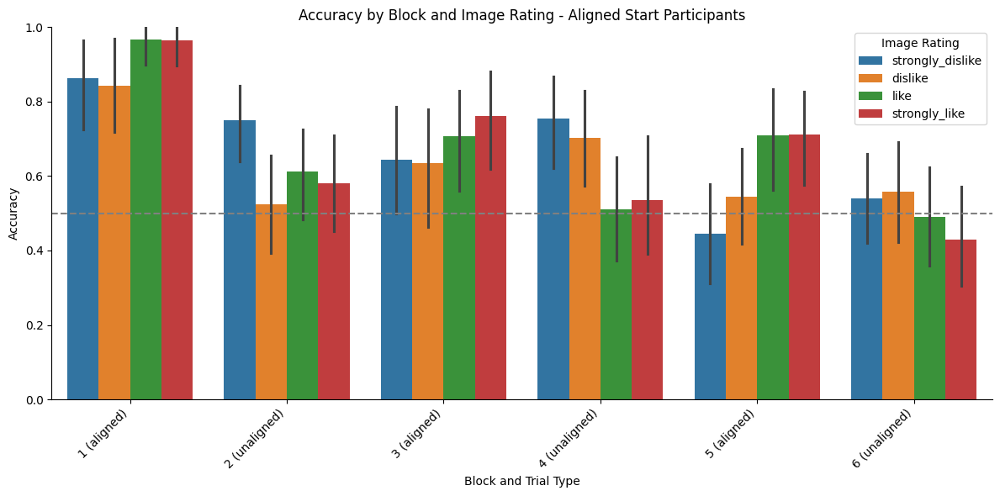

<Figure size 1200x800 with 0 Axes>

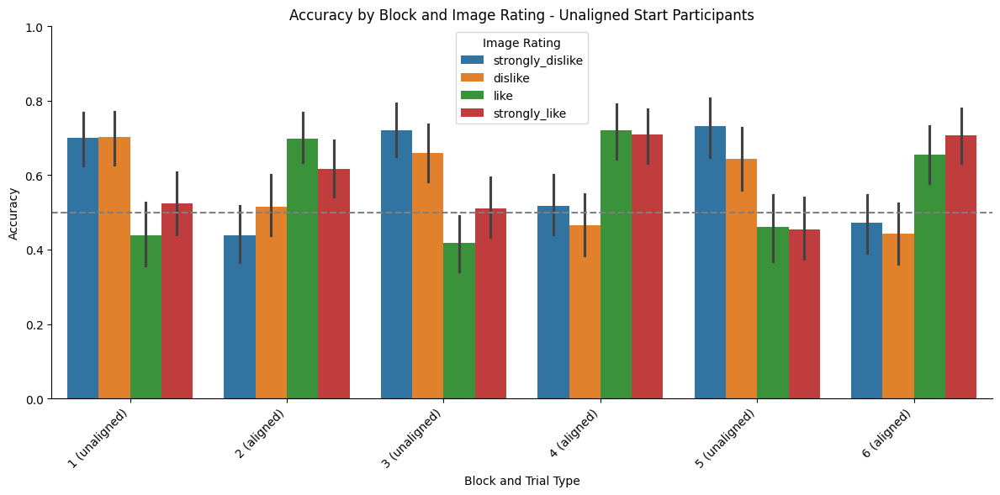

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize lists to store data from each participant
all_data = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Add participant ID to DataFrame
        df['Participant ID'] = participant_id

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Create a column that combines Block and Trial type
        df['Block_Type'] = df['Block'].astype(str) + ' (' + df['Trial type'] + ')'

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Append the DataFrame to the list
        all_data.append(df)

# Concatenate all DataFrames into a single DataFrame
all_data_df = pd.concat(all_data, ignore_index=True)

# Separate data based on the starting block type
aligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'aligned')
unaligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'unaligned')

# Define a function to plot accuracy by block and image rating for each group
def plot_accuracy_by_block_image_rating(data_df, title_suffix):
    # Ensure 'Image Rating' is in the specified order
    rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']
    data_df['Image Rating'] = pd.Categorical(data_df['Image Rating'], categories=rating_order, ordered=True)

    # Plot Accuracy by Block and Image Rating
    plt.figure(figsize=(12, 8))
    sns.catplot(
        data=data_df,
        x='Block_Type',
        y='Correct (Binary)',
        hue='Image Rating',
        hue_order=rating_order,  # Specify the order of the hue categories
        kind='bar',
        height=6,
        aspect=2,
        legend_out=False
    )

    plt.title(f'Accuracy by Block and Image Rating - {title_suffix} Participants')
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')  # Add a dotted line at y=0.5
    plt.ylim(0, 1)  # Set y-axis limits to 0-1
    plt.xlabel('Block and Trial Type')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()

# Plot for aligned-start participants
plot_accuracy_by_block_image_rating(aligned_start_df, 'Aligned Start')

# Plot for unaligned-start participants
plot_accuracy_by_block_image_rating(unaligned_start_df, 'Unaligned Start')


## Only last 15 trials of each block

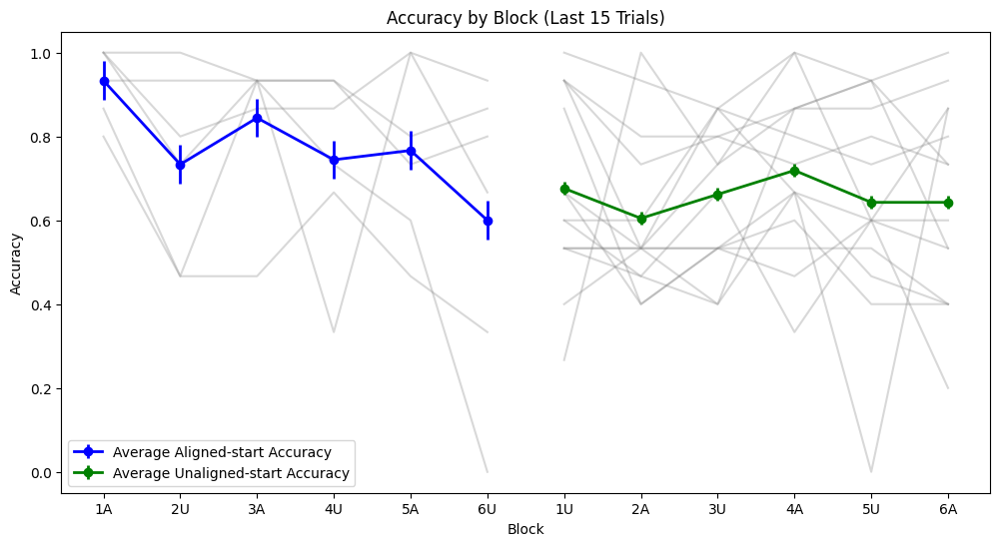

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, chi2_contingency

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize empty lists to store aggregated data
all_block_counts = []
all_block_accuracy = []
all_trial_type_accuracy = []
all_ttest_p_values_tt = []
all_overall_accuracy = []
all_image_rating_data = []
all_chi2_p_values = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Define blocks based on switches in 'Trial type'
        df['Block Number'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()
        df['Block'] = df['Block Number'].astype(str) + df['Trial type'].apply(lambda x: 'A' if x == 'aligned' else 'U')

        # Select only the last 15 trials of each block
        df_last_15 = df.groupby('Block Number').tail(15).reset_index(drop=True)

        # Number of trials in each 'Block'
        block_counts = df_last_15['Block'].value_counts()

        # Accuracy in each 'Block'
        block_accuracy = df_last_15.groupby('Block')['Correct (Theoretical)'].mean()

        # Accuracy per 'Trial type' (aligned and unaligned)
        trial_type_accuracy = df_last_15.groupby('Trial type')['Correct (Theoretical)'].mean()
        ttest_p_value_tt = ttest_ind(df_last_15[df_last_15['Trial type'] == 'aligned']['Correct (Theoretical)'],
                                     df_last_15[df_last_15['Trial type'] == 'unaligned']['Correct (Theoretical)'], nan_policy='omit').pvalue

        # Accuracy over the whole task (last 15 trials in each block)
        overall_accuracy = df_last_15.groupby('Block')['Correct (Theoretical)'].mean()

        # Accuracy as a function of 'Image Rating'
        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df_last_15['Correct (Binary)'] = df_last_15['Correct (Theoretical)'].astype(int)

        # Create a contingency table
        contingency_table = pd.crosstab(df_last_15['Image Rating'], df_last_15['Correct (Binary)'])

        # Perform chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)

        # Append data to lists
        all_block_counts.append(block_counts)
        all_block_accuracy.append(block_accuracy)
        all_trial_type_accuracy.append(trial_type_accuracy)
        all_ttest_p_values_tt.append(ttest_p_value_tt)
        all_overall_accuracy.append(overall_accuracy)
        all_image_rating_data.append(df_last_15.groupby('Image Rating')['Correct (Theoretical)'].mean())
        all_chi2_p_values.append(p)

# Plotting across participants

# Accuracy by Block with Error 'Cloud' for Average Accuracy for Aligned and Unaligned Starts
plt.figure(figsize=(12, 6))

# Separate data for 'Aligned' and 'Unaligned' starts
aligned_data = [block_accuracy for block_accuracy in all_block_accuracy if 'A' in block_accuracy.index[0]]
unaligned_data = [block_accuracy for block_accuracy in all_block_accuracy if 'U' in block_accuracy.index[0]]

# Plot individual accuracies (faint grey lines) and average lines with error 'cloud'
for block_accuracy in aligned_data:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_aligned_accuracy = pd.concat(aligned_data, axis=1).mean(axis=1)
plt.errorbar(avg_aligned_accuracy.index, avg_aligned_accuracy, yerr=avg_aligned_accuracy.sem(), fmt='-o', color='blue', lw=2, label='Average Aligned-start Accuracy')

for block_accuracy in unaligned_data:
    plt.plot(block_accuracy.index, block_accuracy, color='grey', alpha=0.3)  # Faint grey lines for individual accuracies
avg_unaligned_accuracy = pd.concat(unaligned_data, axis=1).mean(axis=1)
plt.errorbar(avg_unaligned_accuracy.index, avg_unaligned_accuracy, yerr=avg_unaligned_accuracy.sem(), fmt='-o', color='green', lw=2, label='Average Unaligned-start Accuracy')

plt.xlabel('Block')
plt.ylabel('Accuracy')
plt.title('Accuracy by Block (Last 15 Trials)')
plt.legend()
plt.show()


<IPython.core.display.Javascript object>

<Figure size 1200x800 with 0 Axes>

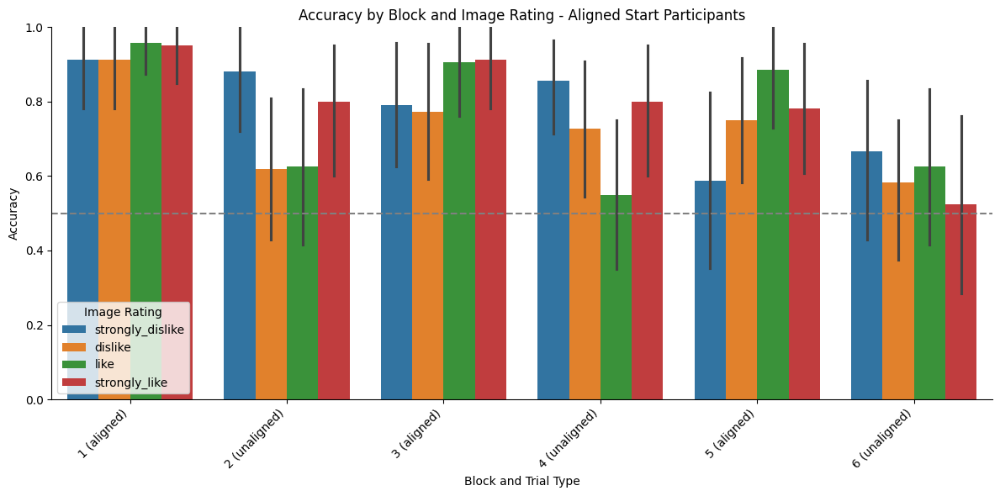

<Figure size 1200x800 with 0 Axes>

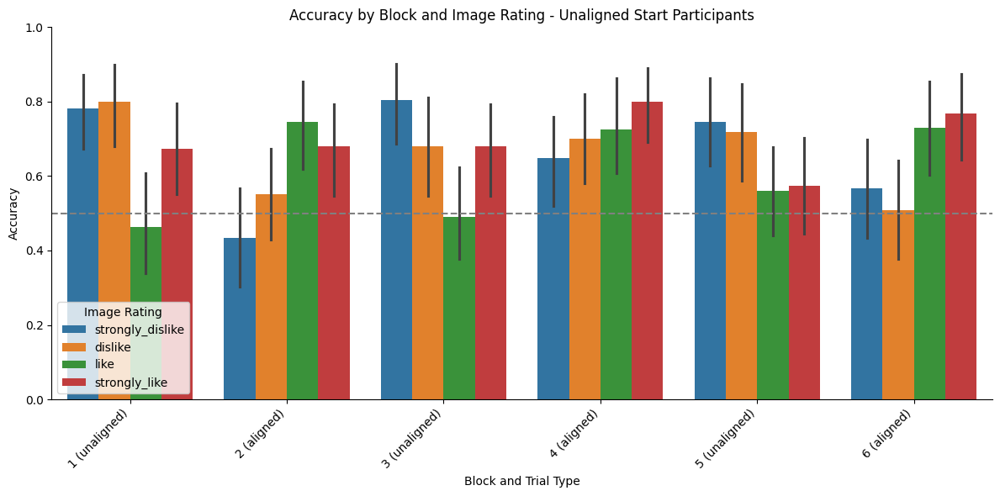

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Access the shared folder
shared_folder_path = "/content/drive/My Drive/Levy Lab/Value updating project/behavioral pilot analysis/online summer 2024"

# Initialize lists to store data from each participant
all_data = []

# Iterate over each CSV file in the folder
for file_name in os.listdir(shared_folder_path):
    if file_name.endswith('.csv'):
        # Read the CSV file into a DataFrame
        file_path = os.path.join(shared_folder_path, file_name)
        df = pd.read_csv(file_path)

        # Extract participant ID from file name (assuming the file name format is 'participant_id.csv')
        participant_id = file_name.split('.')[0].split('_')[0]

        # Add participant ID to DataFrame
        df['Participant ID'] = participant_id

        # Define blocks based on switches in 'Trial type'
        df['Block'] = (df['Trial type'] != df['Trial type'].shift(1)).cumsum()

        # Create a column that combines Block and Trial type
        df['Block_Type'] = df['Block'].astype(str) + ' (' + df['Trial type'] + ')'

        # Convert 'Correct (Theoretical)' to binary (1 for True, 0 for False)
        df['Correct (Binary)'] = df['Correct (Theoretical)'].astype(int)

        # Filter to only include the last 15 trials in each block
        df_last_15 = df.groupby('Block').tail(15)

        # Append the filtered DataFrame to the list
        all_data.append(df_last_15)

# Concatenate all DataFrames into a single DataFrame
all_data_df = pd.concat(all_data, ignore_index=True)

# Separate data based on the starting block type
aligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'aligned')
unaligned_start_df = all_data_df.groupby('Participant ID').filter(lambda x: x['Trial type'].iloc[0] == 'unaligned')

# Define a function to plot accuracy by block and image rating for each group
def plot_accuracy_by_block_image_rating(data_df, title_suffix):
    # Ensure 'Image Rating' is in the specified order
    rating_order = ['strongly_dislike', 'dislike', 'like', 'strongly_like']
    data_df['Image Rating'] = pd.Categorical(data_df['Image Rating'], categories=rating_order, ordered=True)

    # Plot Accuracy by Block and Image Rating
    plt.figure(figsize=(12, 8))
    sns.catplot(
        data=data_df,
        x='Block_Type',
        y='Correct (Binary)',
        hue='Image Rating',
        hue_order=rating_order,  # Specify the order of the hue categories
        kind='bar',
        height=6,
        aspect=2,
        legend_out=False
    )

    plt.title(f'Accuracy by Block and Image Rating - {title_suffix} Participants')
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Chance Level')  # Add a dotted line at y=0.5
    plt.ylim(0, 1)  # Set y-axis limits to 0-1
    plt.xlabel('Block and Trial Type')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()

# Plot for aligned-start participants
plot_accuracy_by_block_image_rating(aligned_start_df, 'Aligned Start')

# Plot for unaligned-start participants
plot_accuracy_by_block_image_rating(unaligned_start_df, 'Unaligned Start')
